# Music Genre Classification

### Task:
Develop machine learning algorithms that can predict a music genre for each sample, using the data music.csv

### Business goal:
To make the prediction for the music genre dataset; minimising error and maximising accurate classification. 

### Data used:
This dataset is an adapted version of a publicly available resource, which can be accessed at: [GTZAN Dataset on Kaggle.](https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/dat)

It contains:

CSV files (2) - Each file contains features of audio files. The first file, **features_30_sec.csv**, contains a mean and variance for multiple attributes extracted from 30-seconds-long samples of audio files. The second file, **features_3_sec.csv**, contains 10 times more data, due to each each song being split into 3 seconds samples. 

For the purpose of this project, I will refer to the features_30_sec.csv as **30s data** and, conversely, **3s data** to the features_3_s.csv dataset.  

Mel Spectrograms - A visual representation for each audio file that could be used in NNs.

An original GTZAN dataset collection of 100 audio files for each genre (10).

### Research Question:

**Q1.** Does Logistic Regression achieve higher accuracy scores when trained on the music dataset with removed outliers? 

**Q2.** Does Random Forest Classifier achieve higher accuracy scores when trained on the music dataset with outliers removed using Z-Score method as opposed to Interquartile Range (IQR) method?

**Q3.** Comparing the Statistical Significance of Manhattan and Euclidean Distance Metrics in Music Genre Classification Using the K-Nearest Neighbours (KNN) Algorithm.

**Q4.** Does increasing the number of features from 8 to 10 in a Logistic Regression Classifier statistically significantly improve the model's accuracy on the music dataset?

### Tools:

In [1]:
# Libraries necessary for the project:

import pandas as pd
from pandas.plotting import scatter_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats
from scipy.stats import shapiro
from scipy.stats import ttest_rel

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import learning_curve, cross_val_predict, cross_val_score
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve  
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import log_loss, accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV


# from sklearn.preprocessing import OneHotEncoder

# Hide warnings
# warnings.filterwarnings('ignore')
# Define seed value to conduct my experiments in a controlled environment
seed = 42
np.random.seed(seed)

In [2]:
# Custom function for checking assumptions for Wilcoxon signed-rank test

def check_wilcoxon_assumptions(scores_a, scores_b, model_name=""):
    """
    This function checks assumptions for Wilcoxon signed-rank test.
    
    Parameters:
    scores_a: CV RMSE scores for original (untrimmed) dataset
    scores_b: CV RMSE scores for transformed (trimmed) dataset
    model_name: name of the tested (and plotted) model
    """
    
    # Calculate differences between paired observations
    differences = scores_a - scores_b
    
    # Check if all observations (scores) are paired, i.e., of equal length
    print(f"*****Checking assumptions for {model_name}*****")
    print(f"Number of observations in sample A: {len(scores_a)}")
    print(f"Number of observations in sample B: {len(scores_b)}")
    
    # Check if differences are continuous (do they have decimal places)
    print(f"\nDifferences are continuous: {np.any(differences % 1 != 0)}")
    
    # Check if distribution of differences is symetrical in shape using Shapiro-Wilk test
    _, p_value = shapiro(differences)
    print(f"\nShapiro-Wilk test for normality of differences:")
    print(f"p-value: {p_value}")
    if p_value > 0.05:
        print('\nThe distribution of differences in scores is symmetrical in shape')
    else:
        print('\nThe distribution of differences in scores is NOT symmetrical in shape') 
    
    # return differences

In [3]:
# Custom function for sampling 10 random indices from a given y subset, where each row represents a unique genre in the music dataset. 
def get_samples_indicises(y_subset):
    """ Get indices for 10 random rows from the the music datset. 
    The function returns indices for rows from the given y_train set where all values (genres) are unique."""
    
    sampled_rows = y_train.sample(n=100, random_state=seed, replace=False).sort_values()

    # helper variables
    seen = []
    to_drop = []
    
    for i, genre in enumerate(sampled_rows):
        if genre not in seen:
            seen.append(genre) # if music genre is seen for the firts time
        else:
            to_drop.append(sampled_rows.index[i]) # drop if repeated genre
    
    sampled_rows = sampled_rows.drop(index=to_drop)

    return sampled_rows.index

### Importing Data:

In [4]:
# I import both datasets to compare them
data_30s = pd.read_csv("../Data/music/features_30_sec.csv")
data_3s = pd.read_csv("../Data/music/features_3_sec.csv")

### Quick look at the data structure:

In [5]:
# Display all columns in the datasets
pd.set_option('display.max_columns', None)

data_30s.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


Initial look at the '30s data' data reveals there are 60 columns (including the label), with 1000 entries (rows) of data. There don't appear to be any missing values. Regarding the data type of attributes, almost all of them hold numerical values (float64 and int64) apart from the 'filename' and 'label' columns which hold strings. 

In [6]:
data_30s.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 1000 non-null   object 
 1   length                   1000 non-null   int64  
 2   chroma_stft_mean         1000 non-null   float64
 3   chroma_stft_var          1000 non-null   float64
 4   rms_mean                 1000 non-null   float64
 5   rms_var                  1000 non-null   float64
 6   spectral_centroid_mean   1000 non-null   float64
 7   spectral_centroid_var    1000 non-null   float64
 8   spectral_bandwidth_mean  1000 non-null   float64
 9   spectral_bandwidth_var   1000 non-null   float64
 10  rolloff_mean             1000 non-null   float64
 11  rolloff_var              1000 non-null   float64
 12  zero_crossing_rate_mean  1000 non-null   float64
 13  zero_crossing_rate_var   1000 non-null   float64
 14  harmony_mean             

In [7]:
data_3s.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,1.080790e+06,0.081851,0.000558,-0.000078,0.008354,-0.000068,0.005535,129.199219,-118.627914,2440.286621,125.083626,260.956909,-23.443724,364.081726,41.321484,181.694855,-5.976108,152.963135,20.115141,75.652298,-16.045410,40.227104,17.855198,84.320282,-14.633434,83.437233,10.270527,97.001335,-9.708279,66.669891,10.183875,45.103611,-4.681614,34.169498,8.417439,48.269444,-7.233477,42.770947,-2.853603,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,6.722448e+05,0.087173,0.001030,-0.000099,0.004950,-0.000103,0.004854,123.046875,-125.590706,2038.344238,122.421227,216.774185,-20.718019,231.979767,50.128387,142.700409,-11.333302,139.243118,21.385401,77.817947,-15.960796,97.364029,19.454103,57.948093,-12.465918,68.271523,17.898169,56.222176,-11.732554,54.373909,8.145000,40.662876,-7.717751,30.808521,8.397150,48.784225,-8.300493,68.584824,4.074709,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,7.907127e+05,0.071383,0.000425,-0.000066,0.012476,0.000065,0.004357,123.046875,-132.441940,3798.532227,115.085175,257.321289,-14.811666,192.448074,50.189293,144.166031,-0.680819,128.376892,24.650375,66.371170,-13.506104,89.319336,15.643386,55.253967,-13.216637,120.308784,10.406025,35.757862,-7.991465,47.911613,11.853963,36.569931,-4.677677,40.725075,6.571110,30.686846,-2.424750,50.313499,4.806280,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,9.216524e+05,0.069426,0.000304,-0.000014,0.008318,0.000018,0.005927,123.046875,-118.231087,2508.781006,132.116501,332.650574,-18.758335,109.357529,39.769306,184.693344,-13.260426,144.398224,20.468134,122.516464,-14.563448,68.937332,18.745104,74.748886,-13.755463,73.868576,12.993759,41.549564,-12.648887,58.540478,10.389314,39.102024,-4.362739,60.714748,9.156193,40.411537,-9.889441,44.666325,-1.359111,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,6.102111e+05,0.070095,0.000289,0.000041,0.009634,-0.000106,0.005833,123.046875,-105.968376,2118.919922,134.643646,219.562622,-19.961748,171.878754,40.171753,103.120712,-14.271939,102.651230,18.734617,79.070000,-15.619381,48.510284,19.207966,53.642956,-18.274683,95.300995,14.316693,58.821163,-5.792194,55.030254,17.045437,43.229939,-5.681399,46.515259,5.705521,24.956211,-7.986080,39.816933,2.092937,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


When looking at the '3s data' I can see that the only structural difference from the '30s data' is in the number of entries (9990 as opposed to 1000), with the same number of features and data types.

In [8]:
data_3s.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 9990 non-null   object 
 1   length                   9990 non-null   int64  
 2   chroma_stft_mean         9990 non-null   float64
 3   chroma_stft_var          9990 non-null   float64
 4   rms_mean                 9990 non-null   float64
 5   rms_var                  9990 non-null   float64
 6   spectral_centroid_mean   9990 non-null   float64
 7   spectral_centroid_var    9990 non-null   float64
 8   spectral_bandwidth_mean  9990 non-null   float64
 9   spectral_bandwidth_var   9990 non-null   float64
 10  rolloff_mean             9990 non-null   float64
 11  rolloff_var              9990 non-null   float64
 12  zero_crossing_rate_mean  9990 non-null   float64
 13  zero_crossing_rate_var   9990 non-null   float64
 14  harmony_mean            

In [9]:
# Capture the column names for both datasets 

data_30s_columns = data_30s.columns
data_3s_columns = data_3s.columns

# Compare if both datasets have the same columns 
print(f"\nBoth datasets have the same columns: {all(data_30s_columns == data_3s_columns)}\n")


Both datasets have the same columns: True



### Exploratory Data Analysis (EDA) 

Summary statistics reveals that both datasets contain values with wide spread in terms of magnitude for each column. This means that scaling will be necessary at a later stage. 

In [10]:
data_3s.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,9990.0,9990.000000,9990.000000,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9990.000000,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000
mean,66149.0,0.379534,0.084876,0.130859,2.676388e-03,2199.219431,4.166727e+05,2241.385959,1.182711e+05,4566.076592,1.628790e+06,0.102578,0.002620,-0.000365,1.259757e-02,-0.000396,5.601553e-03,124.887709,-145.424643,2808.904199,100.988234,588.795354,-9.995014,374.137619,37.243725,183.911272,-2.009099,143.817714,15.395436,107.784375,-5.823034,98.505164,10.766659,74.795022,-7.569825,74.309310,8.283669,68.803998,-6.504168,63.812684,4.936315,57.790413,-5.186272,57.130389,2.164629,54.069345,-4.175271,52.678281,1.448240,49.988755,-4.198706,51.962753,0.739943,52.488851,-2.497306,54.973829,-0.917584,57.322614
std,0.0,0.090466,0.009637,0.068545,3.585628e-03,751.860611,4.349644e+05,543.854449,1.013505e+05,1642.065335,1.489398e+06,0.045651,0.003614,0.001699,1.263324e-02,0.001108,6.653225e-03,32.911676,106.456350,2596.256821,34.673178,459.705227,23.972522,294.470578,17.804460,133.164251,13.568717,109.272584,12.652512,75.900398,11.088698,65.536682,11.123007,45.881275,9.368422,44.733012,8.841558,41.864203,7.821168,40.218357,7.563187,37.481013,7.132049,35.746539,6.084283,37.715592,5.929457,37.251966,5.735149,34.442816,5.677379,36.400669,5.181313,38.177120,5.111799,41.585677,5.253243,46.444212
min,66149.0,0.107108,0.015345,0.000953,4.379535e-08,472.741636,8.118813e+02,499.162910,1.183520e+03,658.336276,1.145102e+03,0.013525,0.000005,-0.026672,9.312309e-23,-0.008794,4.672045e-08,24.377211,-662.171631,25.190538,-12.053392,9.665931,-104.249832,2.055229,-35.138493,3.540373,-47.886780,9.754141,-34.889263,5.267811,-45.187019,7.561506,-40.323467,6.899100,-39.451752,8.252314,-32.833546,7.584913,-40.008194,4.998892,-23.759195,2.345633,-29.350500,7.806118,-23.390091,3.230073,-30.467087,1.481917,-26.850016,1.325786,-27.809795,1.624544,-20.733809,3.437439,-27.448456,3.065302,-35.640659,0.282131
25%,66149.0,0.315698,0.079833,0.083782,6.145900e-04,1630.680158,1.231961e+05,1887.455790,4.876553e+04,3378.311110,5.595514e+05,0.067290,0.000628,-0.000127,4.086402e-03,-0.000579,1.106077e-03,103.359375,-201.474651,1143.226685,76.043871,270.420326,-26.884581,174.570415,24.450934,88.392767,-11.881086,67.975819,5.759286,53.944843,-14.464527,51.585960,2.528776,42.255037,-14.569940,42.856218,1.734222,40.205816,-12.203228,37.617884,-0.433691,34.455327,-10.352716,34.844897,-1.860355,32.415298,-8.184258,31.237773,-2.227478,29.584894,-7.951722,29.863448,-2.516638,29.636197,-5.734123,30.496412,-4.004475,30.011365
50%,66149.0,0.384741,0.085108,0.121253,1.491318e-03,2208.628236,2.650692e+05,2230.575595,8.996072e+04,4631.377892,1.160080e+06,0.097868,0.001390,-0.000013,8.429785e-03

In [194]:
data_30s.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,662030.846000,0.378682,0.086340,0.130930,0.003051,2201.780898,4.696916e+05,2242.541070,137079.155165,4571.549304,1.844345e+06,0.103612,0.002986,-3.659332e-04,0.012540,-0.000395,5.670073e-03,119.505363,-144.472987,3747.875414,99.554278,706.899539,-8.920291,468.286436,36.292447,220.447219,-1.144840,174.404462,14.633491,127.232071,-5.129038,116.367019,10.119172,88.198988,-6.994062,88.566933,7.729785,81.733490,-6.021069,75.551228,4.471693,68.670817,-4.795884,67.871712,1.781900,64.764096,-3.869308,62.873761,1.148144,60.730958,-3.966028,62.633624,0.507696,63.712586,-2.328761,66.231930,-1.095348,70.126096
std,1784.073992,0.081705,0.007735,0.065683,0.003634,715.960600,4.008995e+05,526.316473,96455.666326,1574.791602,1.425085e+06,0.041821,0.003024,1.683946e-03,0.011653,0.001082,6.500325e-03,28.264176,100.229406,2770.558394,31.330873,439.120256,21.690676,287.143462,16.664665,116.236941,12.221340,100.767823,11.839591,68.475115,9.940460,58.400048,10.463270,41.048213,8.283921,39.494072,7.937309,36.733649,6.817013,38.135183,6.715787,32.625534,6.170181,33.154276,5.008385,34.450290,4.873599,33.904101,4.578948,33.781951,4.549697,33.479172,3.869105,34.401977,3.755957,37.174631,3.837007,45.228512
min,660000.000000,0.171939,0.044555,0.005276,0.000004,570.040355,7.911251e+03,898.066208,10787.185064,749.140636,1.468612e+04,0.021697,0.000044,-2.606458e-02,0.000049,-0.007150,8.299008e-07,54.978391,-552.120056,174.571365,-1.461542,93.104752,-89.870193,35.467754,-18.727547,34.263149,-38.890347,29.912008,-28.415911,20.847921,-32.930431,29.027332,-24.915823,22.464230,-31.640574,25.825863,-12.050177,19.273201,-28.057501,21.402756,-15.796446,18.642517,-27.523129,17.293922,-12.594489,14.250607,-17.539125,9.769691,-15.693844,9.169314,-17.234728,13.931521,-11.963694,15.420555,-18.501955,13.487622,-19.929634,7.956583
25%,661504.000000,0.319562,0.082298,0.086657,0.000942,1627.697311,1.843505e+05,1907.240605,67376.554428,3380.069642,7.727312e+05,0.070244,0.001079,-1.041584e-04,0.004383,-0.000537,1.292592e-03,99.384014,-200.763893,1844.488129,76.779915,398.020767,-24.219811,270.466576,24.108212,129.397377,-9.979157,101.266209,5.098573,76.505194,-12.870810,73.546917,1.609181,57.349041,-13.246939,59.882313,1.620753,55.734016,-10.964135,51.242420,-0.547371,46.854038,-9.357906,46.294396,-1.639417,43.416593,-7.165884,42.236251,-1.863280,40.376442,-7.207225,40.830875,-2.007015,41.884240,-4.662925,41.710184,-3.368996,42.372865
50%,661794.000000,0.383148,0.086615,0.122443,0.001816,2209.263090,3.384862e+05,2221.392843,111977.548036,4658.524473,1.476115e+06,0.099503,0

In [ ]:
# compare paired mean values for each column in both datasets using a statistical test.
# exclude first two columns (filename, length and label)

# Wilcoxon signed-rank test?

The **target class (label)** in the ML training will be the 'label' column, so I check if the data for all music genres is balanced and the answer is yes, the number of entries for all genres is nearly identical. 


Labels count in data_3s:

label
blues        1000
jazz         1000
metal        1000
pop          1000
reggae       1000
disco         999
classical     998
hiphop        998
rock          998
country       997
Name: count, dtype: int64

Labels count in data_30s:

label
blues        100
classical    100
country      100
disco        100
hiphop       100
jazz         100
metal        100
pop          100
reggae       100
rock         100
Name: count, dtype: int64


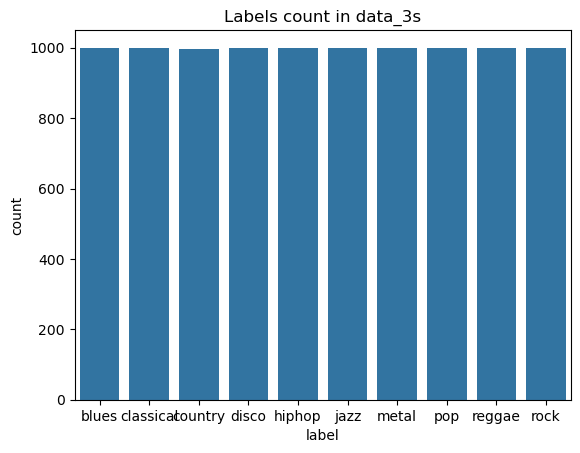

In [11]:
# Check if both datasets are balanced
labels_count_3s = data_3s['label'].value_counts()
print("\nLabels count in data_3s:\n")
print(labels_count_3s)

labels_count_30s = data_30s['label'].value_counts()
print("\nLabels count in data_30s:\n")
print(labels_count_30s)

sns.countplot(data_3s, x='label')
plt.title("Labels count in data_3s")
plt.show()

I drop the first two columns ('filename', 'length') as they won't be needed for now.

In [12]:
data_3s_v1 = data_3s.iloc[:,2:]
data_30s_v1 = data_30s.iloc[:,2:]

In [13]:
# missing values in the datasets?

null_3s = data_3s_v1[data_3s_v1.isnull().any(axis=1)].shape[0]
null_30s = data_30s_v1[data_30s_v1.isnull().any(axis=1)].shape[0]

print(f"\nRows with missing values in data_3s: {null_3s}\nRows with missing values in data_30s: {null_30s}\n")


Rows with missing values in data_3s: 0
Rows with missing values in data_30s: 0



In [ ]:
# write-up: choosing to work with 3s data as it has more data and is very similar to 30s.

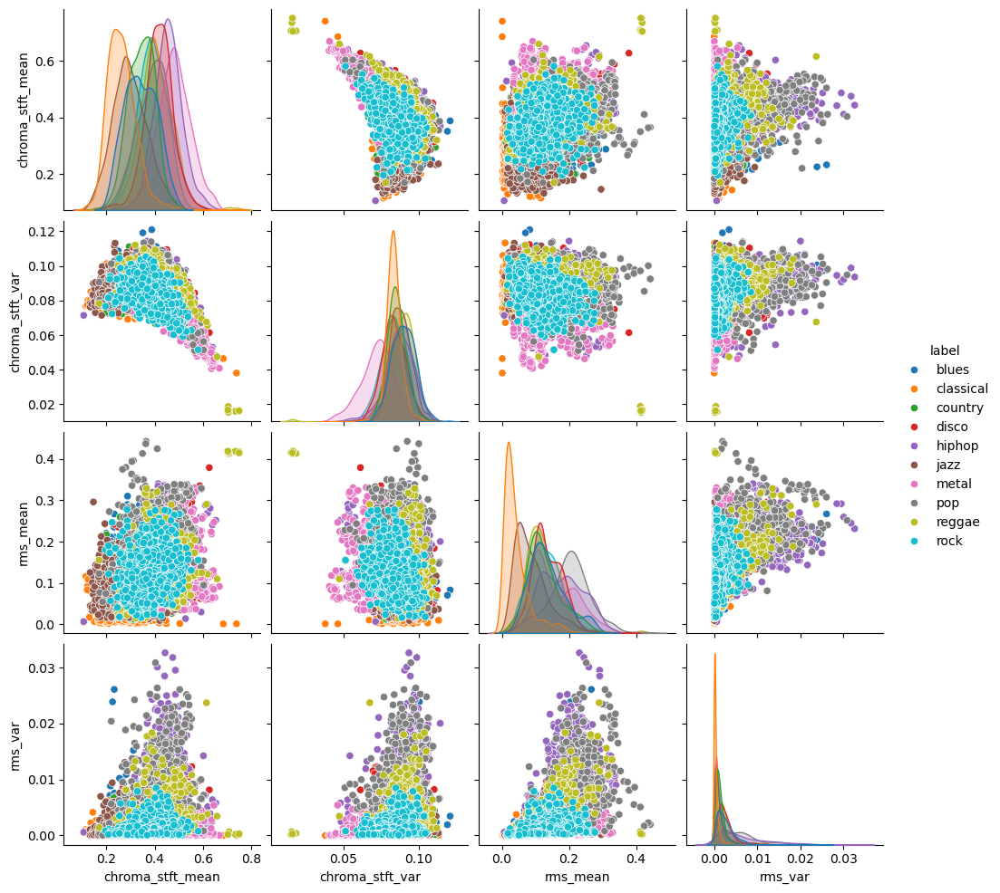

In [14]:
# the total number of features makes visualisation of variables impractical
# I will select the most promisinf features and then visualise them 
# only plotting the first 4 features at this stage to get the general insight into the dataset

feature_taster = data_3s.columns[2:6].union(['label'])

sns.pairplot(
    data=data_3s[feature_taster], 
    hue='label'
)
plt.show()

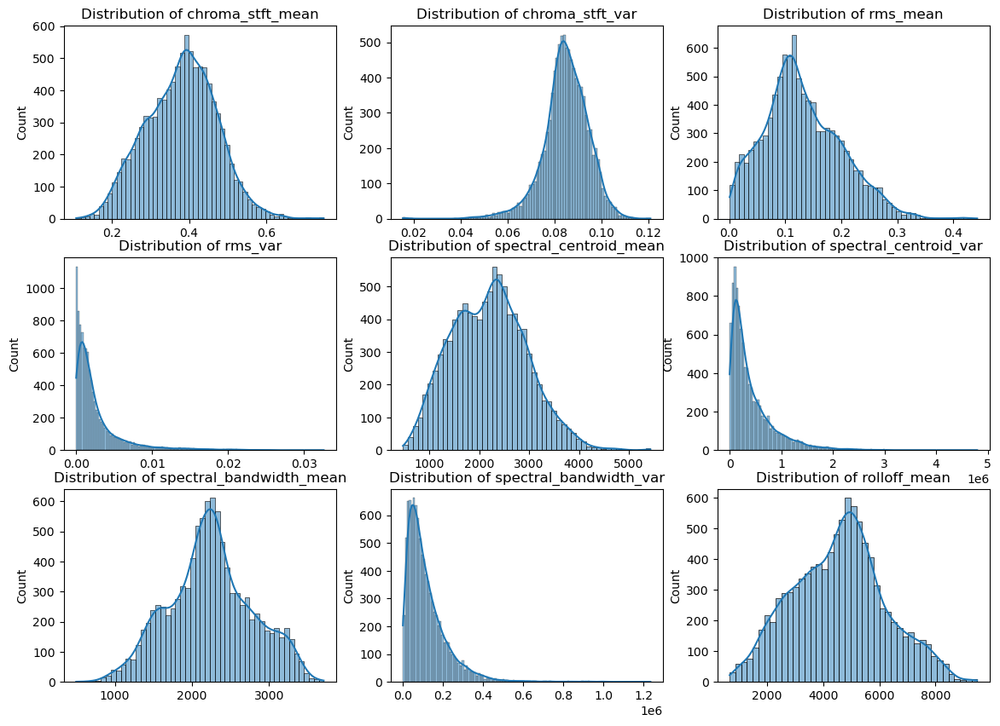

In [15]:
# print histograms for the first 9 features to gain more 
# insight about the spread of their values

# print histograms for the first 9 features
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
axes = axes.ravel()
for i, feature in enumerate(data_3s_v1.columns[:9]):
    sns.histplot(data=data_3s_v1, x=feature, ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel('')

plt.show()

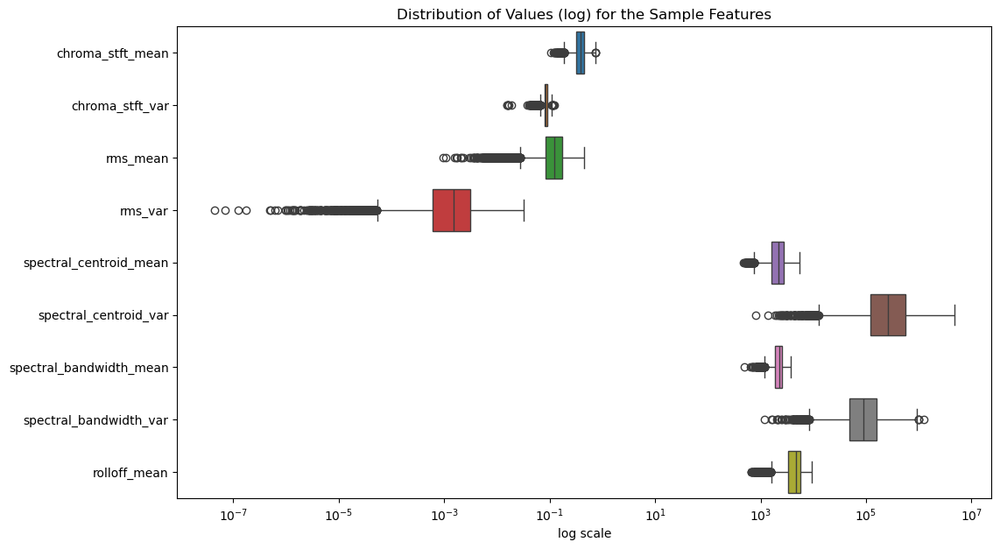

In [16]:
# boxplot for the first 9 features
# to explore outliers in the selected features
boxplot_9_features = data_3s.iloc[:,2:11]

# # Plot the feature importances
plt.figure(figsize=(12, 7))
plt.title('Distribution of Values (log) for the Sample Features')
plt.xlabel('log scale')
sns.boxplot(data=boxplot_9_features, log_scale=True, orient='h')

plt.show()

In [17]:
# write-up: I cannot see any pair of features have a clear boundary, 
# logistic regression is likely to perform pretty poorly in this ML problem.

### Feature selection

#### Linear Correlation

I explore standard correlation coefficients for each numeric variable in the dataset with the heatmap. Very quickly it beacomes clear to me that this method will not be very useful in the context of so many variables. Another important caveat is that using this approach I will not find non-linear relationships in the data that might be cruicial.  

<Axes: >

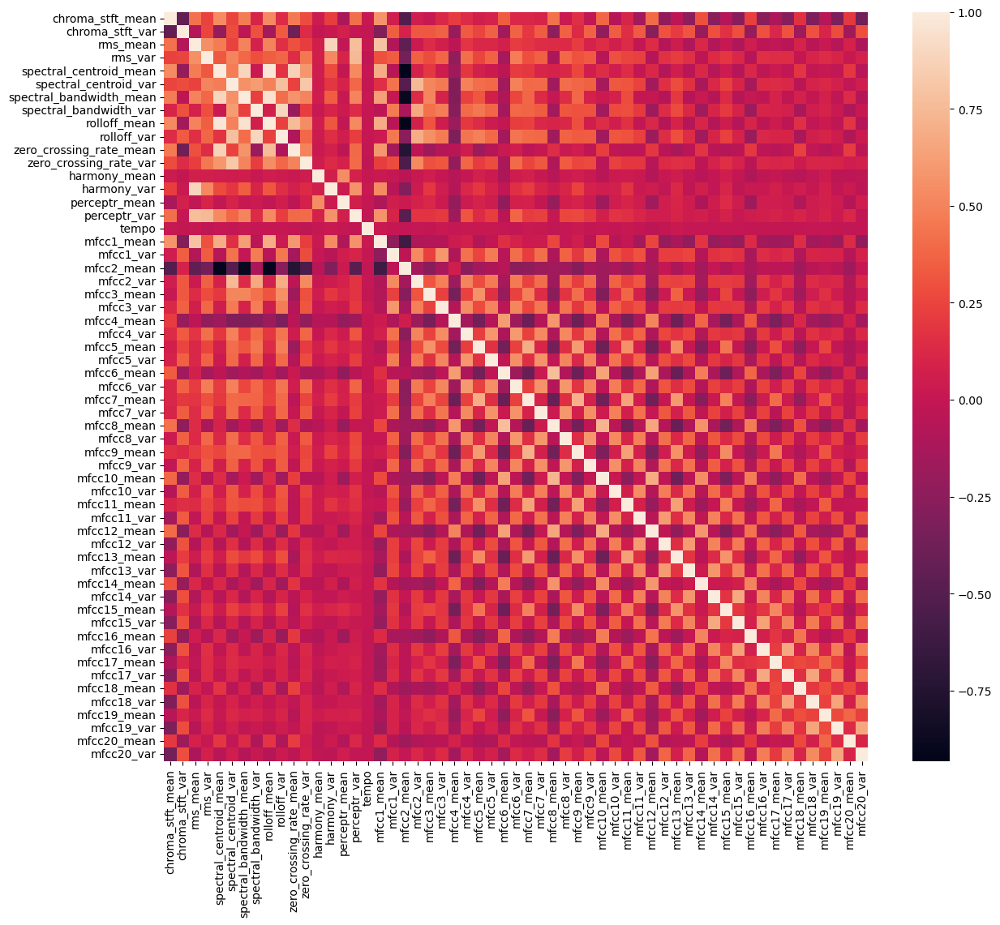

In [18]:
corr_matrix = data_3s_v1.corr(numeric_only=True) # produce correlation matrix for numeric attributes only

plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix)

The strongest correlations appera to be present in the upper left corner of the heatmap. I zoom in to better see the first 20 attributes:

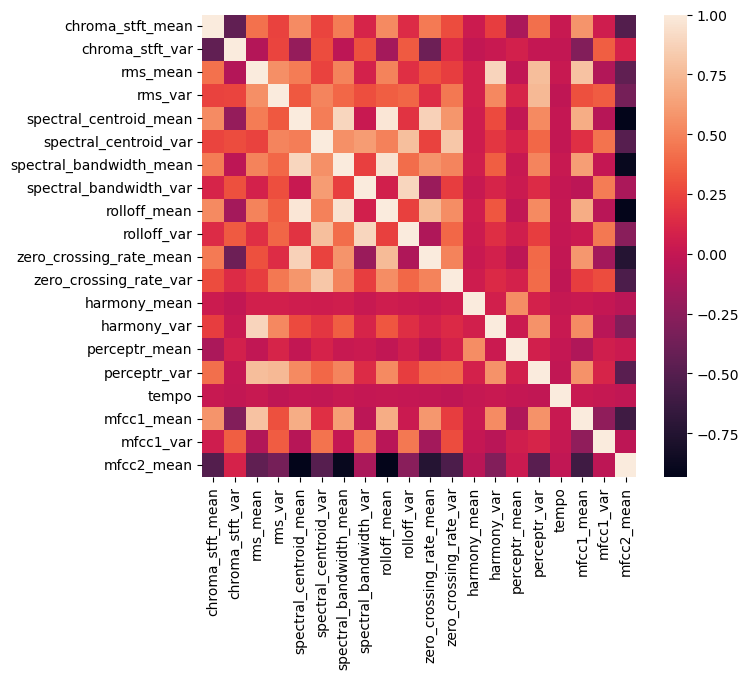

In [19]:
corr_selection = corr_matrix.iloc[:20,:20]

plt.figure(figsize=(7, 6))
sns.heatmap(corr_selection)
plt.show()

The more 'focused' heatmap helps to zone in on the promising features for linear relationships.

In [20]:
# prepare temporary train/test sets for feature imporatance search

input_features_temp, target_temp = data_3s_v1.iloc[:,:-1], data_3s_v1.iloc[:,-1:]

# Temporarily split the data into training and testing sets for the feature importance search
X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(input_features_temp, target_temp, 
                                                                        test_size=0.2, random_state=seed, 
                                                                        stratify=data_3s_v1['label'])
# Convert target to 1D array
y_train_temp = y_train_temp.squeeze()
y_test_temp = y_test_temp.squeeze()

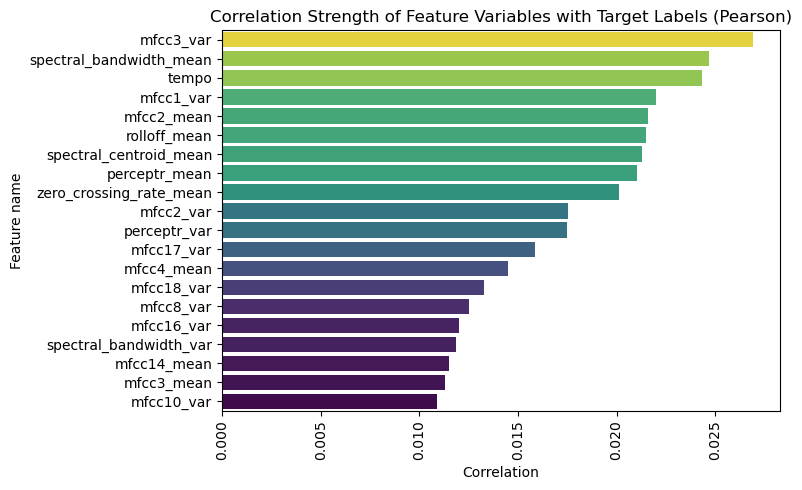

In [21]:
# Explore Pearson's corelation coefficients with the target variable

# encode labels in y
l_encoder = LabelEncoder()
y_encoded_temp = pd.Series(l_encoder.fit_transform(y_train_temp), name='target_label')

correlation_with_target = X_train_temp.apply(lambda col: col.corr(y_encoded_temp)).abs()
correlation_pearson = correlation_with_target.sort_values(ascending=False)[:20]

# # Plot the 10 strongest correlations (Pearson's)
plt.figure(figsize=(8, 5))
plt.title('Correlation Strength of Feature Variables with Target Labels (Pearson)')
plt.xlabel('Correlation')
plt.ylabel('Feature name')
sns.barplot(x=correlation_pearson, y=correlation_pearson.index, 
            hue=correlation_pearson, palette='viridis', legend=None)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


#### Correlation-Based Feature Selection (CBFS)

In [22]:
# use Correlation-Based Feature Selection (CBFS) to dentify features with strong positive or negative correlation to the target
# and eliminate features that are highly correlated with each other to minimize multi-collinearity among selected features

def cbfs(X, y, corr_y_threshold=0.005, corr_other_threshold=0.05):

    # Calculate correlation of all feature variables with target variable
    correlation_with_target = X.apply(lambda col: col.corr(y)).abs()
    
    # Calculate correlations between all feature variables
    feature_correlation_matrix = X.corr().abs()
    
    # Select features based on correlation criteria
    selected_features = []
    for feature in X.columns:
        # Check correlation with target if it's larger than the threshold
        if correlation_with_target[feature] >= corr_y_threshold:
            # Check for low inter-feature correlation
            low_inter_corr = all([abs(feature_correlation_matrix.loc[feature, other]) < corr_other_threshold for other in selected_features])
            if low_inter_corr or len(selected_features) == 0:
                selected_features.append(feature)
    
    return X[selected_features].columns

cbfs_selected_features = cbfs(X_train_temp, y_encoded_temp, corr_y_threshold=0.005, corr_other_threshold=0.5)

# Correlation-Based Feature Selection with chosen thresholds
pd.Series(cbfs_selected_features)

0            chroma_stft_mean
1             chroma_stft_var
2                     rms_var
3     spectral_bandwidth_mean
4      spectral_bandwidth_var
5                harmony_mean
6                       tempo
7                   mfcc1_var
8                  mfcc4_mean
9                   mfcc4_var
10                 mfcc5_mean
11                  mfcc9_var
12                mfcc10_mean
13                 mfcc13_var
14                mfcc16_mean
15                 mfcc16_var
16                mfcc17_mean
17                mfcc18_mean
18                 mfcc19_var
19                mfcc20_mean
dtype: object

#### Mutual Information

In [23]:
# Exploring mutual information to capture complex non-linear relationships between the feature variables and target variable
# similarly to estimating k-nearest neighbors distances

mutual_info = mutual_info_classif(X_train_temp, y_encoded_temp)

# sort in descending order 
sorted_indices = np.argsort(mutual_info)[::-1]
mutual_info_sorted = mutual_info[sorted_indices]
feature_names_sorted = X_train_temp.columns[sorted_indices]

# store 10 features with the highest estimates in a variable
mutual_10_features = feature_names_sorted[:10]

# display features with th highest 20 mutual information estimates as a series
pd.Series(mutual_info_sorted, index=feature_names_sorted)[:20]

perceptr_var               0.512828
spectral_bandwidth_mean    0.425957
rolloff_mean               0.393759
rms_var                    0.389302
chroma_stft_mean           0.376499
spectral_centroid_var      0.364346
mfcc1_mean                 0.360074
spectral_centroid_mean     0.355104
rms_mean                   0.337216
rolloff_var                0.307851
mfcc2_mean                 0.305883
zero_crossing_rate_var     0.269443
harmony_var                0.259325
mfcc4_mean                 0.256433
mfcc4_var                  0.255478
mfcc6_mean                 0.237225
mfcc5_var                  0.236411
mfcc6_var                  0.235510
mfcc8_mean                 0.231127
zero_crossing_rate_mean    0.226165
dtype: float64

#### Built-in Random Forest Feature Importance

In [24]:
# feature selection with Random Forest

# Train the RandomForestClassifier to find feature importance
model_feat_imp = RandomForestClassifier(n_estimators=50, random_state=seed)
model_feat_imp.fit(X_train_temp, y_train_temp)

# Extract feature importances
feature_importances = model_feat_imp.feature_importances_

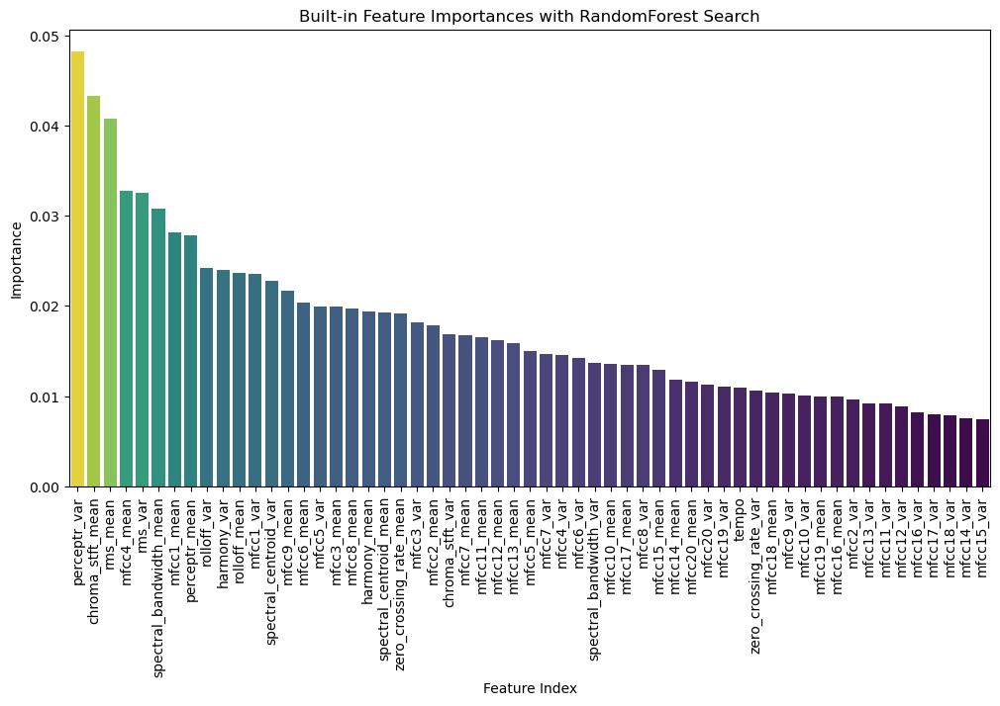

In [25]:
# Plot feature importances from high to low

sorted_indices = np.argsort(feature_importances)[::-1]  # Sort indices

# # Plot the feature importances
plt.figure(figsize=(12, 6))
plt.title('Built-in Feature Importances with RandomForest Search')
plt.xlabel('Feature Index')
plt.ylabel('Importance')

sns.barplot(x=X_train_temp.columns[sorted_indices], y=feature_importances[sorted_indices], errorbar=None,
           hue=feature_importances[sorted_indices],palette='viridis', legend=None)
plt.xticks(rotation=90)
plt.show()

In [26]:
# 10 features with the highest importance according to RandomForest search

rand_for_10_features = X_train_temp.columns[sorted_indices][:10]
pd.Series(feature_importances[sorted_indices][:10],index=rand_for_10_features)

perceptr_var               0.048212
chroma_stft_mean           0.043250
rms_mean                   0.040740
mfcc4_mean                 0.032749
rms_var                    0.032571
spectral_bandwidth_mean    0.030811
mfcc1_mean                 0.028179
perceptr_mean              0.027834
rolloff_var                0.024174
harmony_var                0.024018
dtype: float64

#### Built-in Gradient Boosting Classifier Feature Importance

In [27]:
# # Commented out because of long computing time
# # Use Gradient Boosting Classifier to explore feature importance


# gb_classifier = GradientBoostingClassifier(n_estimators=50,
#                                            learning_rate=0.1,
#                                            max_depth=3,
#                                            random_state=seed 
# )

# # Fit the model
# gb_classifier.fit(X_train_temp, y_encoded_temp)

# # Extract feature importances
# feature_importances_gb = gb_classifier.feature_importances_

In [28]:
feature_importances_gb = np.array([
       0.0421065, 0.04033421, 0.01362731, 0.04876308, 0.00888433,
       0.01230539, 0.07286134, 0.00607808, 0.01371636, 0.03355423,
       0.02062065, 0.00156126, 0.02460124, 0.02730365, 0.04591387,
       0.17132201, 0.01867237, 0.01969555, 0.03197536, 0.00818419,
       0.00139946, 0.01550472, 0.01206165, 0.06084182, 0.00916543,
       0.01268043, 0.0176924 , 0.01905511, 0.00603167, 0.01193651,
       0.01250277, 0.01263111, 0.00605804, 0.02972906, 0.00417507,
       0.00582354, 0.00650431, 0.01619667, 0.00159928, 0.01545807,
       0.00419572, 0.00792642, 0.00114267, 0.00717466, 0.00049281,
       0.00139969, 0.00138801, 0.00425746, 0.00136042, 0.00949407,
       0.00142388, 0.00159067, 0.00167921, 0.00170404, 0.00611592,
       0.00530079, 0.00422549
])

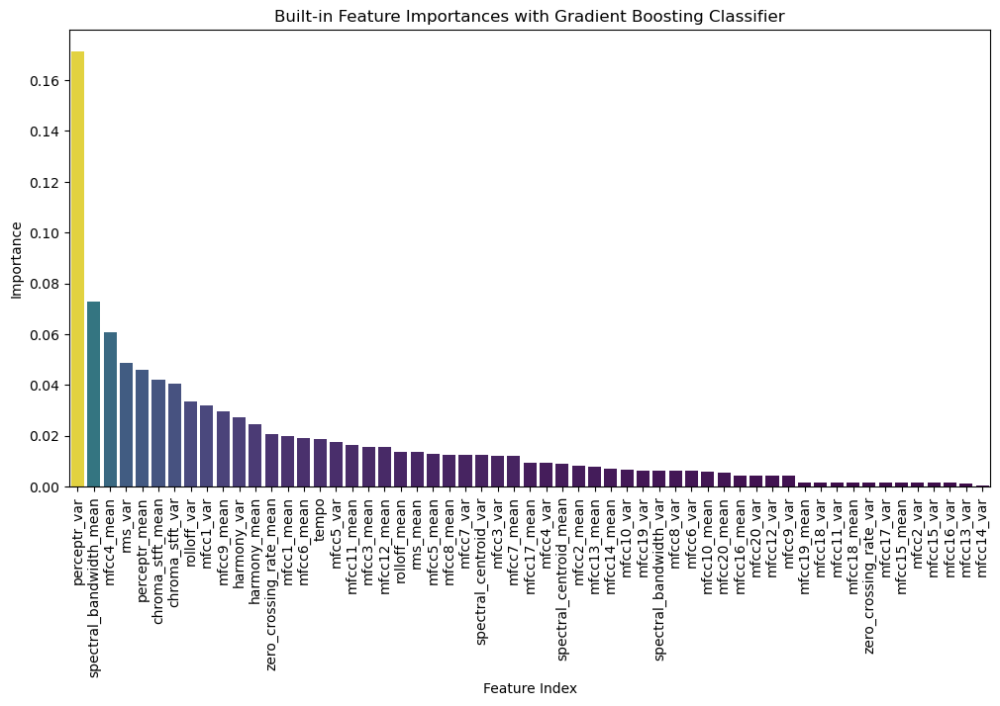

In [29]:
# Plot built-in feature importances from Gradient Boosting Classifier

sorted_indices = np.argsort(feature_importances_gb)[::-1]  # Sort indices

# store 10 features with the highest importance according to GBClassifier
gb_10_features = X_train_temp.columns[sorted_indices][:10]

# # Plot the feature importances
plt.figure(figsize=(12, 6))
plt.title('Built-in Feature Importances with Gradient Boosting Classifier')
plt.xlabel('Feature Index')
plt.ylabel('Importance')

sns.barplot(x=X_train_temp.columns[sorted_indices], y=feature_importances_gb[sorted_indices], errorbar=None,
           hue=feature_importances_gb[sorted_indices], palette='viridis', legend=None)
plt.xticks(rotation=90)
plt.show()

#### Permutation Feature Importance

In [30]:
# # Commented out because of long computing time
# # Explore feature significance with Permutation Feature Importance


# # train default RandomForest model for the permutation imporatance 
# perm_model = RandomForestClassifier(random_state=seed)
# perm_model.fit(X_train_temp, y_train_temp)

# perm_importance = permutation_importance(perm_model, 
#                                          X_train_temp,
#                                          y_train_temp,
#                                          n_repeats=10,
#                                          scoring='accuracy',
#                                          random_state=seed
# )

In [31]:
# perm_importance_mean = perm_importance.importances_mean
# the output permutation mean stored in the variable for computational reasons

perm_importance_mean = np.array([
        3.92892893e-03,  1.50150150e-04,  7.50750751e-05,  2.22044605e-17,
        2.50250250e-05,  7.50750751e-05,  5.00500501e-05, -1.00100100e-04,
       -2.50250250e-05,  5.00500501e-05,  7.50750751e-05,  0.00000000e+00,
       -2.50250250e-05,  2.22044605e-17,  0.00000000e+00,  5.00500501e-04,
        0.00000000e+00,  1.25125125e-04,  1.00100100e-04, -5.00500501e-05,
        7.50750751e-05,  2.22044605e-17, -7.50750751e-05,  1.30130130e-03,
        2.22044605e-17, -2.50250250e-05, -2.50250250e-05,  7.50750751e-05,
        0.00000000e+00, -1.00100100e-04,  7.50750751e-05, -2.50250250e-05,
        0.00000000e+00,  3.50350350e-04,  5.00500501e-05,  2.22044605e-17,
        7.50750751e-05, -2.50250250e-05,  7.50750751e-05,  1.25125125e-04,
        0.00000000e+00, -7.50750751e-05,  2.50250250e-05,  7.50750751e-05,
        5.00500501e-05,  2.50250250e-05,  5.00500501e-05,  5.00500501e-05,
        5.00500501e-05,  2.50250250e-05,  0.00000000e+00,  0.00000000e+00,
        2.50250250e-05,  5.00500501e-05,  4.44089210e-17, -1.00100100e-04,
        5.00500501e-05
])

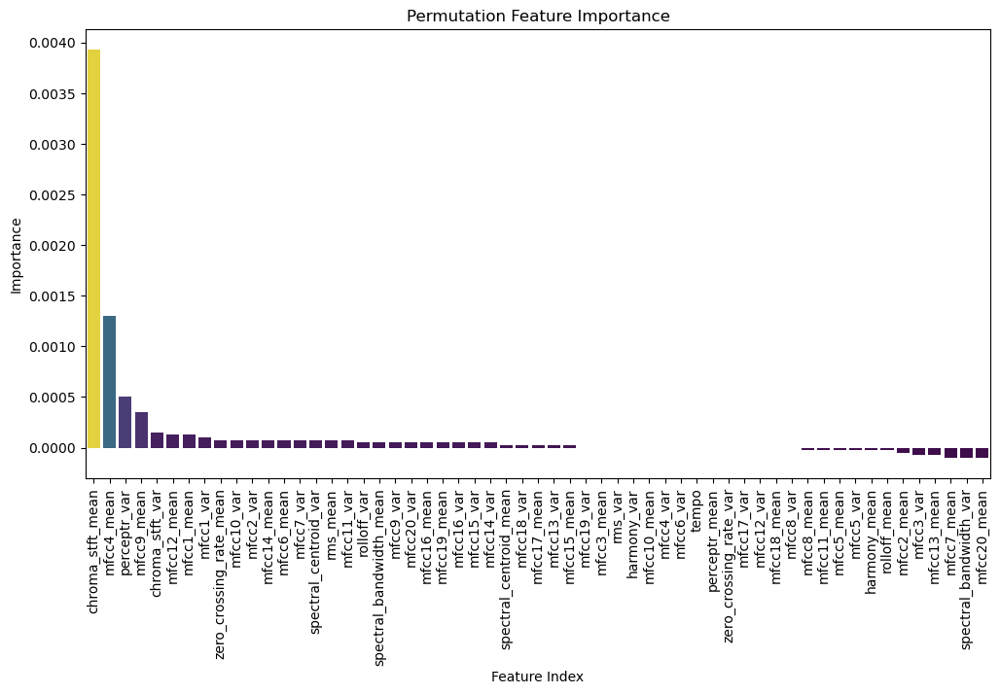

In [32]:
sorted_indices = np.argsort(perm_importance_mean)[::-1]

perm_importance_mean_sorted = perm_importance_mean[sorted_indices]
perm_importance_features = X_train_temp.columns[sorted_indices]


# # Plot the feature importances
plt.figure(figsize=(12, 6))
plt.title('Permutation Feature Importance')
plt.xlabel('Feature Index')
plt.ylabel('Importance')

sns.barplot(x=perm_importance_features, y=perm_importance_mean_sorted, 
            hue=perm_importance_mean_sorted, palette='viridis', errorbar=None, legend=None)
plt.xticks(rotation=90)
plt.show()

In [33]:
# store the 10 features with the highest score in the variable
permutation_10_features = perm_importance_features[:10]

# display the 10 features together with their highest accuracy scores as series
pd.Series(perm_importance_mean_sorted[:10], index=permutation_10_features)

chroma_stft_mean           0.003929
mfcc4_mean                 0.001301
perceptr_var               0.000501
mfcc9_mean                 0.000350
chroma_stft_var            0.000150
mfcc12_mean                0.000125
mfcc1_mean                 0.000125
mfcc1_var                  0.000100
zero_crossing_rate_mean    0.000075
mfcc10_var                 0.000075
dtype: float64

In [34]:
# compute count for the most frequent features in the search
best_features_names = [
    cbfs_selected_features,
    mutual_10_features,
    rand_for_10_features,
    gb_10_features,
    permutation_10_features
]

best_features_collected = pd.Series()
f_number = 0

for features in best_features_names:
    f_number += len(features)
    best_features_collected = pd.concat([best_features_collected, pd.Series(features)],ignore_index=True)

best_features_counts = best_features_collected.value_counts().sort_values(ascending=False)

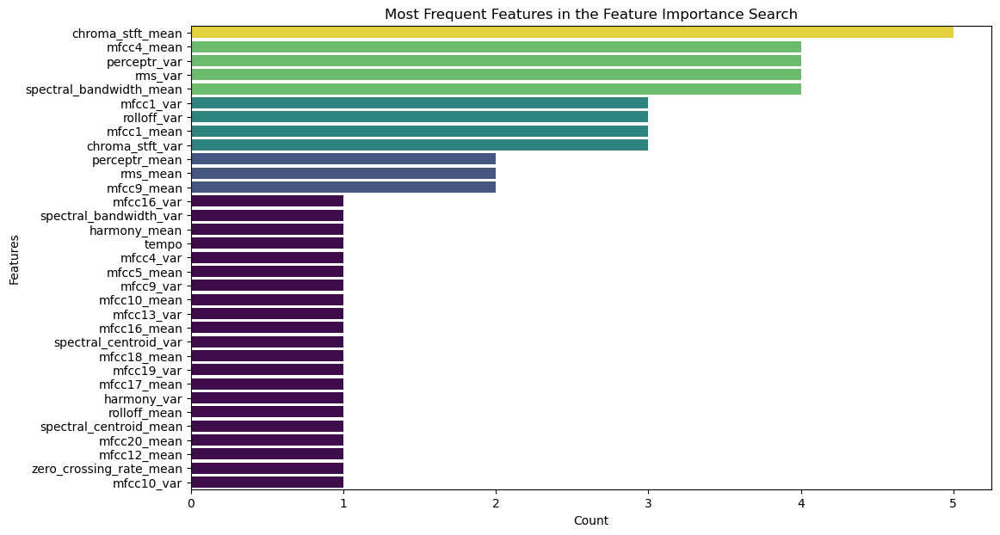

In [35]:
# plot best features with their counts

plt.figure(figsize=(12, 7))
plt.title('Most Frequent Features in the Feature Importance Search')
plt.xlabel('Count')
plt.ylabel('Features')

# Create horizontal bar plot
sns.barplot(
    x=best_features_counts.values, 
    y=best_features_counts.index, 
    palette='viridis',
    hue=best_features_counts.values,
    legend=None
)
plt.show()

In [36]:
# store the features that appeared at least twice in the feature selection search
selected_features = list(best_features_counts.index[:12]) # 12 features

# store all features from the feature selection search (for additional experiments)
all_best_features = list(best_features_counts.index)

In [37]:
# selection of features
selected_features

['chroma_stft_mean',
 'mfcc4_mean',
 'perceptr_var',
 'rms_var',
 'spectral_bandwidth_mean',
 'mfcc1_var',
 'rolloff_var',
 'mfcc1_mean',
 'chroma_stft_var',
 'perceptr_mean',
 'rms_mean',
 'mfcc9_mean']

#### Context and Domain Knowledge

In [38]:
# Literature review about selected features. Compare domain knowledge with the ones that have been found in the searches above


Features: 1 to 4



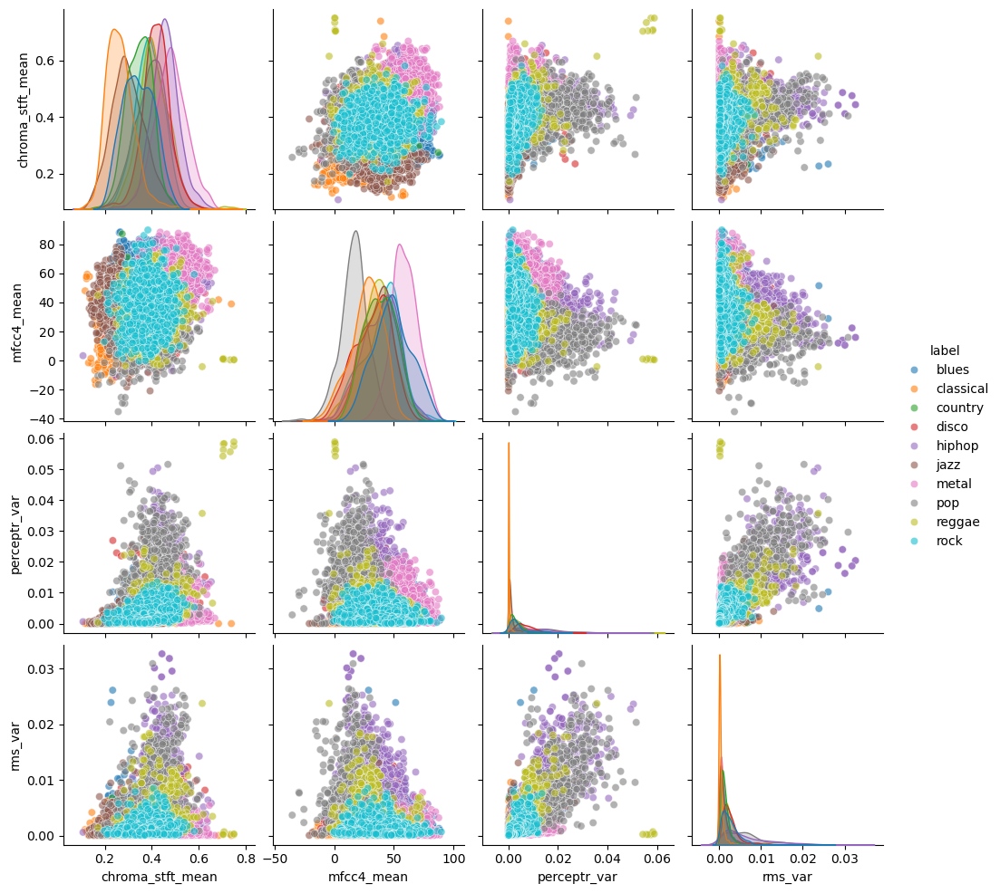


Features: 5 to 8



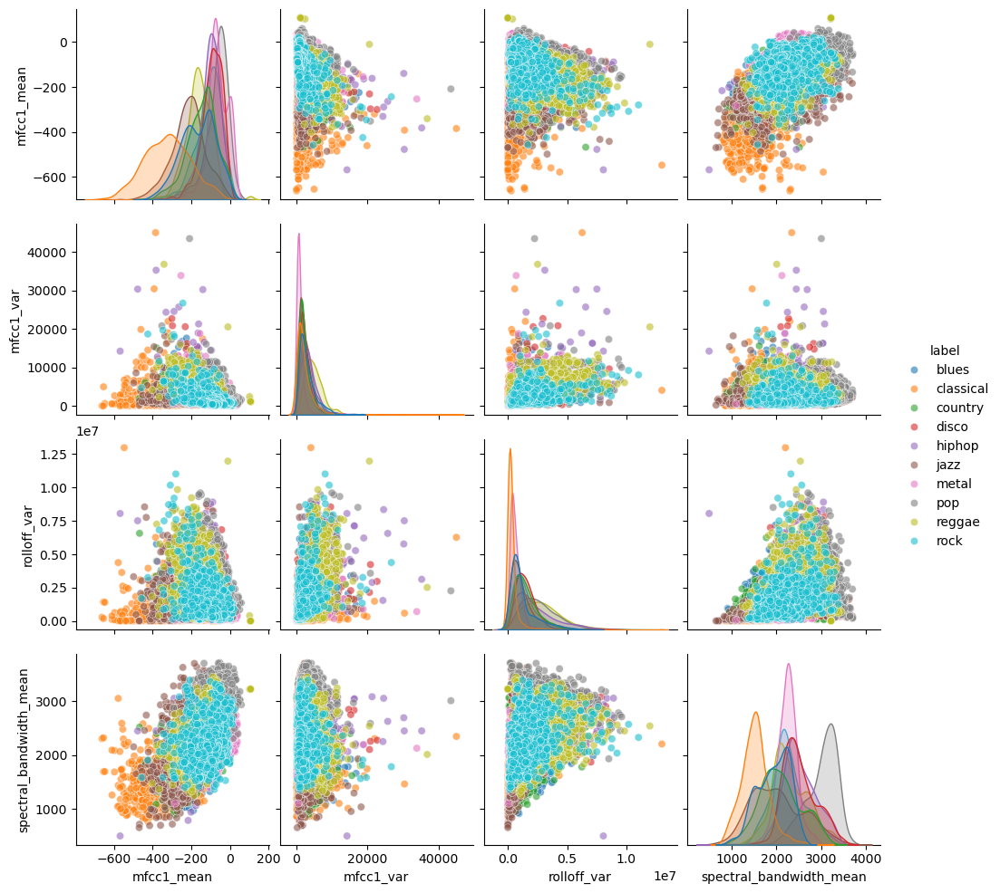

In [39]:
# plot first 8 selected features with pairplots:

plot_features = data_3s[selected_features[:8] + [data_3s.columns[-1]]]
group_size = 4

for i in range(0, len(plot_features.columns) - 1, group_size):
    feature_group = plot_features.columns[i : i + group_size].union(['label'])

    print(f"\nFeatures: {i+1} to {i +group_size}\n")
    # Create pairplot
    sns.pairplot(plot_features[feature_group], 
                 hue='label', 
                 diag_kind='kde',
                 plot_kws={'alpha': 0.6}
                )
    plt.show()

## Data preprocessing

### Data Splitting

In [40]:
# to prevent data leakage with data transformations, I split dataset into train/test subsets 
# all selected features included
# stratify samples based on labels

X_train, X_test, y_train, y_test = train_test_split(
    data_3s[selected_features], 
    data_3s['label'], 
    test_size=0.2, 
    random_state=seed, 
    stratify=data_3s['label']
)

### Handling outliers

#### Removing outliers with ZScore method

In [41]:
# Modify X_train, y_train by removing all extreme outliers

# Custom function removing extreme outliers 
def remove_outliers_zscore(X_subset, y_subset, threshold=3):
    """Remove outliers beyond ±3 standard deviations (Z-score method)"""
    
    # Z-score calculated using mean and standard deviation
    z = np.abs((X_subset - X_subset.mean()) / X_subset.std())
    
    # Create boolean mask for non-outliers
    mask = (z < threshold).all(axis=1)
    
    return X_subset[mask], y_subset[mask]

# modify train subset data
X_train_zscore, y_train_zscore = remove_outliers_zscore(X_train, y_train)

# modify test subset data
X_test_zscore, y_test_zscore = remove_outliers_zscore(X_test, y_test)

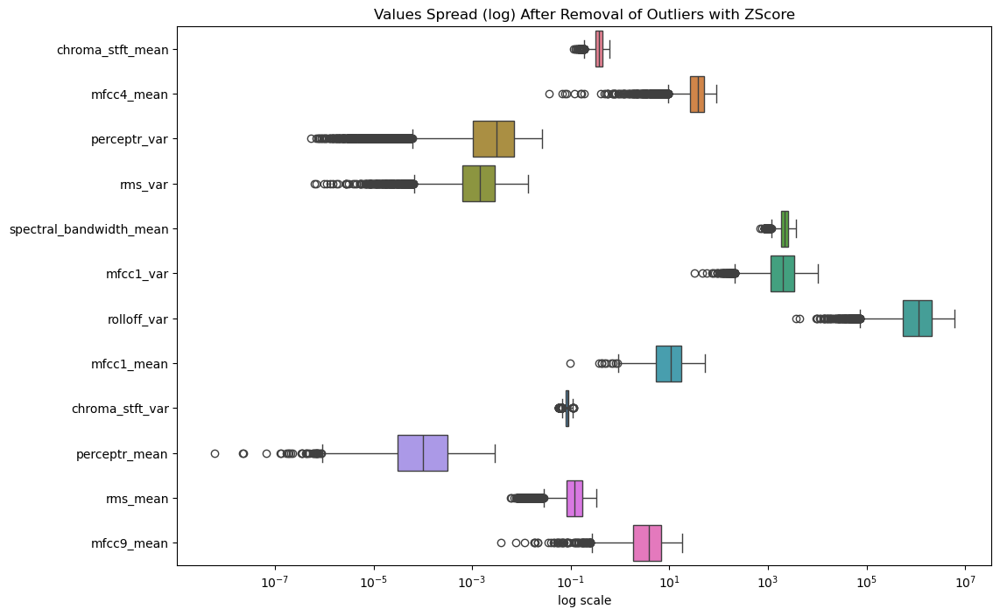

In [42]:
# # Plot the X_train after removing the extreme outliers
plt.figure(figsize=(12, 8))
plt.title('Values Spread (log) After Removal of Outliers with ZScore')
plt.xlabel('log scale')
sns.boxplot(data=X_train_zscore, log_scale=True, orient='h')

plt.show()

#### Removing outliers with IQR method

In [43]:
# Modify X_train, y_train by removing all outliers

# Custom function removing outliers 
def remove_outliers_iqr(X_subset, y_subset):
    """Remove outliers using Interquartile Range method"""
    
    # Create mask for non-outliers across specified columns
    mask = np.ones(len(X_subset), dtype=bool)
    
    for column in X_subset.columns:
        # obtain q1 and q3
        Q1 = X_subset[column].quantile(0.25)
        Q3 = X_subset[column].quantile(0.75)
        # calculate iqr
        IQR = Q3 - Q1
        # store values for lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        column_mask = (X_subset[column] >= lower_bound) & (X_subset[column] <= upper_bound)
        mask = mask & column_mask
    
    return X_subset[mask], y_subset[mask]

# modify train subset data
X_train_iqr, y_train_iqr = remove_outliers_iqr(X_train, y_train)

# modify test subset data
X_test_iqr, y_test_iqr = remove_outliers_iqr(X_test, y_test)

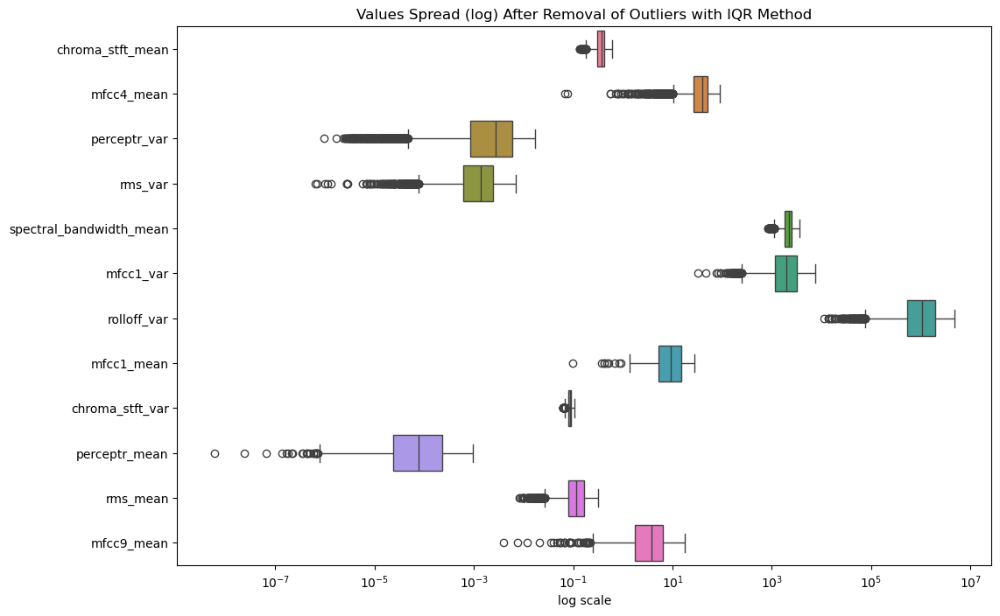

In [44]:
# # Plot the X_train after removing outliers
plt.figure(figsize=(12, 8))
plt.title('Values Spread (log) After Removal of Outliers with IQR Method')
plt.xlabel('log scale')
sns.boxplot(data=X_train_iqr, log_scale=True, orient='h')

plt.show()

### Features scaling and log

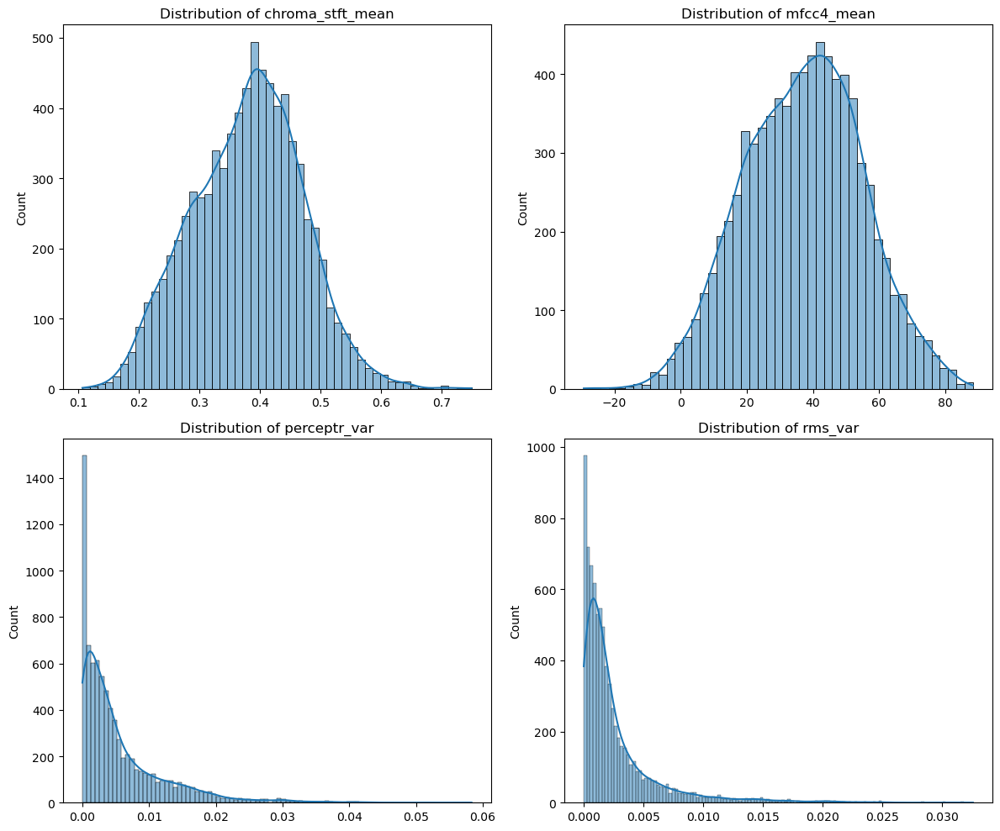

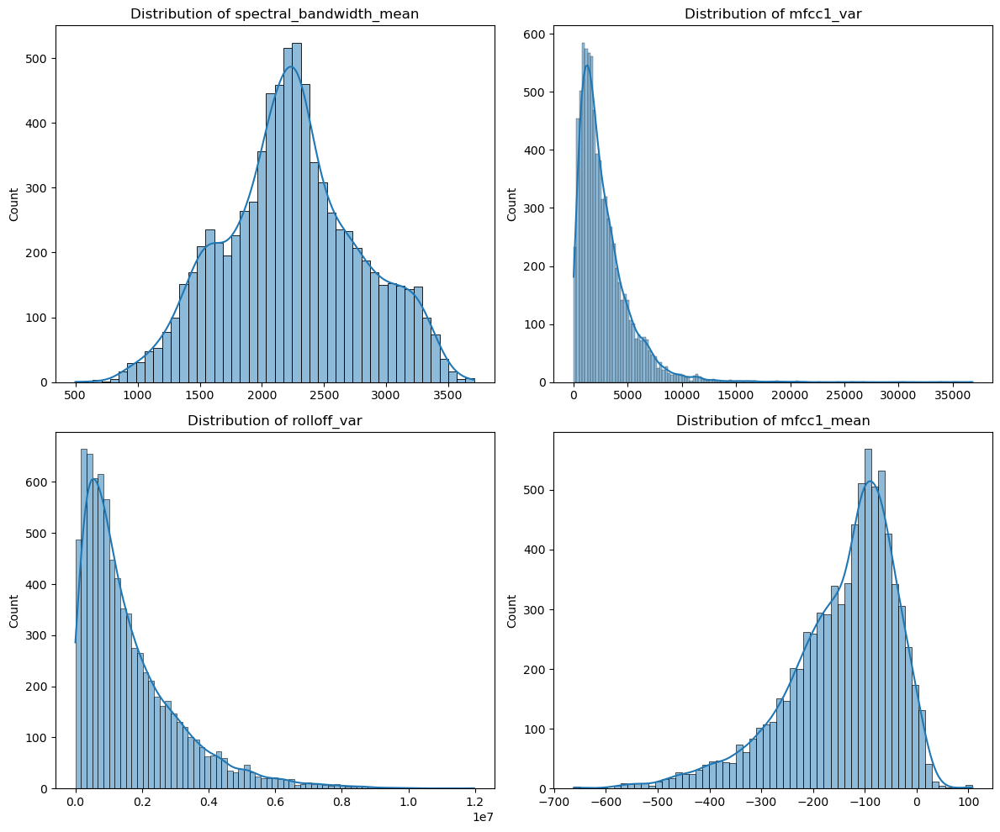

In [45]:
# plot histograms for the firts 8 selected features - part 1

def plot_histogram_grid(df, features, color=None):
    """Plot histograms on a 2x2 grid of subplots"""
    
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes = axes.ravel()
    
    for i, feature in enumerate(features):
        sns.histplot(data=df, x=feature, ax=axes[i], kde=True, color=color)
        axes[i].set_title(f'Distribution of {feature}')
        axes[i].set_xlabel('')
    plt.tight_layout()
    plt.show()

# plot firts part of the selected_features 
features_part1 = X_train[selected_features[:4]]
plot_histogram_grid(X_train, features_part1)

# plot second part of the selected_features 
features_part2 = X_train[selected_features[4:8]]
plot_histogram_grid(X_train, features_part2)

In [46]:
# write-up: 

# Necessary scaling of all variables due to large spread of values 
# Normal distribution: 'chroma_stft_mean', 'mfcc4_mean', 'spectral_bandwidth_mean'
# Log required for skewed distributions: 'perceptr_var', 'rms_var', 'mfcc1_var', 'rolloff_var', 'mfcc1_mean'

In [47]:
# create pipeline for preprocessing of the firts 8 feature variables

# construct pipeline for numerical attributes that are approx. normal in distribution
scal_pipeline = make_pipeline(
    StandardScaler()
)
# coonstruct pipeline for numerical attributes that may benefit from logarithmic transformation
log_scal_pipeline = make_pipeline(
    FunctionTransformer((lambda x: np.log(x)), feature_names_out='one-to-one'),
    StandardScaler()
)

# construct separate pipeline to handle logarithmic transformation of 'spectral_bandwidth_mean'
log_scal_pipeline2 = make_pipeline(
    FunctionTransformer((lambda x: np.log(x+1)), feature_names_out='one-to-one'), # log(x+1) beacuse of NaN issue
    StandardScaler()
)

# construct a transformer containing both pipelines
preprocessing = ColumnTransformer([
    ('scal', scal_pipeline, ['chroma_stft_mean', 'mfcc4_mean', 'mfcc1_mean']),
    ('log', log_scal_pipeline, ['perceptr_var', 'rms_var', 'mfcc1_var', 'rolloff_var']),
    ('log2', log_scal_pipeline2, ['spectral_bandwidth_mean'])
])


Missing values after preprocessing:

chroma_stft_mean           0
mfcc4_mean                 0
perceptr_var               0
rms_var                    0
spectral_bandwidth_mean    0
mfcc1_var                  0
rolloff_var                0
mfcc1_mean                 0
dtype: int64



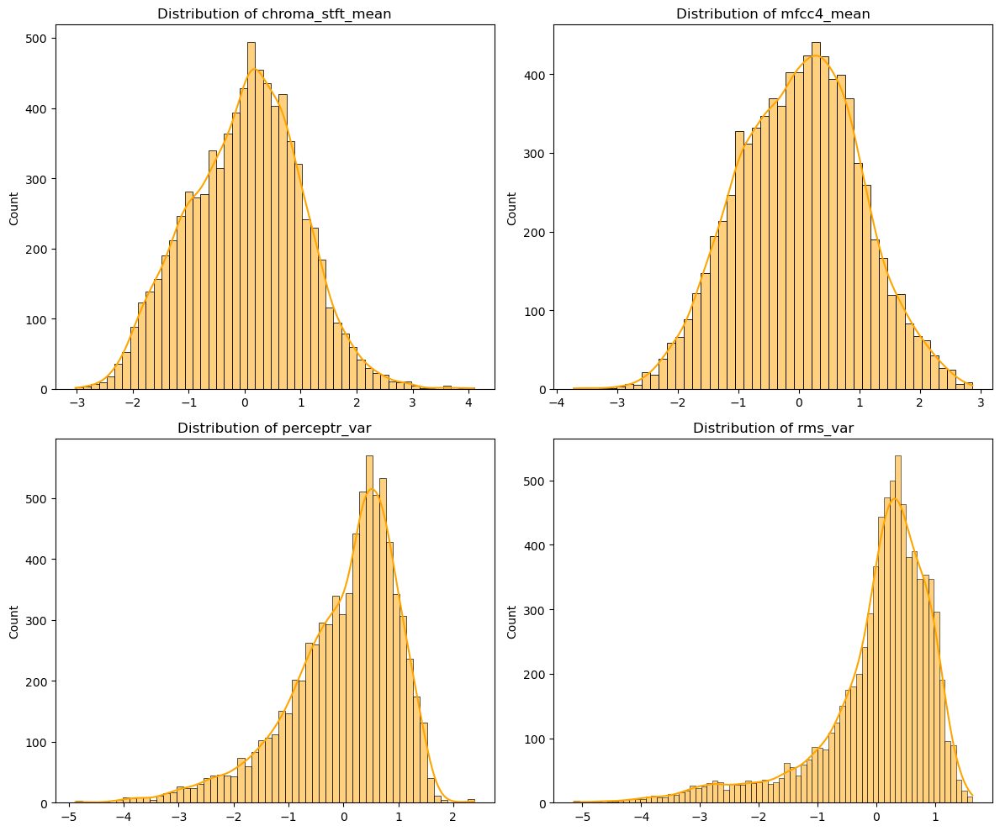

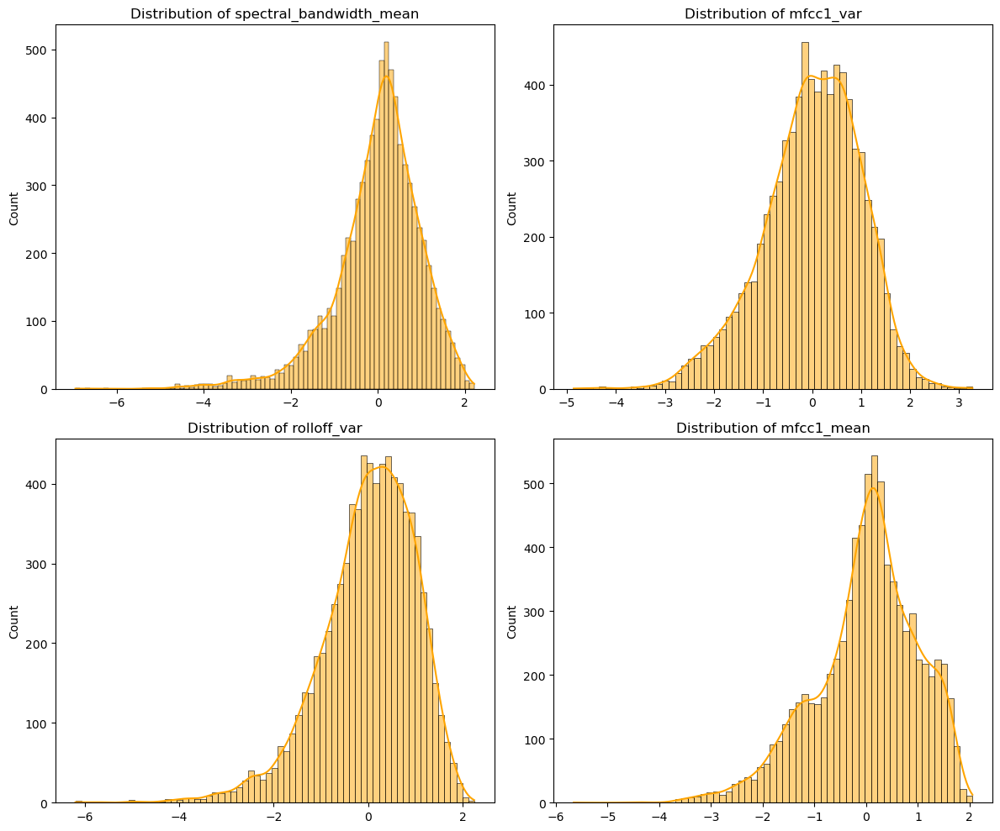

In [48]:
# Test preprocessing of the features
prep_features = pd.DataFrame(preprocessing.fit_transform(X_train), 
                             columns=X_train.columns[:8])

# Checking if the transformations have resulted in unintended missing values
print(f"\nMissing values after preprocessing:\n\n{prep_features.isnull().sum()}\n")

plot_histogram_grid(prep_features, prep_features.columns[:4], color='orange')
plot_histogram_grid(prep_features, prep_features.columns[4:8], color='orange')

In [49]:
## write-up:

# Some key observations:

# Experienced issues with missing values after log transformations if scaling was performed first
# spectral_bandwith_mean required different treatment than other skewed features

# Normality: The transformed distributions (orange) generally have a more symmetric, bell-shaped appearance, indicating they are closer to a normal distribution. This is desirable as many machine learning algorithms perform better when the feature distributions are approximately normal.
# Reduced skewness: The original distributions (blue) exhibit significant positive skewness, with long tails towards the higher values. The log transformations have helped reduce this skewness, making the distributions more centered and symmetrical.
# Reduced range: The transformed distributions have a narrower range of values compared to the original data. This can help prevent issues with features having vastly different scales, which could lead to some features dominating the model training.
# Reduced outliers: The transformed distributions appear to have fewer extreme outliers compared to the original data. Outliers can negatively impact model performance, so reducing their presence is beneficial.

## Model training

### Logistic Regression

In [50]:
# Train a Logistic Regression model using the default settings

log_reg = make_pipeline(preprocessing, LogisticRegression(random_state=seed)) 
log_reg.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('scal',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  ['chroma_stft_mean',
                                                   'mfcc4_mean',
                                                   'mfcc1_mean']),
                                                 ('log',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF6980>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['perceptr_var', 'rms_var',
                                                   'mfcc1_var',
                                                   'rolloff_var']),
                                                 ('log2',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF68E0>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['spectral_bandwidth_mean'])])),
                ('logisticregression', LogisticRegression(random_state=42))])

In [51]:
# compile a list of rows from the training data that will be used to check accuracy of predictions
# in different models 

sampled_rows_idx = get_samples_indicises(y_train) # obtain indices of 10 random samples

# sample 10 rows from the X_train subset to compare predictions of classes consistently across different models
X_train_sampled = X_train.loc[X_train.index.isin(sampled_rows_idx)]

In [52]:
# Compare predicted classes against actual classes in the logistic regression model
y_train_10_predictions = log_reg.predict(X_train_sampled)
y_train_10_actual_classes = y_train.loc[y_train.index.isin(sampled_rows_idx)]

# print actual classes / predictions in the 10 sampled instances

print("\n*****Logistic Regression*****\n")
for i, prediction in enumerate(y_train_10_predictions, start=0):    
    print(f"Actual: {y_train_10_actual_classes.iloc[i]:<10} Predicted: {prediction}")



*****Logistic Regression*****

Actual: hiphop     Predicted: pop
Actual: metal      Predicted: metal
Actual: rock       Predicted: country
Actual: blues      Predicted: blues
Actual: jazz       Predicted: jazz
Actual: disco      Predicted: country
Actual: classical  Predicted: classical
Actual: reggae     Predicted: reggae
Actual: country    Predicted: disco
Actual: pop        Predicted: jazz


Classification Report:
               precision    recall  f1-score   support

       blues       0.44      0.48      0.46       800
   classical       0.88      0.89      0.88       799
     country       0.40      0.29      0.34       798
       disco       0.39      0.27      0.32       799
      hiphop       0.55      0.56      0.55       798
        jazz       0.53      0.55      0.54       800
       metal       0.70      0.81      0.76       800
         pop       0.58      0.73      0.64       800
      reggae       0.47      0.49      0.48       800
        rock       0.34      0.32      0.33       798

    accuracy                           0.54      7992
   macro avg       0.53      0.54      0.53      7992
weighted avg       0.53      0.54      0.53      7992



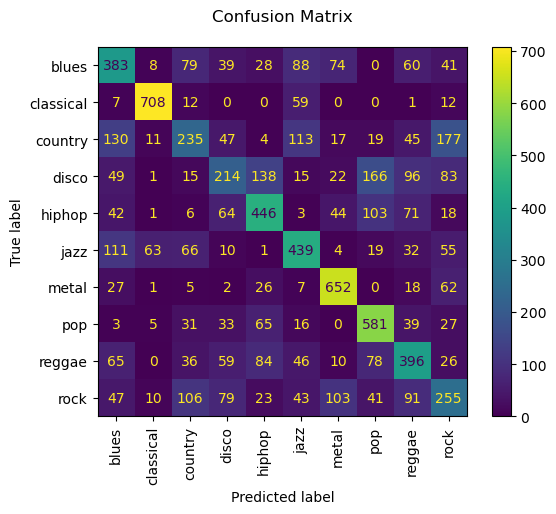

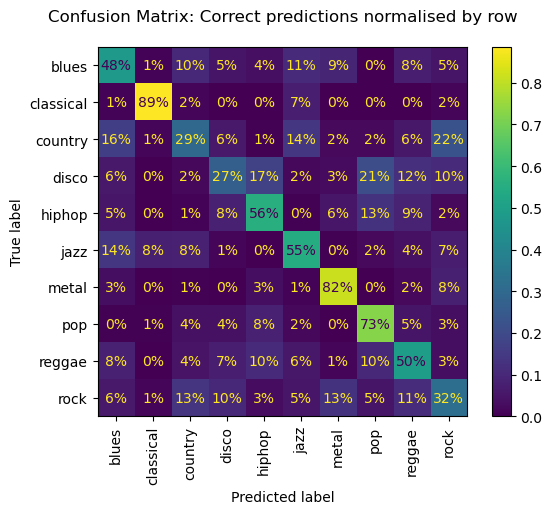

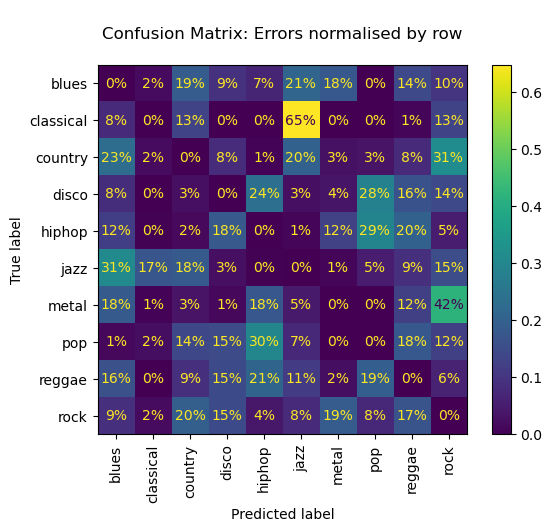

In [53]:
# cross-validate and return predictions for X_train over 10 folds
y_pred_logreg_CV = cross_val_predict(log_reg, X_train, y_train, cv=10)

# Evaluate the model's performance
print("Classification Report:\n", classification_report(y_train, y_pred_logreg_CV))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_logreg_CV,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_logreg_CV,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (y_pred_logreg_CV != y_train) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_logreg_CV,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

#### Research Question 1

Does Logistic Regression achieve higher accuracy scores when trained on the music dataset with removed outliers? 


**Null Hypothesis (H0):** Removing outliers does not improve performance of the Logistic Regression model trained on the music dataset.

**Alternative Hypothesis (H1):** Removing outliers significantly improves performance of the Logistic Regression model trained on the music dataset.

**Methodology:**

* Data processing method: Outliers are removed using IQR Method (1.5 Interquartile Range)<br>
* Baseline measurement: Obtain cross-validation accuracy scores from two identical Logistic Regression Classifiers (with default hyperparameters) on two samples: the dataset before and after removal of outliers. <br>
* Comparison metric: Cross-validation accuracy scores for both trained models.
* Statistical test: Wilcoxon signed-rank test.


Missing values after preprocessing with IQR method:

chroma_stft_mean           0
mfcc4_mean                 0
perceptr_var               0
rms_var                    0
spectral_bandwidth_mean    0
mfcc1_var                  0
rolloff_var                0
mfcc1_mean                 0
dtype: int64



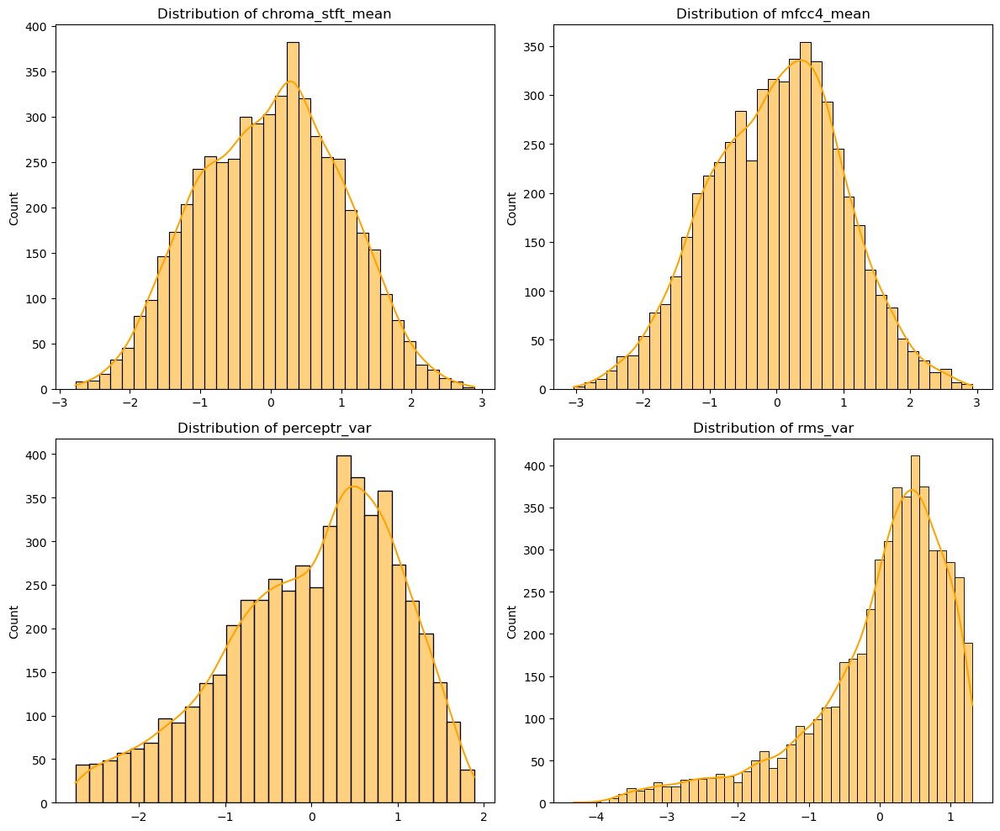

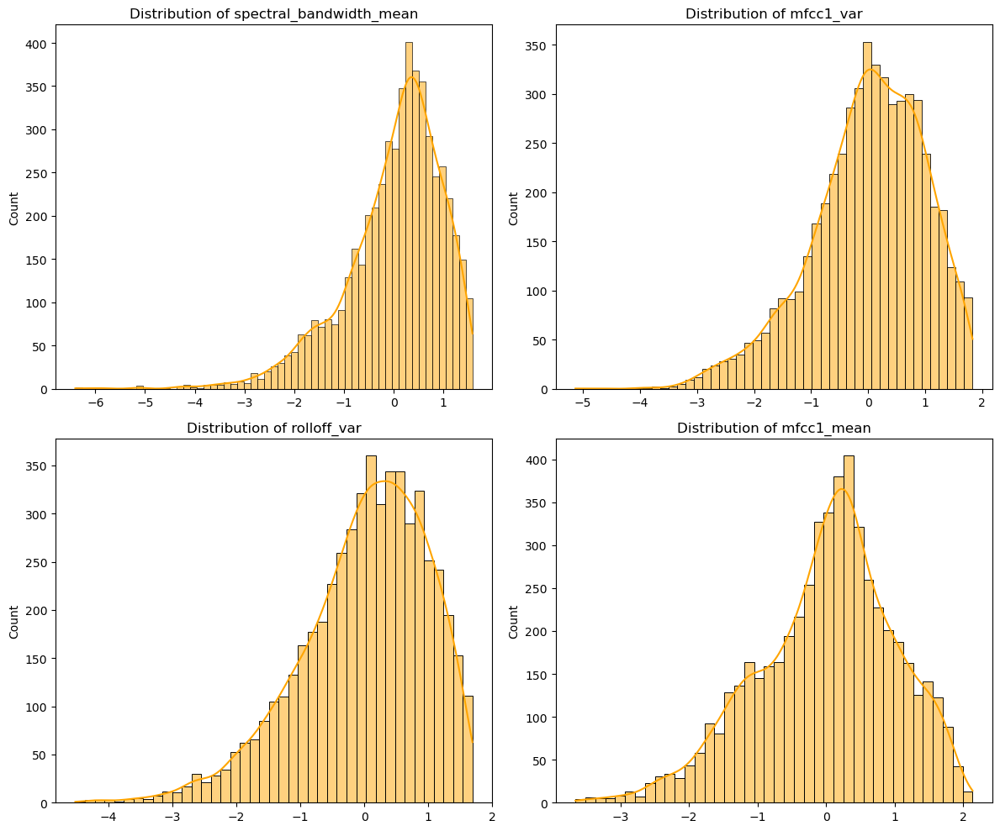

In [54]:
# Visualise preprocessed data with removed outliers

prep_features_iqr = pd.DataFrame(preprocessing.fit_transform(X_train_iqr), 
                                 columns=X_train_iqr.columns[:8])

# Checking if the transformations have resulted in unintended missing values
print(f"\nMissing values after preprocessing with IQR method:\n\n{prep_features.isnull().sum()}\n")

plot_histogram_grid(prep_features_iqr, prep_features_iqr.columns[:4], color='orange')
plot_histogram_grid(prep_features_iqr, prep_features_iqr.columns[4:8], color='orange')

In [55]:
# construct pipeline used in the experiment:
logreg = make_pipeline(preprocessing, LogisticRegression(random_state=seed)) 

# obtain cross-validation (10 folds) accuracy scores for the full dataset (no removed outliers) 
accuracies_logreg_all = cross_val_score(logreg, X_train, y_train, cv=10, scoring="accuracy")         

# obtain cross-validation (10 folds) accuracy scores for the sample with removed outliers
accuracies_logreg_iqr = cross_val_score(logreg, X_train_iqr, y_train_iqr, cv=10, scoring="accuracy")                             


In [56]:
# print mean accuracies for both models
print("\n*****Mean Cross-validation Accuracy Scores*****\n")
print(f"Outliers included: {round(np.mean(accuracies_logreg_all),4)}")
print(f"Outliers removed (IQR Method): {round(np.mean(accuracies_logreg_iqr),4)}") # IQR Method


*****Mean Cross-validation Accuracy Scores*****

Outliers included: 0.5392
Outliers removed (IQR Method): 0.5332


In [57]:
# Check if assumptions for Wilcoxon signed-rank test are met

check_wilcoxon_assumptions(scores_a=accuracies_logreg_all, 
                           scores_b=accuracies_logreg_iqr, 
                           model_name="Logistic Regression")

*****Checking assumptions for Logistic Regression*****
Number of observations in sample A: 10
Number of observations in sample B: 10

Differences are continuous: True

Shapiro-Wilk test for normality of differences:
p-value: 0.6493223285609837

The distribution of differences in scores is symmetrical in shape


In [58]:
# perform Wilcoxon signed-rank test

stat, p_value = stats.wilcoxon(accuracies_logreg_all, accuracies_logreg_iqr)

print(f"*****Wilcoxon signed-rank test results for Linear Regression*****")
print(f"Statistic: {stat}")
print(f"p-value: {p_value}")

if p_value < 0.05:
    print("\nThe difference is statistically significant")
else:
    print("\nThe difference is not statistically significant")

*****Wilcoxon signed-rank test results for Linear Regression*****
Statistic: 15.0
p-value: 0.232421875

The difference is not statistically significant


In [59]:
# write-up: I fail to reject the null hypothesis

In [60]:
pd.DataFrame({"outliers included": accuracies_logreg_all, 
              "outliers removed": accuracies_logreg_iqr}).describe().round(4)


,outliers included,outliers removed
count,10.0000,10.0000
mean,0.5392,0.5332
std,0.0159,0.0175
min,0.5194,0.5112
25%,0.5264,0.5243
50%,0.5357,0.5313
75%,0.5548,0.5379
max,0.5620,0.5674


### Random Forest

In [61]:
# Train a Random Forest Classifier model using the default settings

rand_for = make_pipeline(preprocessing, RandomForestClassifier()) 
rand_for.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('scal',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  ['chroma_stft_mean',
                                                   'mfcc4_mean',
                                                   'mfcc1_mean']),
                                                 ('log',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF6980>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['perceptr_var', 'rms_var',
                                                   'mfcc1_var',
                                                   'rolloff_var']),
                                                 ('log2',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF68E0>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['spectral_bandwidth_mean'])])),
                ('randomforestclassifier', RandomForestClassifier())])

In [62]:
# Compare predicted classes against actual classes in the Random Forest model
y_train_10_predictions = rand_for.predict(X_train_sampled)
y_train_10_actual_classes = y_train.loc[y_train.index.isin(sampled_rows_idx)]

# print actual classes / predictions in the 10 sampled instances
print("\n*****Random Forest*****\n")
for i, prediction in enumerate(y_train_10_predictions, start=0):    
    print(f"Actual: {y_train_10_actual_classes.iloc[i]:<10} Predicted: {prediction}")



*****Random Forest*****

Actual: hiphop     Predicted: hiphop
Actual: metal      Predicted: metal
Actual: rock       Predicted: rock
Actual: blues      Predicted: blues
Actual: jazz       Predicted: jazz
Actual: disco      Predicted: disco
Actual: classical  Predicted: classical
Actual: reggae     Predicted: reggae
Actual: country    Predicted: country
Actual: pop        Predicted: pop


Classification Report:
               precision    recall  f1-score   support

       blues       0.72      0.75      0.74       800
   classical       0.87      0.91      0.89       799
     country       0.55      0.59      0.57       798
       disco       0.66      0.65      0.65       799
      hiphop       0.78      0.73      0.75       798
        jazz       0.69      0.77      0.72       800
       metal       0.83      0.86      0.84       800
         pop       0.81      0.78      0.79       800
      reggae       0.67      0.69      0.68       800
        rock       0.58      0.46      0.51       798

    accuracy                           0.72      7992
   macro avg       0.72      0.72      0.72      7992
weighted avg       0.72      0.72      0.72      7992



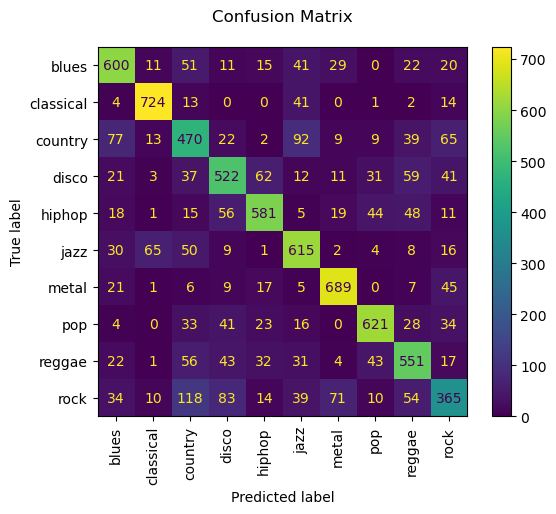

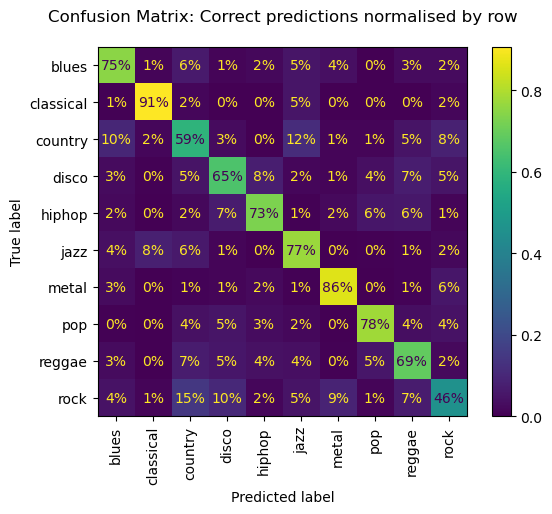

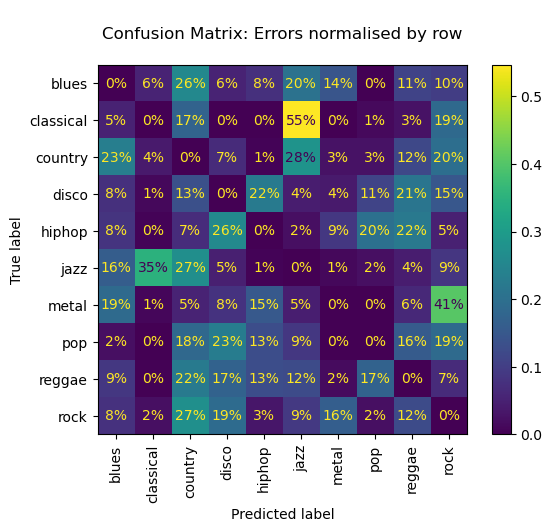

In [63]:
# cross-validate and return predictions for X_train over 5 folds
y_pred_randfor = cross_val_predict(rand_for, X_train, y_train, cv=5)

# Evaluate the model's performance
print("Classification Report:\n", classification_report(y_train, y_pred_randfor))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_randfor,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_randfor,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (y_pred_randfor != y_train) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_randfor,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

#### Research Question 2

Does Random Forest Classifier achieve higher accuracy scores when trained on the music dataset with outliers removed using Z-Score method as opposed to Interquartile Range (IQR) method?

**Null Hypothesis (H0):**
There is no statistically significant difference in the accuracy scores of Random Forest Classifier when comparing datasets preprocessed using Z-Score and IQR outlier removal methods.

**Alternative Hypothesis (H1):**
The Random Forest Classifier achieves a statistically significantly higher accuracy score when trained on a dataset preprocessed using the Z-Score outlier removal method compared to the IQR method.

**Methodology:**
* Baseline measurement: Obtain 10-fold cross-validation of accuracy scores from two Random Forest Classifiers trained on two datasets preprocessed using the two different methods for removal of outliers. <br>
* Statistical test: Wilcoxon signed-rank test for comparing the means of two samples of cross-validation accuracy scores.


Missing values after preprocessing with z-score method:

chroma_stft_mean           0
mfcc4_mean                 0
perceptr_var               0
rms_var                    0
spectral_bandwidth_mean    0
mfcc1_var                  0
rolloff_var                0
mfcc1_mean                 0
dtype: int64



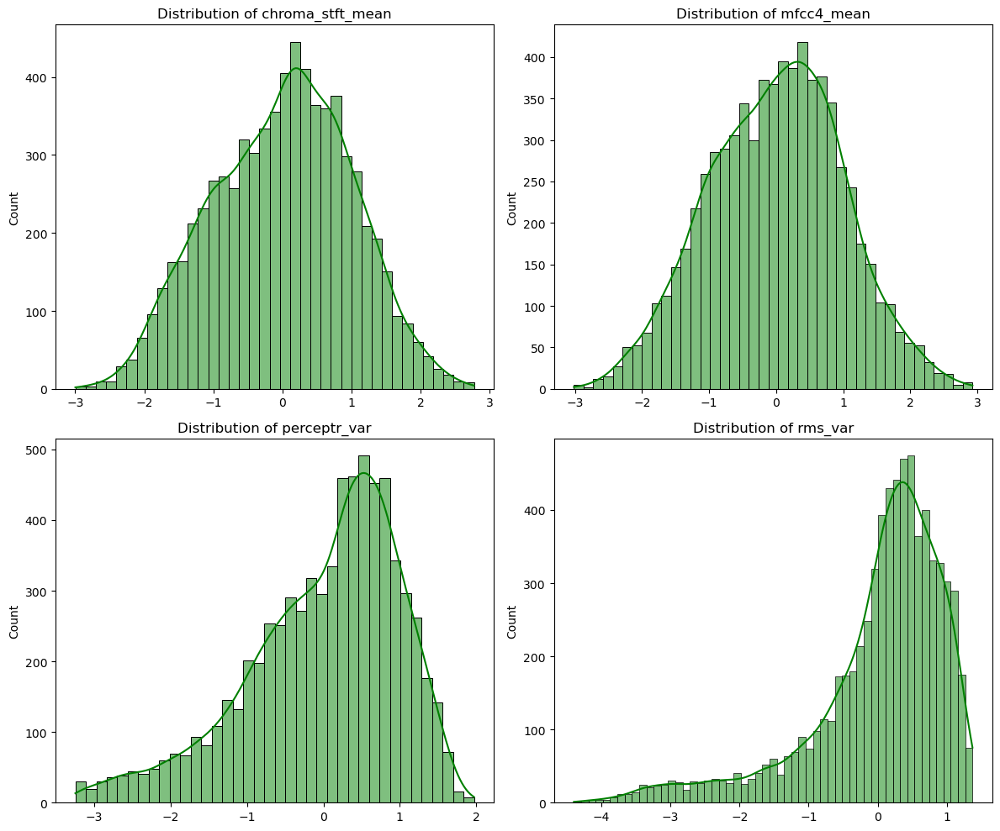

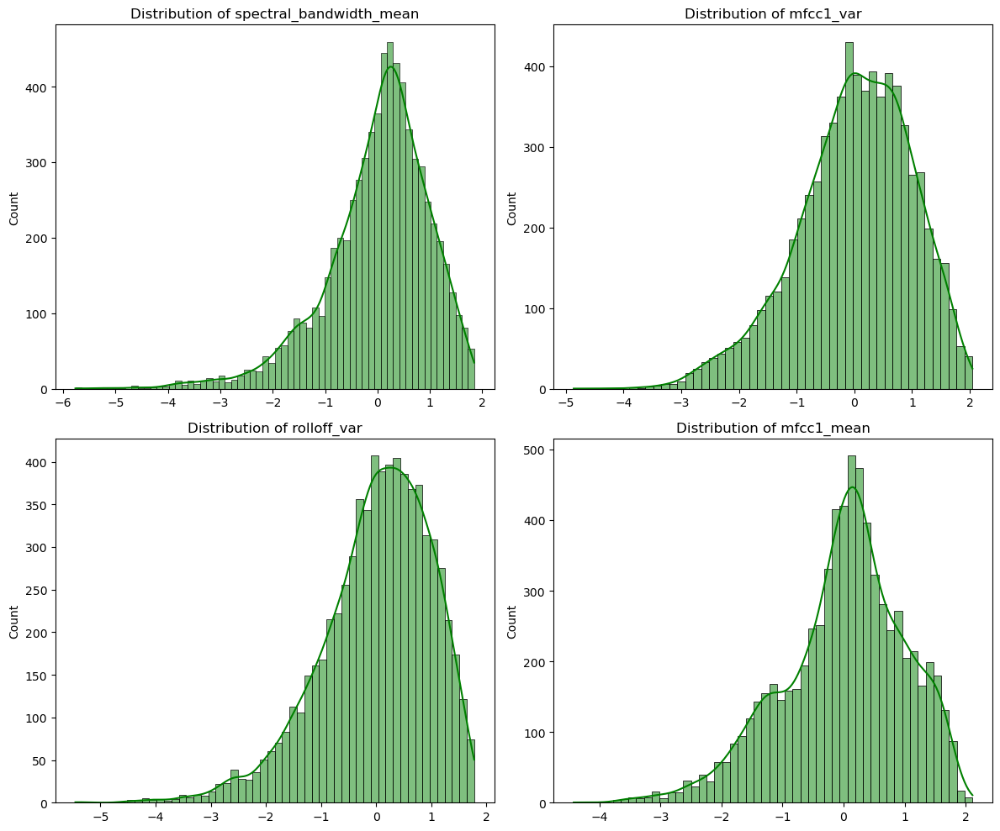

In [64]:
# Visualise preprocessed data with removed outliers using z-score method

prep_features_zscore = pd.DataFrame(preprocessing.fit_transform(X_train_zscore), 
                                    columns=X_train_zscore.columns[:8])

# Checking if the transformations have resulted in unintended missing values
print(f"\nMissing values after preprocessing with z-score method:\n\n{prep_features_zscore.isnull().sum()}\n")

plot_histogram_grid(prep_features_zscore, prep_features_zscore.columns[:4], color='green')
plot_histogram_grid(prep_features_zscore, prep_features_zscore.columns[4:8], color='green')

In [65]:
# construct pipelines for the experiment
default_forest = make_pipeline(preprocessing, RandomForestClassifier(random_state=seed)) 

# Obtain cross-validation scores for both models trained on the data treated with two different methods used
# for the removal of outliers
accuracies_forest_iqr = cross_val_score(default_forest, X_train_iqr, y_train_iqr, cv=10, scoring="accuracy")
accuracies_forest_zscore = cross_val_score(default_forest, X_train_zscore, y_train_zscore, cv=10, scoring="accuracy")   


In [66]:
# print mean accuracies for both models
print("\n*****Mean Cross-validation Accuracy Scores*****\n")
print(f"IQR method: {round(np.mean(accuracies_forest_iqr),4)}")
print(f"Z-Score method: {round(np.mean(accuracies_forest_zscore),4)}")



*****Mean Cross-validation Accuracy Scores*****

IQR method: 0.706
Z-Score method: 0.7175


In [67]:
# Check if assumptions for Wilcoxon signed-rank test are met

check_wilcoxon_assumptions(scores_a=accuracies_forest_iqr, 
                           scores_b=accuracies_forest_zscore, 
                           model_name="Random Forest Classifier")

*****Checking assumptions for Random Forest Classifier*****
Number of observations in sample A: 10
Number of observations in sample B: 10

Differences are continuous: True

Shapiro-Wilk test for normality of differences:
p-value: 0.7554302556595723

The distribution of differences in scores is symmetrical in shape


In [68]:
# Assumptions for the statistical test are met so I can conduct the test

# perform Wilcoxon test
stat, p_value = stats.wilcoxon(accuracies_forest_iqr, accuracies_forest_zscore)

print(f"\n*****Wilcoxon signed-rank test results for Random Forest*****\n")
print(f"Statistic: {stat}")
print(f"p-value: {p_value}")

if p_value < 0.05:
    print("\nThe difference is statistically significant")
else:
    print("\nThe difference is not statistically significant")


*****Wilcoxon signed-rank test results for Random Forest*****

Statistic: 5.0
p-value: 0.01953125

The difference is statistically significant


In [69]:
# Collect accuracy scores data as a dataframe
pd.DataFrame({"IQR method": accuracies_forest_iqr, 
              "Z-Score method": accuracies_forest_zscore}).describe().round(4)

,IQR method,Z-Score method
count,10.0000,10.0000
mean,0.7060,0.7175
std,0.0160,0.0129
min,0.6742,0.6968
25%,0.6990,0.7077
50%,0.7088,0.7228
75%,0.7177,0.7267
max,0.7252,0.7352


In [70]:
# write-up: Z-Score performs better, however, overall the accuracy of the model 
# with outliers removed is marginally lower than of the model with all outliers untouched (not removed)
# so I might decide not to introduce this data transformation into my pipeline afterall 

### K-Nearest Neighbour (KNN)

In [71]:
# Train a KNN Classifier model using the default settings

knn = make_pipeline(preprocessing, KNeighborsClassifier()) 
knn.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('scal',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  ['chroma_stft_mean',
                                                   'mfcc4_mean',
                                                   'mfcc1_mean']),
                                                 ('log',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF6980>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['perceptr_var', 'rms_var',
                                                   'mfcc1_var',
                                                   'rolloff_var']),
                                                 ('log2',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF68E0>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['spectral_bandwidth_mean'])])),
                ('kneighborsclassifier', KNeighborsClassifier())])

In [72]:
# Compare predicted classes against actual classes in the KNN model
y_train_10_predictions = knn.predict(X_train_sampled)
y_train_10_actual_classes = y_train.loc[y_train.index.isin(sampled_rows_idx)]

# print actual classes / predictions in the 10 sampled instances
print("\n*****KNN*****\n")
for i, prediction in enumerate(y_train_10_predictions, start=0):    
    print(f"Actual: {y_train_10_actual_classes.iloc[i]:<10} Predicted: {prediction}")


*****KNN*****

Actual: hiphop     Predicted: disco
Actual: metal      Predicted: metal
Actual: rock       Predicted: rock
Actual: blues      Predicted: blues
Actual: jazz       Predicted: jazz
Actual: disco      Predicted: disco
Actual: classical  Predicted: classical
Actual: reggae     Predicted: reggae
Actual: country    Predicted: country
Actual: pop        Predicted: reggae


Classification Report:
               precision    recall  f1-score   support

       blues       0.62      0.73      0.67       800
   classical       0.86      0.92      0.89       799
     country       0.51      0.57      0.53       798
       disco       0.59      0.67      0.63       799
      hiphop       0.75      0.69      0.72       798
        jazz       0.70      0.68      0.69       800
       metal       0.83      0.82      0.82       800
         pop       0.80      0.74      0.77       800
      reggae       0.66      0.69      0.67       800
        rock       0.57      0.37      0.45       798

    accuracy                           0.69      7992
   macro avg       0.69      0.69      0.68      7992
weighted avg       0.69      0.69      0.68      7992



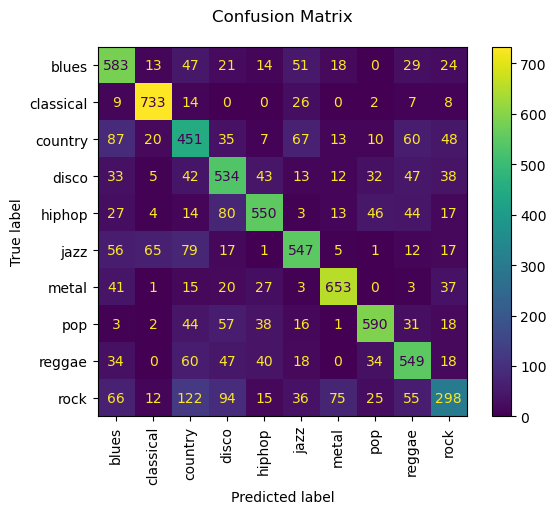

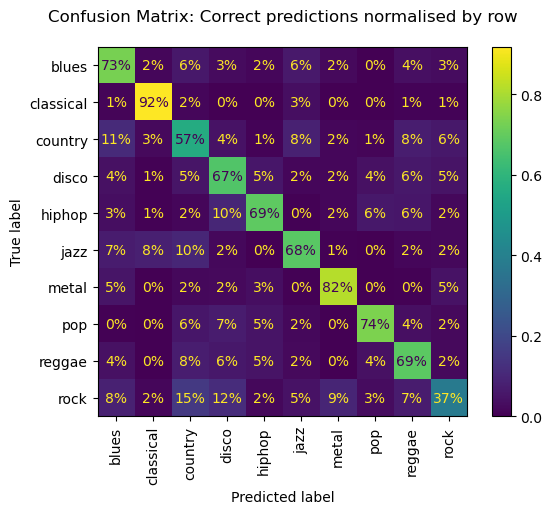

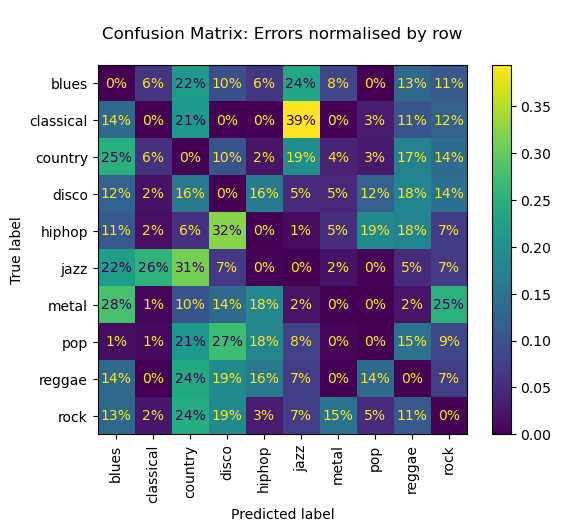

In [73]:
# cross-validate and return predictions for X_train over 5 folds
y_pred_knn = cross_val_predict(knn, X_train, y_train, cv=5)

# Evaluate the model's performance
print("Classification Report:\n", classification_report(y_train, y_pred_knn))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_knn,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_knn,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (y_pred_knn != y_train) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_knn,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

#### Research Question 3

Comparing the Statistical Significance of Manhattan and Euclidean Distance Metrics in Music Genre Classification Using the K-Nearest Neighbours (KNN) Algorithm.

**Null Hypothesis (H0):**
There is no statistically significant difference in the accuracy scores of K-Nearest Neighbours when using Manhattan distance versus Euclidean distance on the music dataset classification problem.

**Alternative Hypothesis (H1):**
There is a statistically significant difference in the accuracy scores of K-Nearest Neighbours when using Manhattan distance compared to Euclidean distance on the music dataset classification problem.

**Methodology:**

* Baseline measurement: Obtain 10-fold cross-validation of accuracy scores from two K-Nearest Neighbours Classifiers employing the two different distance metrics. <br>
* Statistical test: Using t-test for comparing the means of two samples of cross-validation accuracy scores.

In [74]:
# construct pipelines for the experiment
knn_euclidian = make_pipeline(preprocessing, KNeighborsClassifier(metric='euclidean')) 
knn_manhattan = make_pipeline(preprocessing, KNeighborsClassifier(metric='manhattan')) 

# Obtain cross-validation scores from two K-Nearest Neighbours Classifiers (10-folds)
accuracies_KNN_eucl = cross_val_score(knn_euclidian, X_train, y_train, cv=10, scoring="accuracy")   
accuracies_KNN_manh = cross_val_score(knn_manhattan, X_train, y_train, cv=10, scoring="accuracy")

In [75]:
# print mean accuracies for both models
print("\n*****Mean Cross-validation Accuracy Scores*****\n")
print(f"Euclidian distance: {round(np.mean(accuracies_KNN_eucl),4)}")
print(f"Manhattan distance: {round(np.mean(accuracies_KNN_manh),4)}")


*****Mean Cross-validation Accuracy Scores*****

Euclidian distance: 0.6968
Manhattan distance: 0.7122


In [76]:
# Conduct independent samples T-test
stat, p_value = stats.ttest_ind(accuracies_KNN_eucl, accuracies_KNN_manh)

print("\n*****Research Question 3: Test*****\n")
print(f"T-statistic: {stat:.2f}, \np-value: {p_value:.4f}")

if p_value < 0.05:
    print("\nThe difference is statistically significant")
else:
    print("\nThe difference is not statistically significant")


*****Research Question 3: Test*****

T-statistic: -2.61, 
p-value: 0.0177

The difference is statistically significant


In [77]:
# Collect accuracy scores data as a dataframe
pd.DataFrame({"Euclidian": accuracies_KNN_eucl, 
              "Manhattan": accuracies_KNN_manh}).describe().round(4)

,Euclidian,Manhattan
count,10.0000,10.0000
mean,0.6968,0.7122
std,0.0118,0.0144
min,0.6783,0.6859
25%,0.6913,0.7046
50%,0.6940,0.7121
75%,0.7069,0.7235
max,0.7121,0.7309


In [78]:
# write-up: Manhattan distance metric yields better accuracy scores

## Fine-tuning the Models

### Logistic Regression

#### Manual Exploration of C-hyperparameter 

In [79]:
# Manually explore the optimal C hyperparameter setting responsible for the strength of regularisation

C_values = [0.001, 0.01, 1, 10, 100, 1000]  # Values of C to compare

# Collect accuracy scores for tried C_value
test_accuracies = []
cv_accuracies = []


for C_value in C_values:
    # construct temporary pipeline with tried C_value setting
    C_search_model = make_pipeline(preprocessing, LogisticRegression(C=C_value, max_iter=100))

    # get training predictions and cross-validation predictions 
    C_search_model.fit(X_train, y_train)
    y_pred = C_search_model.predict(X_test)
    y_cv_pred = cross_val_predict(C_search_model, X_train, y_train, cv=5)                               

    # calculate and collect accuracy scores
    train_accuracy = accuracy_score(y_test, y_pred)
    cv_accuracy = accuracy_score(y_train, y_cv_pred)
    test_accuracies.append(train_accuracy)
    cv_accuracies.append(cv_accuracy)

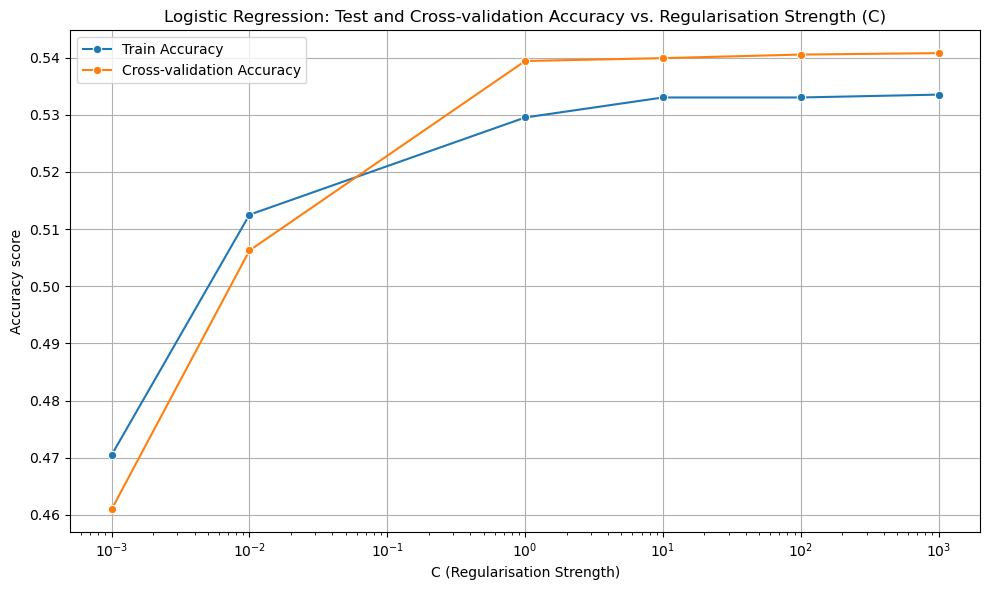

In [80]:
# plot training and cross-validation accuracy scores for different C_values

plt.figure(figsize=(10, 6))
sns.lineplot(x=C_values, y=test_accuracies, label='Train Accuracy', marker='o')
sns.lineplot(x=C_values, y=cv_accuracies, label='Cross-validation Accuracy', marker='o')
plt.xscale('log')  # Use a logarithmic scale for C
plt.title('Logistic Regression: Test and Cross-validation Accuracy vs. Regularisation Strength (C)')
plt.xlabel('C (Regularisation Strength)')
plt.ylabel('Accuracy score')
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

In [81]:
# write-up: the optimal C_value influencing the strength of regularisation is 100 according to the search

#### Performance of Logistic Regression Trained on Five Features

In [82]:
# construct a transformer pipeline for preprocessing 5 features as opposed to 8

preprocessing2 = ColumnTransformer([
    ('scal', scal_pipeline, ['chroma_stft_mean', 'mfcc4_mean']),
    ('log', log_scal_pipeline, ['perceptr_var', 'rms_var']),
    ('log2', log_scal_pipeline2, ['spectral_bandwidth_mean'])
], remainder='drop')

In [83]:
# Train a Logistic Regression model on the smaller set of features 

log_reg2 = make_pipeline(preprocessing2, LogisticRegression(random_state=seed)) # default settings
log_reg2.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('scal',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  ['chroma_stft_mean',
                                                   'mfcc4_mean']),
                                                 ('log',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF6980>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['perceptr_var', 'rms_var']),
                                                 ('log2',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF68E0>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['spectral_bandwidth_mean'])])),
                ('logisticregression', LogisticRegression(random_state=42))])

In [84]:
# Compare predicted classes against actual classes in the logistic regression model
y_train_10_predictions_5feats = log_reg2.predict(X_train_sampled)
y_train_10_actual_classes = y_train.loc[y_train.index.isin(sampled_rows_idx)]

# print head-to-head actual classes / predictions in the 10 sampled instances

print("\n*****Logistic Regression: 5 features dataset*****\n")
for i, prediction in enumerate(y_train_10_predictions_5feats, start=0):    
    print(f"Actual: {y_train_10_actual_classes.iloc[i]:<10} Predicted: {prediction}")



*****Logistic Regression: 5 features dataset*****

Actual: hiphop     Predicted: pop
Actual: metal      Predicted: metal
Actual: rock       Predicted: country
Actual: blues      Predicted: blues
Actual: jazz       Predicted: jazz
Actual: disco      Predicted: country
Actual: classical  Predicted: classical
Actual: reggae     Predicted: disco
Actual: country    Predicted: disco
Actual: pop        Predicted: jazz


Classification Report:
               precision    recall  f1-score   support

       blues       0.33      0.41      0.37       800
   classical       0.78      0.82      0.80       799
     country       0.30      0.19      0.23       798
       disco       0.35      0.28      0.31       799
      hiphop       0.50      0.55      0.52       798
        jazz       0.45      0.46      0.46       800
       metal       0.65      0.77      0.71       800
         pop       0.58      0.72      0.64       800
      reggae       0.45      0.35      0.39       800
        rock       0.28      0.26      0.27       798

    accuracy                           0.48      7992
   macro avg       0.47      0.48      0.47      7992
weighted avg       0.47      0.48      0.47      7992



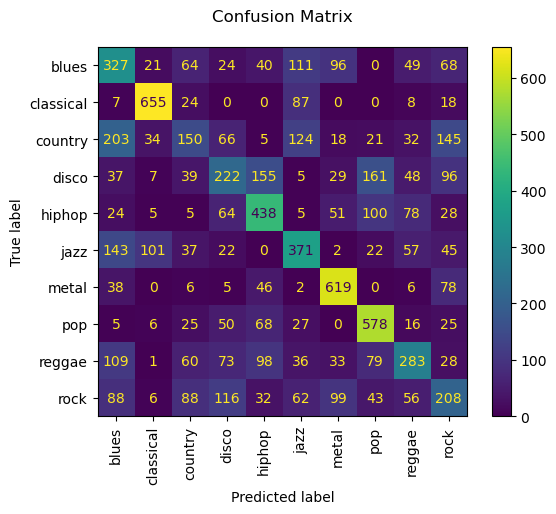

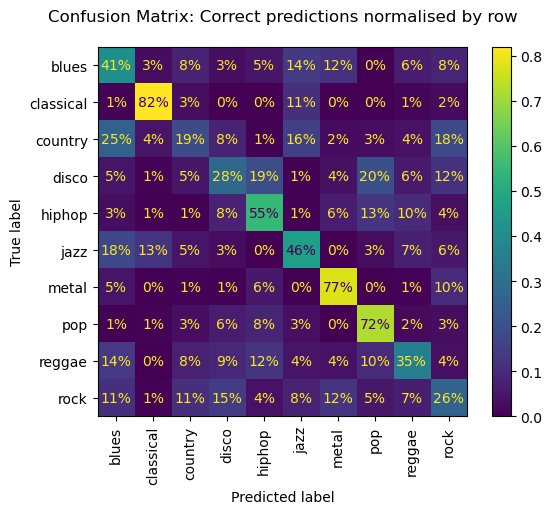

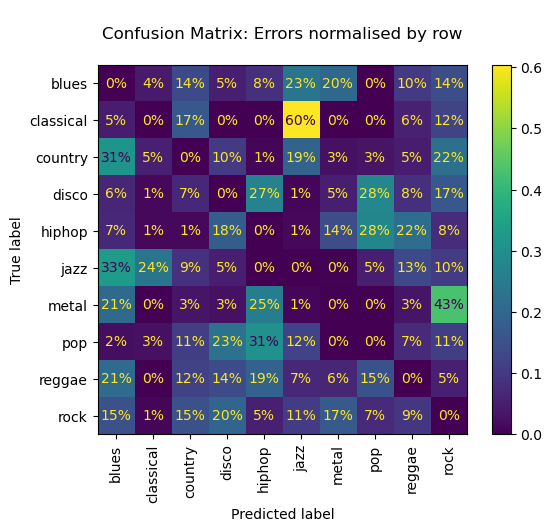

In [85]:
# cross-validate and return predictions for X_train (5 features) over 10 folds
y_pred_logreg_CV_5feats = cross_val_predict(log_reg2, X_train, y_train, cv=10)

# Evaluate the model's performance
print("Classification Report:\n", classification_report(y_train, y_pred_logreg_CV_5feats))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_logreg_CV_5feats,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_logreg_CV_5feats,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (y_pred_logreg_CV_5feats != y_train) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_logreg_CV_5feats,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

#### Research Question 4

Does increasing the number of features from 8 to 10 in a Logistic Regression Classifier statistically significantly improve the model's accuracy on the music dataset?

**Null Hypothesis (H0):** 
There is no statistically significant difference in Logistic Regression accuracy between 8-feature and 10-feature models trained on the music dataset.

**Alternative Hypothesis (H1):**
The 10-feature Logistic Regression model demonstrates statistically significantly higher accuracy compared to the 8-feature model when trained on the music dataset.

**Methodology:**
* Baseline measurement: Obtaining cross-validation accuracy scores from two identical Logistic Regression Classifiers (with default hyperparameters) on two samples: the dataset with original 8 features and the dataset with extended 10 features. All features in the experiment come from the same selection of features. <br>
* Comparison metric: Cross-validation of accuracy scores for both trained models.
* Test assumptions: Checking if assumption for paired t-test are met.
* Statistical test: Using paired t-test is appropriate because the accuracy scores are paired and come from the shared test datasets.

In [86]:
# Here I conduct an experiment where I test the performance of the same default Logistic Regression Classifier 
# but on a larger than initially number of features

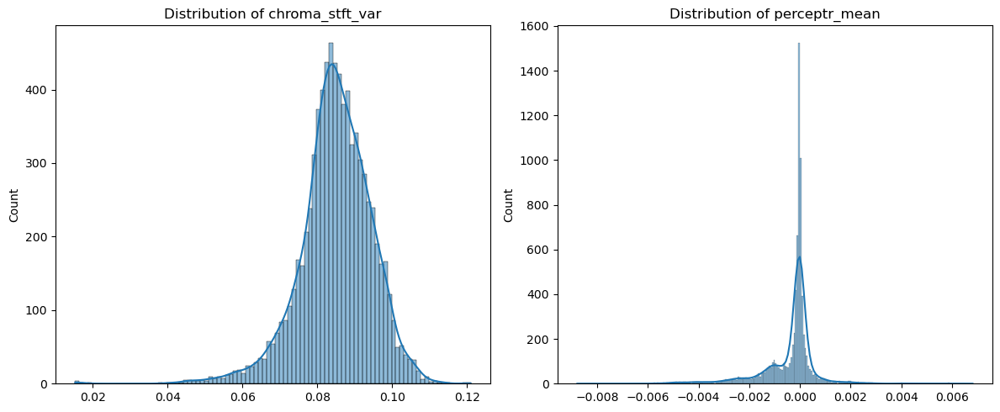

In [87]:
# First I plot histograms for additional two features to be included into the training dataset 
# to see their distribution

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes = axes.ravel()
    
for i, feature in enumerate(X_train[['chroma_stft_var', 'perceptr_mean']]):
    sns.histplot(data=X_train, x=feature, ax=axes[i], kde=True, color=None)
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel('')
plt.tight_layout()
plt.show()

In [88]:
# construct a transformer pipeline for preprocessing 10 features as opposed to original 8 features

preprocessing3 = ColumnTransformer([
    ('scal', scal_pipeline, ['chroma_stft_mean', 'mfcc4_mean', 'mfcc1_mean', 'chroma_stft_var', 'perceptr_mean']),
    ('log', log_scal_pipeline, ['perceptr_var', 'rms_var', 'mfcc1_var', 'rolloff_var']),
    ('log2', log_scal_pipeline2, ['spectral_bandwidth_mean'])
], remainder='drop')




Missing values after preprocessing:

chroma_stft_var    0
perceptr_mean      0
dtype: int64



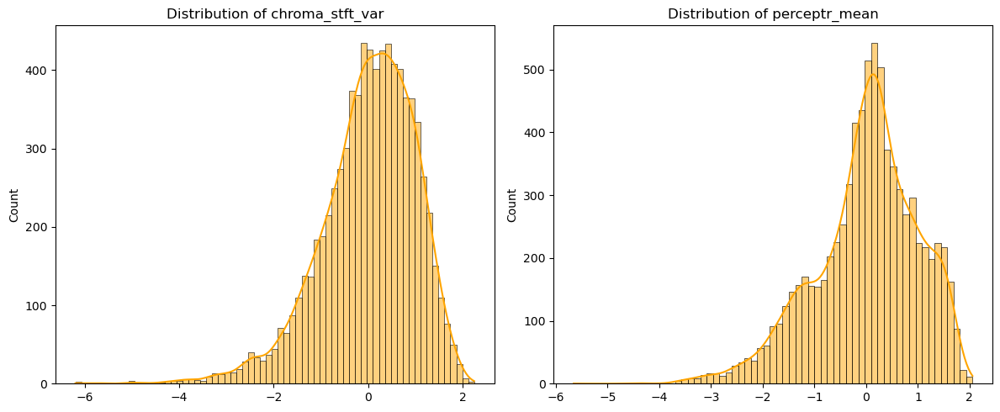

In [89]:
# Test preprocessing of the two additional features
prep_features3 = pd.DataFrame(preprocessing3.fit_transform(X_train), 
                             columns=X_train.columns[:10])

# Checking if the transformations have resulted in unintended missing values
print(f"\nMissing values after preprocessing:\n\n{prep_features3.isnull().sum()[-2:]}\n")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes = axes.ravel()
    
for i, feature in enumerate(prep_features3[['chroma_stft_var', 'perceptr_mean']]):
    sns.histplot(data=prep_features3, x=feature, ax=axes[i], kde=True, color='orange')
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel('')
plt.tight_layout()
plt.show()

In [90]:
# Train a Logistic Regression model on the larger set of features 

log_reg3 = make_pipeline(preprocessing3, LogisticRegression(random_state=seed)) # default settings
log_reg3.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('scal',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler())]),
                                                  ['chroma_stft_mean',
                                                   'mfcc4_mean', 'mfcc1_mean',
                                                   'chroma_stft_var',
                                                   'perceptr_mean']),
                                                 ('log',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF69...
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['perceptr_var', 'rms_var',
                                                   'mfcc1_var',
                                                   'rolloff_var']),
                                                 ('log2',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x0000024B1FAF68E0>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['spectral_bandwidth_mean'])])),
                ('logisticregression', LogisticRegression(random_state=42))])

In [91]:
# Compare predicted classes against actual classes in the logistic regression model
y_train_10_predictions_10feats = log_reg3.predict(X_train_sampled)
y_train_10_actual_classes = y_train.loc[y_train.index.isin(sampled_rows_idx)]

# print head-to-head actual classes / predictions in the 10 sampled instances

print("\n*****Logistic Regression: 10 features dataset*****\n")
for i, prediction in enumerate(y_train_10_predictions_10feats, start=0):    
    print(f"Actual: {y_train_10_actual_classes.iloc[i]:<10} Predicted: {prediction}")


*****Logistic Regression: 10 features dataset*****

Actual: hiphop     Predicted: pop
Actual: metal      Predicted: metal
Actual: rock       Predicted: country
Actual: blues      Predicted: blues
Actual: jazz       Predicted: jazz
Actual: disco      Predicted: blues
Actual: classical  Predicted: classical
Actual: reggae     Predicted: reggae
Actual: country    Predicted: disco
Actual: pop        Predicted: jazz


Classification Report:
               precision    recall  f1-score   support

       blues       0.47      0.50      0.48       800
   classical       0.87      0.89      0.88       799
     country       0.44      0.36      0.40       798
       disco       0.42      0.29      0.35       799
      hiphop       0.57      0.60      0.59       798
        jazz       0.54      0.54      0.54       800
       metal       0.71      0.82      0.76       800
         pop       0.57      0.71      0.63       800
      reggae       0.50      0.49      0.50       800
        rock       0.34      0.33      0.34       798

    accuracy                           0.55      7992
   macro avg       0.54      0.55      0.55      7992
weighted avg       0.54      0.55      0.55      7992



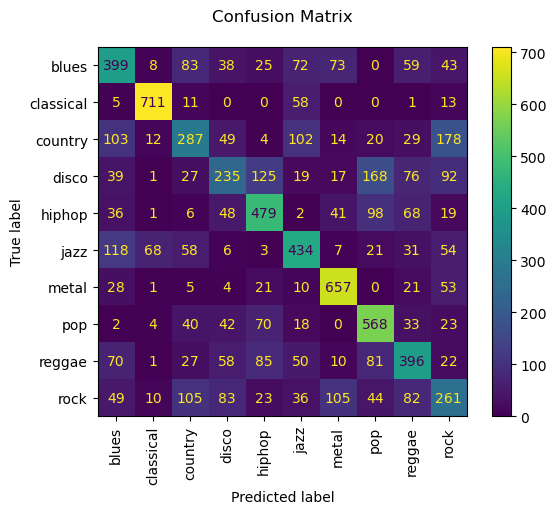

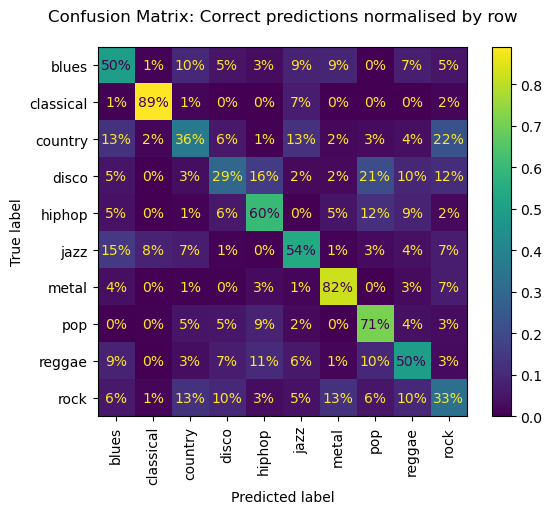

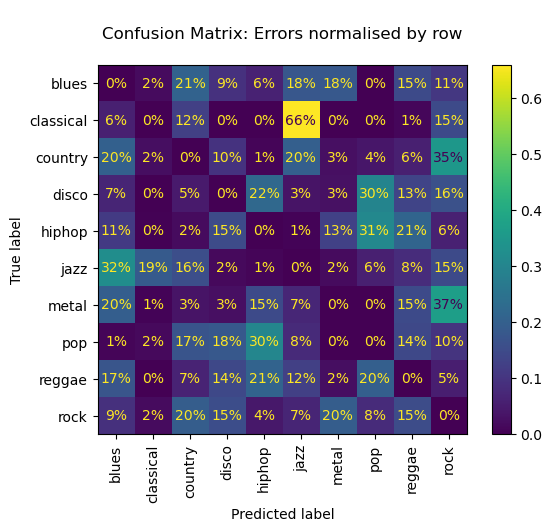

In [92]:
# cross-validate and return predictions for X_train (10 features) over 10 folds
y_pred_logreg_CV_10feats = cross_val_predict(log_reg3, X_train, y_train, cv=10)

# Evaluate the model's performance
print("Classification Report:\n", classification_report(y_train, y_pred_logreg_CV_10feats))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_logreg_CV_10feats,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_logreg_CV_10feats,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (y_pred_logreg_CV_10feats != y_train) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_logreg_CV_10feats,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

In [93]:
# To check statistical significance I perform a paired t-test on the two Logistic Regression Models
# First model trained on the original set of 8 features and the second model trained on the extended 
# set of 10 features

# Obtain cross-validation scores (10-folds)
accuracies_logreg_8feats = cross_val_score(log_reg, X_train, y_train, cv=10, scoring="accuracy")   
accuracies_logreg_10feats = cross_val_score(log_reg3, X_train, y_train, cv=10, scoring="accuracy")

# print mean accuracies for both models
print("\n*****Mean Cross-validation Accuracy Scores*****\n")
print(f"Model trained on 8 features: {round(np.mean(accuracies_logreg_8feats),4)}")
print(f"Model trained on 10 features: {round(np.mean(accuracies_logreg_10feats),4)}")


*****Mean Cross-validation Accuracy Scores*****

Model trained on 8 features: 0.5392
Model trained on 10 features: 0.5539


In [94]:
# Check if assumptions are met for the paired t-test to be valid
differences = accuracies_logreg_8feats - accuracies_logreg_10feats

# Check if all observations (scores) are paired, i.e., of equal length
print("\n*****Checking assumptions for the paired t-test*****\n")
print(f"Number of observations in sample A: {len(accuracies_logreg_8feats)}")
print(f"Number of observations in sample B: {len(accuracies_logreg_10feats)}")

# Check if differences are continuous (do they have decimal places)
print(f"\nDifferences are continuous: {np.any(differences % 1 != 0)}")

# Check if distribution of differences is symetrical in shape using Shapiro-Wilk test
_, p_value = shapiro(differences)
print(f"\nShapiro-Wilk test for normality of differences:")
print(f"p-value: {p_value}")
if p_value > 0.05:
    print('\nThe distribution of differences in scores is symmetrical in shape')
else:
    print('\nThe distribution of differences in scores is NOT symmetrical in shape') 



*****Checking assumptions for the paired t-test*****

Number of observations in sample A: 10
Number of observations in sample B: 10

Differences are continuous: True

Shapiro-Wilk test for normality of differences:
p-value: 0.11991971770450899

The distribution of differences in scores is symmetrical in shape


In [95]:
# perform paired t-test
t_statistic, p_value = stats.ttest_rel(accuracies_logreg_8feats, accuracies_logreg_10feats)

print("\n*****Research Question 4: Test*****\n")
print(f"T-statistic: {t_statistic:.2f}, \np-value: {p_value:.4f}")

if p_value < 0.05:
    print("\nThe difference is statistically significant")
else:
    print("\nThe difference is not statistically significant")


*****Research Question 4: Test*****

T-statistic: -5.35, 
p-value: 0.0005

The difference is statistically significant


In [96]:
# Collect accuracy scores data as a dataframe
pd.DataFrame({"8 features": accuracies_logreg_8feats, 
              "10 features": accuracies_logreg_10feats}).describe().round(4)

,8 features,10 features
count,10.0000,10.0000
mean,0.5392,0.5539
std,0.0159,0.0196
min,0.5194,0.5219
25%,0.5264,0.5396
50%,0.5357,0.5513
75%,0.5548,0.5726
max,0.5620,0.5782


In [97]:
# write-up: I reject the Null Hypothesis

#### Automated Hyperparameter Tuning

In [98]:
# construct pipeline for the purpose of hyperparameter search
full_pipeline_logreg = Pipeline([
    ('prep3', preprocessing3),
    ('logreg', LogisticRegression(random_state=seed))
]) 

# collect distributions of hyperparameters to explore
param_distr = {"logreg__C" : np.logspace(-4, 4, 20), # strength of regularisation
               "logreg__max_iter" : [100, 200, 300, 500, 1000],
               "logreg__tol": np.logspace(-5, -2, 20), # tolerance for stopping criteria
               "logreg__solver": ['newton-cg', 'sag', 'saga', 'lbfgs'],
               "logreg__class_weight" : [None, 'balanced'] # class weights
              }

# set-up RandomizedSearchCV
rand_search_logreg = RandomizedSearchCV(estimator=full_pipeline_logreg,
                                        param_distributions=param_distr,
                                        cv=5,
                                        n_iter=50,
                                        scoring='accuracy',
                                        n_jobs=-1,
                                        random_state=seed)

# tun randomised search and access the best found parameters
rand_search_logreg.fit(X_train, y_train)
rand_search_logreg.best_params_

{'logreg__tol': 0.001623776739188721,
 'logreg__solver': 'lbfgs',
 'logreg__max_iter': 100,
 'logreg__class_weight': 'balanced',
 'logreg__C': 4.281332398719396}

In [99]:
# display scores from the randomised search (best parameters come from the top ranked test)
rand_search_logreg_scores = pd.DataFrame(rand_search_logreg.cv_results_)
rand_search_logreg_scores.sort_values(by="mean_test_score", ascending=False, inplace=True)
rand_search_logreg_scores[['rank_test_score', 'mean_test_score', 'std_test_score', 'split0_test_score',
                           'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score']].head(10)


,rank_test_score,mean_test_score,std_test_score,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
39,1,0.552802,0.008873,0.560350,0.552846,0.536921,0.551940,0.561952
36,2,0.552802,0.008638,0.560976,0.554722,0.538173,0.548811,0.561327
11,3,0.552426,0.008282,0.558474,0.554096,0.537547,0.550688,0.561327
1,3,0.552426,0.008451,0.558474,0.554096,0.537547,0.550063,0.561952
37,5,0.552176,0.008485,0.558474,0.553471,0.536921,0.550688,0.561327
22,6,0.552176,0.008350,0.558474,0.554096,0.537547,0.549437,0.561327
15,6,0.552176,0.008293,0.557849,0.554722,0.537547,0.549437,0.561327
48,8,0.552051,0.008340,0.557223,0.554096,0.536921,0.550688,0.561327
7,9,0.552051,0.008086,0.557849,0.554096,0.537547,0.550063,0.560701
6,10,0.552051,0.008831,0.559099,0.553471,0.536295,0.550063,0.561327


In [100]:
# construct a pipeline for the fine-tuned model using the hyperparameters found in the RandomizedSearchCV

logreg_tuned_model = make_pipeline(preprocessing3,
                                   LogisticRegression(
                                       C=4.281332398719396,
                                       tol=0.00162377673918872,
                                       solver='lbfgs',
                                       max_iter=100,
                                       class_weight='balanced'
                                       )
                                  ) 

Classification Report:
               precision    recall  f1-score   support

       blues       0.47      0.49      0.48       800
   classical       0.87      0.89      0.88       799
     country       0.45      0.36      0.40       798
       disco       0.43      0.30      0.35       799
      hiphop       0.58      0.60      0.59       798
        jazz       0.53      0.54      0.54       800
       metal       0.71      0.82      0.76       800
         pop       0.57      0.71      0.63       800
      reggae       0.51      0.50      0.51       800
        rock       0.34      0.33      0.33       798

    accuracy                           0.55      7992
   macro avg       0.54      0.55      0.55      7992
weighted avg       0.54      0.55      0.55      7992



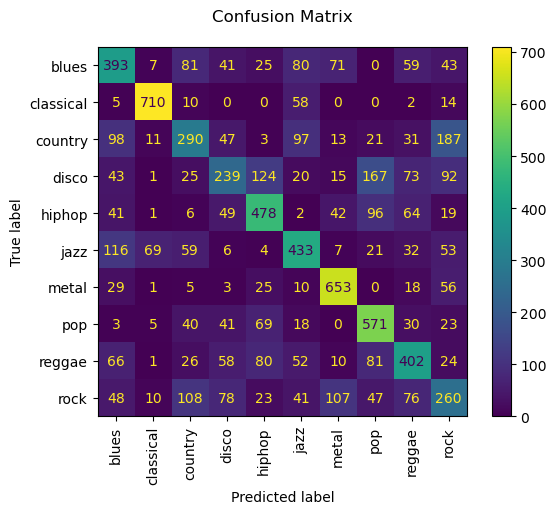

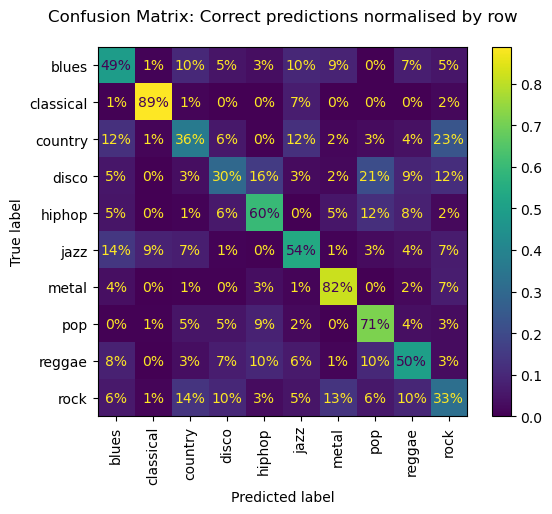

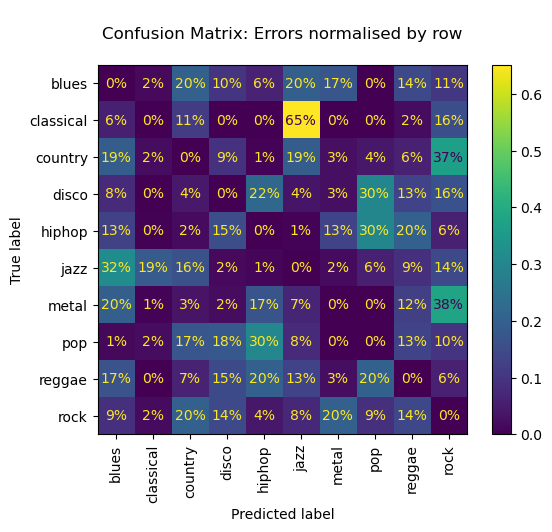

In [101]:
# cross-validate the fine-tuned model and return predictions for X_train over 10 folds
tuned_logreg_CV = cross_val_predict(logreg_tuned_model, X_train, y_train, cv=10)

# Evaluate the model's performance
print("Classification Report:\n", classification_report(y_train, tuned_logreg_CV))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_train, tuned_logreg_CV,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_train, tuned_logreg_CV,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (tuned_logreg_CV != y_train) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_train, tuned_logreg_CV,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

### Random Forest Classifier

#### Manual Exploration of Maximum Depth

In [102]:
# ## PLEASE NOTE: Commented out due to long computing time. Output is stored in variables below this cell.

# # Manually explore the optimal max_depth hyperparameter setting for Random Forest Classifier model

# depths_choice = [d for d in np.arange(1, 20, 1, dtype=int)]

# # Collect accuracy scores for tried max_depth settings
# train_accuracies = []
# cv_accuracies = []


# for depth in depths_choice:
#     # construct temporary pipeline with tried C_value setting
#     depth_search_model = make_pipeline(preprocessing, RandomForestClassifier(max_depth=depth, random_state=seed))

#     # get training predictions and cross-validation predictions 
#     depth_search_model.fit(X_train, y_train)
#     y_pred = depth_search_model.predict(X_train)
#     y_cv_pred = cross_val_predict(depth_search_model, X_train, y_train, cv=3) # less CV folds due to computing time                              

#     # calculate and collect accuracy scores
#     train_accuracy = accuracy_score(y_train, y_pred)
#     cv_accuracy = accuracy_score(y_train, y_cv_pred)
#     train_accuracies.append(train_accuracy)
#     cv_accuracies.append(cv_accuracy)

In [103]:
train_accuracies = [0.3786286286286286, 0.4336836836836837, 0.48998998998999,
                    0.5272772772772772, 0.5608108108108109, 0.6141141141141141,
                    0.6654154154154154, 0.7079579579579579, 0.7671421421421422, 
                    0.8233233233233234, 0.883008008008008, 0.9246746746746747, 
                    0.9592092092092092, 0.9814814814814815, 0.9916166166166166, 
                    0.9964964964964965, 0.997997997997998, 0.9986236236236237, 
                    0.998998998998999]

In [104]:
cv_accuracies = [0.33145645645645644, 0.4363113113113113, 0.47985485485485485, 
                 0.51001001001001, 0.5341591591591591, 0.5659409409409409, 
                 0.5944694694694694, 0.618993993993994, 0.6403903903903904, 
                 0.6512762762762763, 0.6725475475475475, 0.6821821821821822, 
                 0.6845595595595596, 0.6936936936936937, 0.6974474474474475, 
                 0.7055805805805806, 0.7035785785785785, 0.704954954954955,
                 0.7079579579579579]

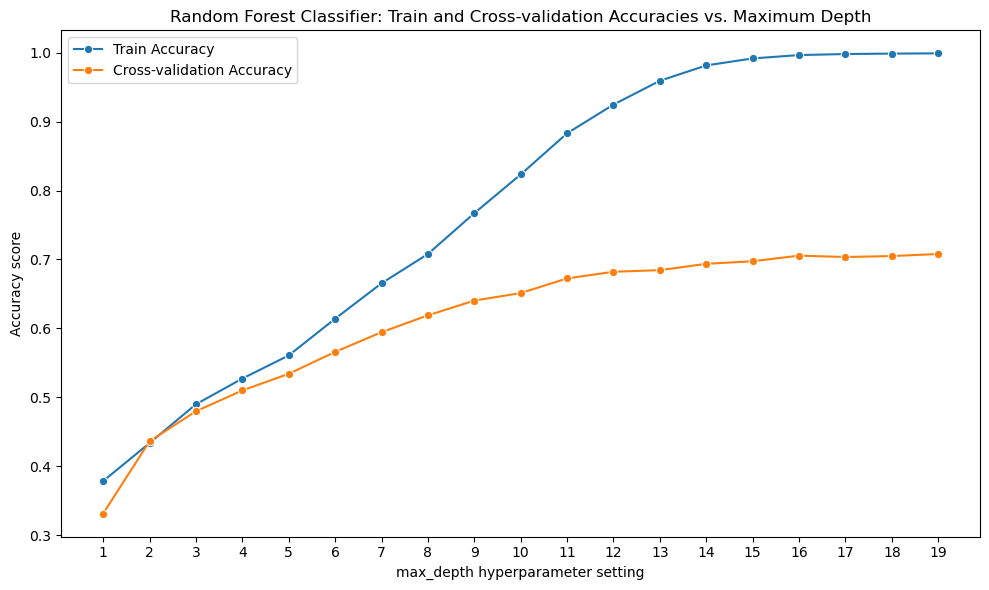

In [105]:
# plot training and cross-validation accuracy scores for different max_depth hyperparameter settings

depths_choice = [d for d in np.arange(1, 20, 1, dtype=int)]

plt.figure(figsize=(10, 6))
sns.lineplot(x=depths_choice, y=train_accuracies, label='Train Accuracy', marker='o')
sns.lineplot(x=depths_choice, y=cv_accuracies, label='Cross-validation Accuracy', marker='o')
plt.title('Random Forest Classifier: Train and Cross-validation Accuracies vs. Maximum Depth')
plt.xlabel('max_depth hyperparameter setting')
plt.ylabel('Accuracy score')
plt.xticks(depths_choice)
plt.legend()
plt.tight_layout()
plt.show()

In [106]:
# write-up:

# max_depth 16 appears to be optimal

# Train accuracy: The train accuracy (blue line) increases steadily as the max_depth setting is increased, indicating that the model is able to fit the training data well.

# Cross-validation accuracy: The cross-validation accuracy (orange line) also increases as the max_depth increases, but at a slower rate compared to the train accuracy. This is a good sign, as it suggests the model is generalizing well to unseen data.

# Convergence: As the max_depth setting increases beyond 13, the train and cross-validation accuracies start to converge, indicating that the model has reached a relatively stable performance level.

# No visible overfitting: The cross-validation accuracy does not start to decrease, even as the max_depth setting increases. This suggests that the model is not overfitting to the training data, at least within the range of max_depth values shown in the plot.


#### Performance of Random Forest Classifier Trained on a Different Number of Features

In [107]:
# split dataset with all 33 best fatures into train and test sets
X_train_v2, X_test_v2, y_train_v2, y_test_v2 = train_test_split(
    data_3s[all_best_features], 
    data_3s['label'], 
    test_size=0.2, 
    random_state=seed, 
    stratify=data_3s['label']
)

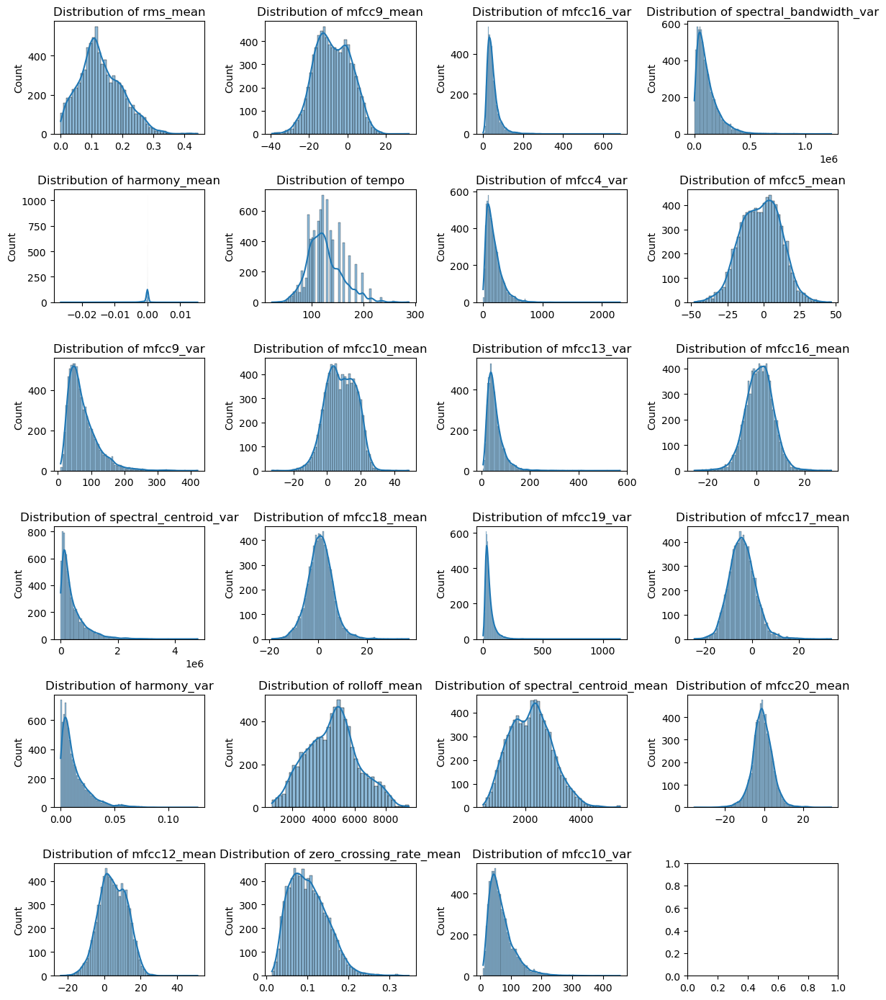

In [108]:
# plot previously not preprocessed featutes to decide about suitable transformations
fig, axes = plt.subplots(6, 4, figsize=(12, 14))
axes = axes.ravel()

for i, feature in enumerate(X_train_v2.iloc[:,10:]):
    sns.histplot(data=X_train_v2, x=feature, ax=axes[i], kde=True, color=None)
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel('')
plt.tight_layout()
plt.show()



In [109]:
# create preprocessing pipeline that handles transformations for all best features

scal_pipeline_feats = [
    'chroma_stft_mean', 'mfcc4_mean', 'mfcc1_mean', 'chroma_stft_var', 
    'perceptr_mean','rms_mean','mfcc9_mean', 'harmony_mean', 'tempo', 'mfcc5_mean', 'mfcc10_mean',
    'mfcc16_mean','mfcc18_mean', 'mfcc17_mean','rolloff_mean', 'spectral_centroid_mean',
    'mfcc20_mean', 'mfcc12_mean', 'zero_crossing_rate_mean'
]

log_scal_pipeline_feats = [
    'perceptr_var', 'rms_var', 'mfcc1_var', 'rolloff_var',
    'mfcc16_var', 'spectral_bandwidth_var','mfcc4_var', 'mfcc9_var', 'mfcc13_var',
    'spectral_centroid_var', 'mfcc19_var', 'harmony_var', 'mfcc10_var'
]

log_scal_pipeline2_feats = ['spectral_bandwidth_mean']


scal_pipeline = make_pipeline(
    StandardScaler()
)
# construct pipeline for numerical attributes that may benefit from logarithmic transformation
log_scal_pipeline = make_pipeline(
    FunctionTransformer((lambda x: np.log(x)), feature_names_out='one-to-one'),
    StandardScaler()
)

# construct separate pipeline to handle logarithmic transformation of 'spectral_bandwidth_mean'
log_scal_pipeline2 = make_pipeline(
    FunctionTransformer((lambda x: np.log(x+1)), feature_names_out='one-to-one'), # log(x+1) beacuse of NaN issue
    StandardScaler()
)

# construct a transformer containing all pipelines
prep_all_best_features = ColumnTransformer([
    ('scal', scal_pipeline, scal_pipeline_feats),
    ('log', log_scal_pipeline, log_scal_pipeline_feats),
    ('log2', log_scal_pipeline2, log_scal_pipeline2_feats)
], remainder='drop')


Missing values after preprocessing:

chroma_stft_mean           0
mfcc4_mean                 0
perceptr_var               0
rms_var                    0
spectral_bandwidth_mean    0
mfcc1_var                  0
rolloff_var                0
mfcc1_mean                 0
chroma_stft_var            0
perceptr_mean              0
rms_mean                   0
mfcc9_mean                 0
mfcc16_var                 0
spectral_bandwidth_var     0
harmony_mean               0
tempo                      0
mfcc4_var                  0
mfcc5_mean                 0
mfcc9_var                  0
mfcc10_mean                0
mfcc13_var                 0
mfcc16_mean                0
spectral_centroid_var      0
mfcc18_mean                0
mfcc19_var                 0
mfcc17_mean                0
harmony_var                0
rolloff_mean               0
spectral_centroid_mean     0
mfcc20_mean                0
mfcc12_mean                0
zero_crossing_rate_mean    0
mfcc10_var                 0
dtype

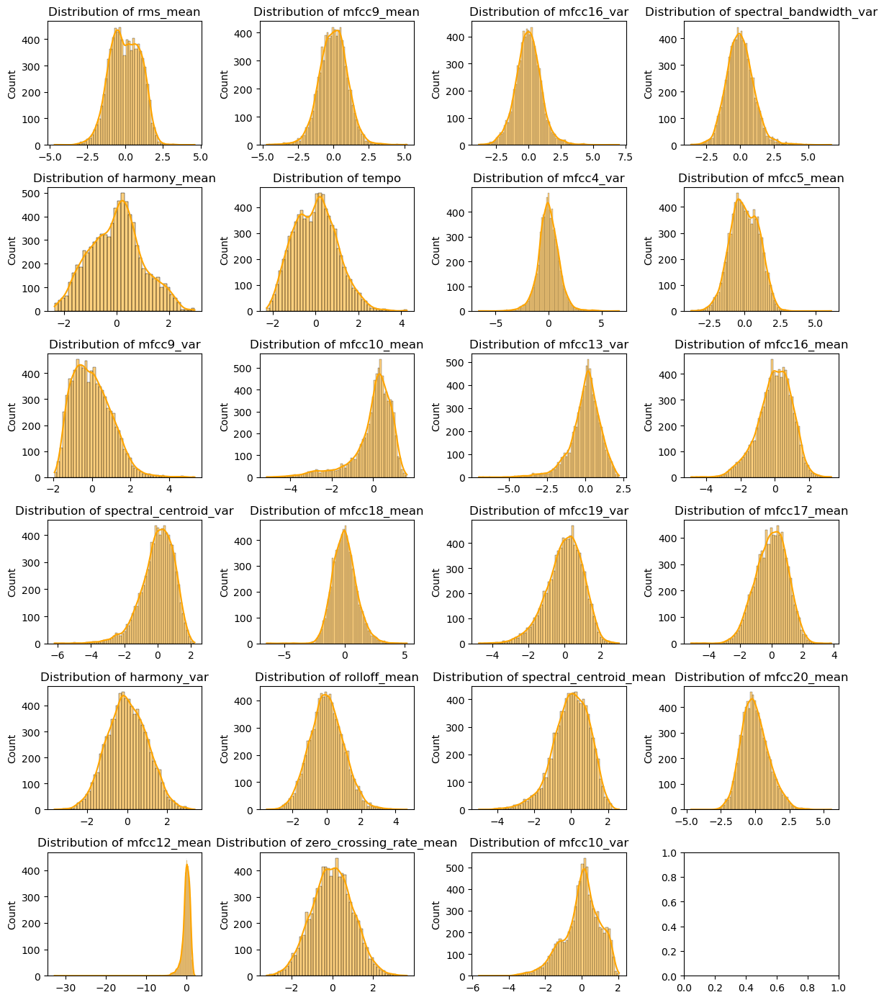

In [110]:
# test preprocessing for all best features
X_train_v2_prep_test = pd.DataFrame(prep_all_best_features.fit_transform(X_train_v2), 
                                    columns=X_train_v2.columns)


# checking if the transformations have resulted in unintended missing values
print(f"\nMissing values after preprocessing:\n\n{X_train_v2_prep_test.isnull().sum()}\n")

fig, axes = plt.subplots(6, 4, figsize=(12, 14))
axes = axes.ravel()

# test-plot transformed features 
for i, feature in enumerate(X_train_v2_prep_test.iloc[:,10:]):
    sns.histplot(data=X_train_v2_prep_test, x=feature, ax=axes[i], kde=True, color='orange')
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel('')
plt.tight_layout()
plt.show()

In [111]:
# ## PLEASE NOTE: Commented out due to long computing time. Output is stored in variables below this cell.

# # Explore mean cross-validation accuracies for Random Forest Classifier trained on
# # different number of best features

# # Collect accuracy scores for tried number of features
# forest_test_accuracies = []
# forest_cv_accuracies = []

# # collect features to be preprocessed by the column transformer
# group1 = []
# group2 = []
# group3 = []

# # iterate through all 33 best features
# for feature in all_best_features:
#     # construct temporary column transformers that reflect growing number of tested features    
#     if feature in scal_pipeline_feats:
#         group1.append(feature)
#     elif feature in log_scal_pipeline_feats:
#         group2.append(feature)
#     else:
#         group3.append(feature)
    
#     # update the column transformer with tested features
#     features_test = ColumnTransformer([
#     ('scal', scal_pipeline, group1),
#     ('log', log_scal_pipeline, group2),
#     ('log2', log_scal_pipeline2, group3)
#     ], remainder='drop')

#     # train default Random Forest model on the growing number of features
#     forest_features_test = make_pipeline(features_test, RandomForestClassifier(max_depth=16, random_state=seed))
#     forest_features_test.fit(X_train_v2, y_train_v2)

#     # make predictions on X_test
#     y_pred = forest_features_test.predict(X_test_v2)

#     # get accuracy scores for test set and mean cross-validation 
#     y_test_score = accuracy_score(y_test_v2, y_pred)
#     y_mean_cv_score= np.mean(cross_val_score(forest_features_test, X_train_v2, y_train_v2, cv=3))                               

#     # collect accuracy scores
#     forest_test_accuracies.append(y_test_score)
#     forest_cv_accuracies.append(y_mean_cv_score)

In [112]:
forest_test_accuracies = [0.21521521521521522, 0.3023023023023023, 0.44594594594594594,
                          0.566066066066066, 0.6351351351351351, 0.6646646646646647,
                          0.6981981981981982, 0.7182182182182182, 0.7242242242242243,
                          0.7802802802802803, 0.7992992992992993, 0.8123123123123123, 
                          0.8058058058058059, 0.8098098098098098, 0.8203203203203203, 
                          0.8283283283283284, 0.8293293293293293, 0.8393393393393394, 
                          0.8408408408408409, 0.8378378378378378, 0.8383383383383384,
                          0.8438438438438438, 0.8378378378378378, 0.8358358358358359, 
                          0.8333333333333334, 0.8443443443443444, 0.8438438438438438, 
                          0.8463463463463463, 0.8533533533533534, 0.8553553553553553, 
                          0.8478478478478478, 0.8568568568568569, 0.8503503503503503]

In [113]:
forest_cv_accuracies = [0.19669669669669668, 0.3039289289289289, 0.45983483483483484,
                        0.548048048048048, 0.6238738738738739, 0.6591591591591591,
                        0.6844344344344345, 0.703953953953954, 0.7130880880880882,
                        0.7606356356356357, 0.7767767767767767, 0.7944194194194195,
                        0.791041041041041, 0.7855355355355357, 0.7997997997997998, 
                        0.8079329329329329, 0.8066816816816816, 0.8141891891891891,
                        0.8125625625625625, 0.8225725725725725, 0.8191941941941941, 
                        0.8173173173173174, 0.8138138138138138, 0.8171921921921922, 
                        0.815065065065065, 0.8173173173173173, 0.819944944944945, 
                        0.8241991991991992, 0.8273273273273274, 0.8238238238238238, 
                        0.8290790790790791, 0.8298298298298298, 0.83008008008008]

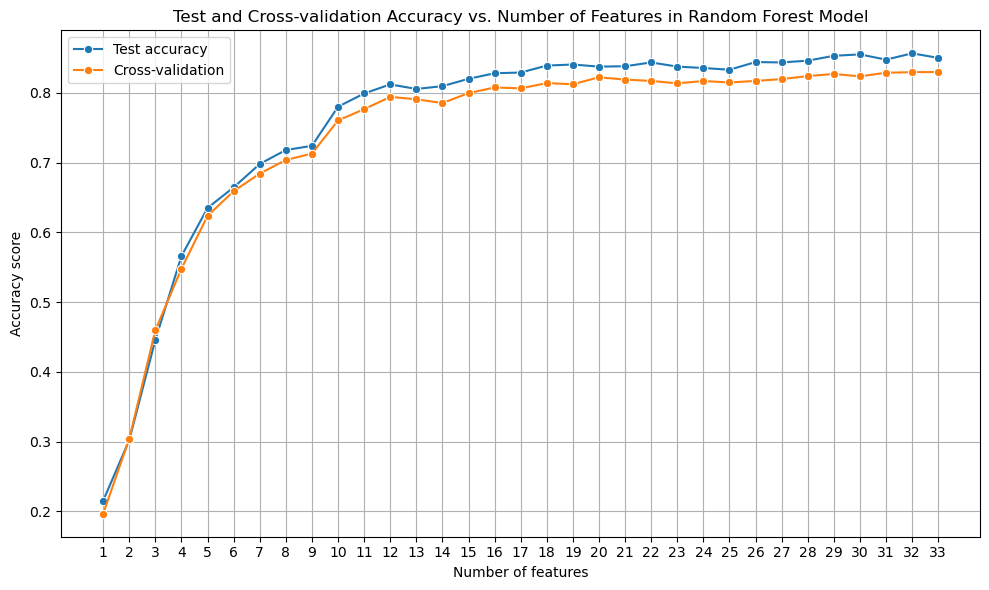

In [114]:
# plot test and cross-validation accuracy scores for the best 33 features
number_of_features = np.arange(1, X_train_v2.shape[1] + 1)
                               
plt.figure(figsize=(10, 6))
sns.lineplot(x=number_of_features, y=forest_test_accuracies, label='Test accuracy', marker='o')
sns.lineplot(x=number_of_features, y=forest_cv_accuracies, label='Cross-validation', marker='o')
plt.title('Test and Cross-validation Accuracy vs. Number of Features in Random Forest Model')
plt.xlabel('Number of features')
plt.ylabel('Accuracy score')
plt.xticks(number_of_features)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

In [115]:
cv_accuracy_20feats = forest_cv_accuracies[19] # 20 features
cv_accuracies_32feats = forest_cv_accuracies[30] # 32 features

print(f"CV accuracy on 20 features: {round(cv_accuracy_20feats,3)}\nCV accuracy on 32 features: {round(cv_accuracies_32feats,3)}")

CV accuracy on 20 features: 0.823
CV accuracy on 32 features: 0.829


In [116]:
test_accuracy_20feats = forest_test_accuracies[19] # 20 features
test_accuracy_32feats = forest_test_accuracies[31] # 32 features

print(f"Test accuracy on 20 features: {round(test_accuracy_20feats,3)}\nTest accuracy on 32 features: {round(test_accuracy_32feats,3)}")

Test accuracy on 20 features: 0.838
Test accuracy on 32 features: 0.857


In [117]:
# write-up: 20 features perform pretty well on both CV and test set. There's a small dip in acuracy afterwards to co a bit higher around 30 features. Is the small gain of 32 features worth the cost of computing power?

In [118]:
# collect the groups of features that appear to contributethe most towards the accuracy score
best_features_forest = all_best_features[:12] + all_best_features[14:16] + [all_best_features[19]] + all_best_features[25:]
best_features_forest

['chroma_stft_mean',
 'mfcc4_mean',
 'perceptr_var',
 'rms_var',
 'spectral_bandwidth_mean',
 'mfcc1_var',
 'rolloff_var',
 'mfcc1_mean',
 'chroma_stft_var',
 'perceptr_mean',
 'rms_mean',
 'mfcc9_mean',
 'harmony_mean',
 'tempo',
 'mfcc10_mean',
 'mfcc17_mean',
 'harmony_var',
 'rolloff_mean',
 'spectral_centroid_mean',
 'mfcc20_mean',
 'mfcc12_mean',
 'zero_crossing_rate_mean',
 'mfcc10_var']

In [119]:
# ## PLEASE NOTE: Commented out due to long computing time. Output is stored in variables below this cell.

# # Explore mean cross-validation accuracies for Random Forest Classifier trained on
# # the reduced number of best features

# # Collect accuracy scores for tried number of features
# forest_test_accuracies_v2 = []
# forest_cv_accuracies_v2 = []

# # collect features to be preprocessed by the column transformer
# group1 = []
# group2 = []
# group3 = []

# # iterate through the selected features
# for feature in best_features_forest:
#     # construct temporary column transformers that reflect growing number of tested features    
#     if feature in scal_pipeline_feats:
#         group1.append(feature)
#     elif feature in log_scal_pipeline_feats:
#         group2.append(feature)
#     else:
#         group3.append(feature)
    
#     # update the column transformer with tested features
#     features_test = ColumnTransformer([
#     ('scal', scal_pipeline, group1),
#     ('log', log_scal_pipeline, group2),
#     ('log2', log_scal_pipeline2, group3)
#     ], remainder='drop')

#     # train default Random Forest model on the growing number of features
#     forest_features_test_v2 = make_pipeline(features_test, RandomForestClassifier(random_state=seed))
#     forest_features_test_v2.fit(X_train_v2, y_train_v2)

#     # make predictions on X_test
#     y_pred = forest_features_test_v2.predict(X_test_v2)

#     # get accuracy scores for test set and mean cross-validation 
#     y_test_score = accuracy_score(y_test_v2, y_pred)
#     y_mean_cv_score= np.mean(cross_val_score(forest_features_test_v2, X_train_v2, y_train_v2, cv=3))                               

#     # collect accuracy scores
#     forest_test_accuracies_v2.append(y_test_score)
#     forest_cv_accuracies_v2.append(y_mean_cv_score)

In [120]:
forest_test_accuracies_v2 = [0.21521521521521522, 0.3023023023023023, 0.44594594594594594,
                             0.566066066066066, 0.6351351351351351, 0.6646646646646647, 
                             0.6981981981981982, 0.7182182182182182, 0.7242242242242243, 
                             0.7802802802802803, 0.7992992992992993, 0.8123123123123123, 
                             0.8238238238238238, 0.8348348348348348, 0.8393393393393394, 
                             0.8393393393393394, 0.8468468468468469, 0.8498498498498499, 
                             0.8558558558558559, 0.8503503503503503, 0.8563563563563563, 
                             0.8578578578578578, 0.8608608608608609]

In [121]:
forest_cv_accuracies_v2 = [0.19669669669669668, 0.3039289289289289, 0.45983483483483484, 
                           0.548048048048048, 0.6238738738738739, 0.6591591591591591, 
                           0.6844344344344345, 0.703953953953954, 0.7130880880880882, 
                           0.7606356356356357, 0.7767767767767767, 0.7944194194194195, 
                           0.803053053053053, 0.8085585585585585, 0.8143143143143142, 
                           0.8186936936936937, 0.8221971971971972, 0.8265765765765766, 
                           0.8253253253253253, 0.8302052052052052, 0.8287037037037037, 
                           0.826951951951952, 0.8278278278278278]

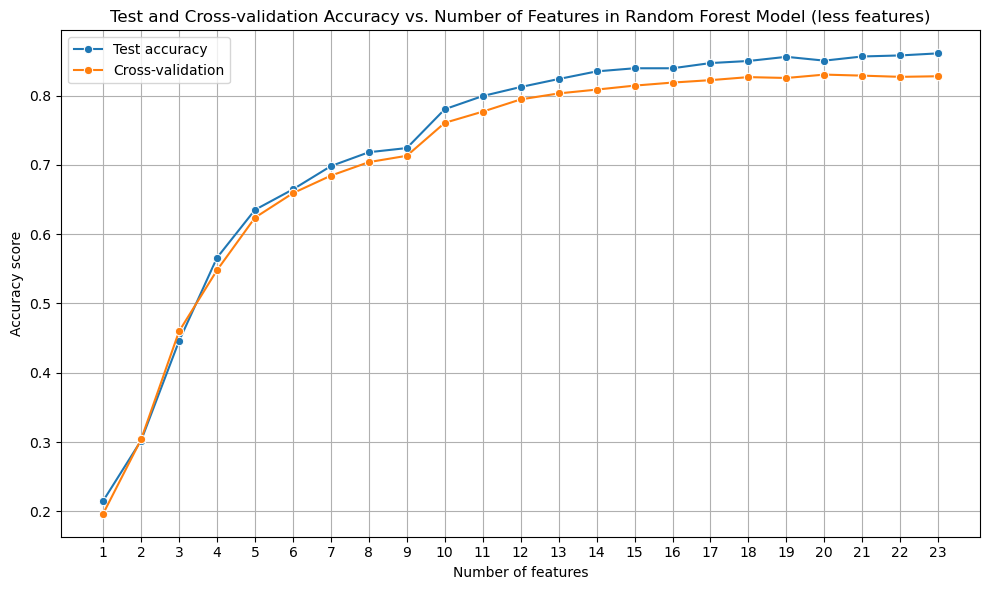

In [122]:
# plot test and cross-validation accuracy scores for different number of features
number_of_features = np.arange(1, X_train_v2[best_features_forest].shape[1] + 1)
                               
plt.figure(figsize=(10, 6))
sns.lineplot(x=number_of_features, y=forest_test_accuracies_v2, label='Test accuracy', marker='o')
sns.lineplot(x=number_of_features, y=forest_cv_accuracies_v2, label='Cross-validation', marker='o')
plt.title('Test and Cross-validation Accuracy vs. Number of Features in Random Forest Model (less features)')
plt.xlabel('Number of features')
plt.ylabel('Accuracy score')
plt.xticks(number_of_features)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

In [123]:
cv_accuracy_20feats_v2 = forest_cv_accuracies_v2[19] # 20 features
test_accuracy_20feats_v2 = forest_test_accuracies_v2[19] # 20 features

print(f"CV accuracy on 20 features: {round(cv_accuracy_20feats_v2,4)} \nTest accuracy on 20 features: {round(test_accuracy_20feats_v2,4)}")

CV accuracy on 20 features: 0.8302 
Test accuracy on 20 features: 0.8504


In [124]:
# store the first 20 features that contribute to the accuracy score the most
forest_20final_features = best_features_forest[:20]

print("Final set of features for Random Forest:")
forest_20final_features

Final set of features for Random Forest:


['chroma_stft_mean',
 'mfcc4_mean',
 'perceptr_var',
 'rms_var',
 'spectral_bandwidth_mean',
 'mfcc1_var',
 'rolloff_var',
 'mfcc1_mean',
 'chroma_stft_var',
 'perceptr_mean',
 'rms_mean',
 'mfcc9_mean',
 'harmony_mean',
 'tempo',
 'mfcc10_mean',
 'mfcc17_mean',
 'harmony_var',
 'rolloff_mean',
 'spectral_centroid_mean',
 'mfcc20_mean']

#### Automated Hyperparameter Tuning

In [125]:
# crate empty lists to store grouped features for the column transformer 
group1 = []
group2 = []
group3 = []

# iterate through the selected 20 features and group them for preprocessing
for feature in forest_20final_features:  
    if feature in scal_pipeline_feats:
        group1.append(feature)
    elif feature in log_scal_pipeline_feats:
        group2.append(feature)
    else:
        group3.append(feature)
    
# construct column transformer for all 20 selected features  
prep_20_best_features = ColumnTransformer([
    ('scal', scal_pipeline, group1),
    ('log', log_scal_pipeline, group2),
    ('log2', log_scal_pipeline2, group3)
], remainder='drop')

# ## PLEASE NOTE: The Randomised Search is commented out due to long computing time. The set of optimal hyperparameters 
# ## found in the process is presented in the markdown cell (below) and further used in the final model.

# # construct final pipeline to combine both the preprocessing steps and the classifier
# full_pipeline_forest = Pipeline([
#     ('prep_all', prep_20_best_features), # preprocessing
#     ('forest', RandomForestClassifier(random_state=seed))
# ]) 

# # collect distributions of parameters for testing
# param_distr = {"forest__n_estimators" : np.arange(50, 500, 10),
#                "forest__max_depth" : np.arange(10,31),
#                "forest__min_samples_leaf" : np.arange(1, 10),
#                "forest__min_samples_split" : np.arange(2, 20),
#                "forest__criterion" : ['gini', 'entropy'],
#                "forest__bootstrap" : [True, False],
#                "forest__max_features" : ['sqrt', 'log2', 0.5, 0.6, 0.7, 0.8]}

# # set-up the RandomisedSearchCV 
# rand_search_forest = RandomizedSearchCV(estimator=full_pipeline_forest,
#                                         param_distributions=param_distr,
#                                         cv=5,
#                                         n_iter=50,
#                                         scoring='accuracy',
#                                         n_jobs=-1,
#                                         random_state=seed)

# # search for the best parameters
# rand_search_forest.fit(X_train_v2, y_train_v2)
# rand_search_forest.best_params_

Best hyperparameters for Random Forest found through RandomizedSearchCV:

rand_search_forest.best_params_

{'forest__n_estimators': 210,<br>
 'forest__min_samples_split': 5,<br>
 'forest__min_samples_leaf': 1,<br>
 'forest__max_features': 0.5,<br>
 'forest__max_depth': 22,<br>
 'forest__criterion': 'entropy',<br>
 'forest__bootstrap': False}<br>

In [126]:
# ## PLEASE NOTE: Commented out due to long computing time for the Randomised Search above. 
# ## The markdown cell below contains a screenshot of the 10 best accuracy scores achieved in the search.

# # display scores from the randomised search (best parameters come from the top test)
# rand_search_forest_scores = pd.DataFrame(rand_search_forest.cv_results_)
# rand_search_forest_scores.sort_values(by="mean_test_score", ascending=False, inplace=True)
# rand_search_forest_scores[['rank_test_score', 'mean_test_score', 'std_test_score', 'split0_test_score',
#                            'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score']].head(10)

Scores from the randomised search:

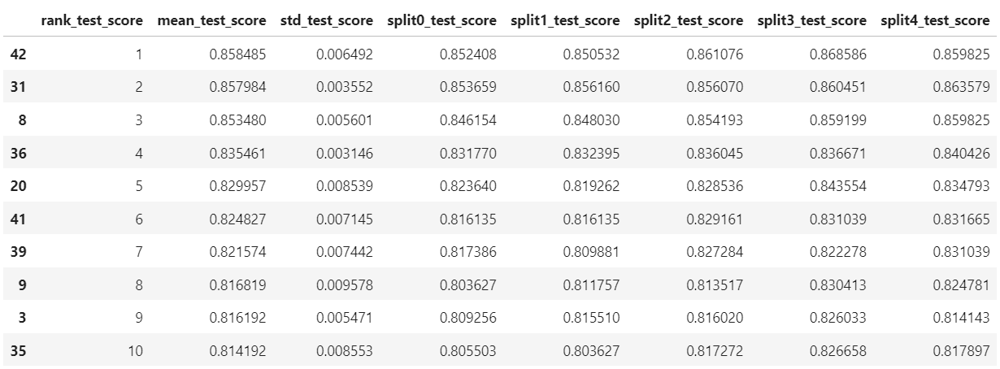

In [127]:
# construct a pipeline for the fine-tuned model using the hyperparameters found in the RandomizedSearchCV

forest_tuned_model = make_pipeline(prep_20_best_features,
                                   RandomForestClassifier(
                                       n_estimators=210,
                                       min_samples_split=5,
                                       min_samples_leaf=1,
                                       max_features=0.5,
                                       max_depth=22,
                                       criterion='entropy',
                                       bootstrap=False
                                       )
                                  ) 

In [128]:
# cross-validate the fine-tuned model and return predictions for X_train over 5 folds 
# (5 folds due to computing time but idealy it there would be 10 folds)

tuned_forest_CV = cross_val_predict(forest_tuned_model, X_train_v2, y_train_v2, cv=5, n_jobs=-1)

Classification Report:
               precision    recall  f1-score   support

       blues       0.82      0.85      0.84       800
   classical       0.92      0.94      0.93       799
     country       0.76      0.80      0.78       798
       disco       0.86      0.86      0.86       799
      hiphop       0.92      0.86      0.89       798
        jazz       0.81      0.86      0.83       800
       metal       0.91      0.92      0.91       800
         pop       0.91      0.87      0.89       800
      reggae       0.83      0.87      0.85       800
        rock       0.86      0.74      0.79       798

    accuracy                           0.86      7992
   macro avg       0.86      0.86      0.86      7992
weighted avg       0.86      0.86      0.86      7992



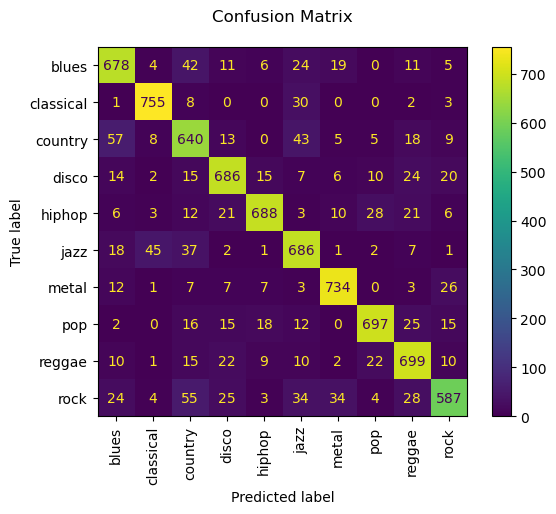

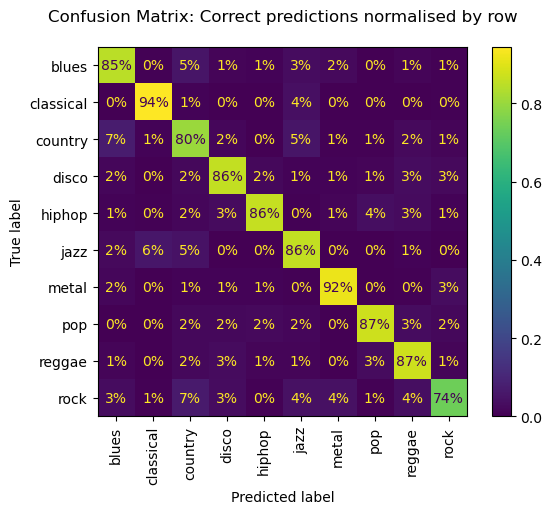

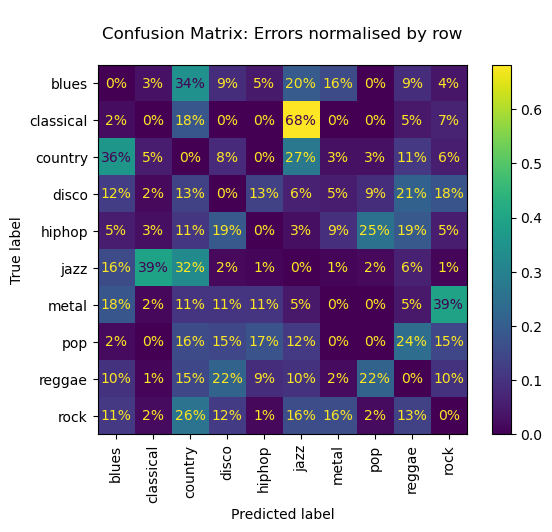

In [129]:
# Evaluate the tuned model's performance using cross-validation data
print("Classification Report:\n", classification_report(y_train_v2, tuned_forest_CV))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_train_v2, tuned_forest_CV,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_train_v2, tuned_forest_CV,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (tuned_forest_CV != y_train_v2) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_train_v2, tuned_forest_CV,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

### K-Nearest Neighbours Classifier

#### Manual Exploration of the Optimal Number of Neighbours

In [130]:
# Manually explore the optimal n_neighbors hyperparameter setting for KNN model

neighbours = [k for k in np.arange(1, 13, 2, dtype=int)]  # Values of n_neighbors to compare

# Collect accuracy scores for tried K values (n_neighbors)
knn_test_accuracies = []
knn_cv_accuracies = []


for K in neighbours:
    # construct temporary pipeline with tried C_value setting
    K_search_model = make_pipeline(preprocessing, KNeighborsClassifier(n_neighbors=K))

    # get training predictions and cross-validation predictions 
    K_search_model.fit(X_train, y_train)
    y_pred_knn = K_search_model.predict(X_test)
    y_cv_pred = cross_val_predict(K_search_model, X_train, y_train, cv=3)                               

    # calculate and collect accuracy scores
    test_accuracy = accuracy_score(y_test, y_pred_knn)
    cv_accuracy = accuracy_score(y_train, y_cv_pred)
    knn_test_accuracies.append(test_accuracy)
    knn_cv_accuracies.append(cv_accuracy)

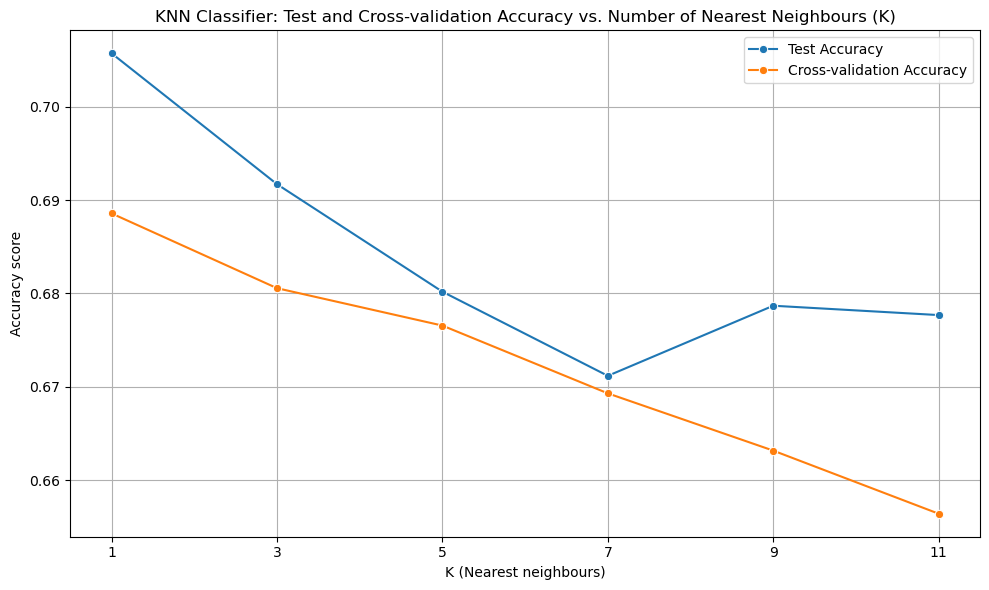

In [131]:
# plot training and cross-validation accuracy scores for different K values (n_neighbor hyperparameter)

plt.figure(figsize=(10, 6))
sns.lineplot(x=neighbours, y=knn_test_accuracies, label='Test Accuracy', marker='o')
sns.lineplot(x=neighbours, y=knn_cv_accuracies, label='Cross-validation Accuracy', marker='o')
plt.title('KNN Classifier: Test and Cross-validation Accuracy vs. Number of Nearest Neighbours (K)')
plt.xlabel('K (Nearest neighbours)')
plt.ylabel('Accuracy score')
plt.xticks(neighbours)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

In [132]:
# write-up: K=1 appears to return the best results

#### Performance of KNN Classifier Trained on Different Number of Features

In [133]:
## commented out due to long computing time. Output stored to variables below.

# Explore mean cross-validation accuracies for KNN Classifier trained on
# different number of best features

# Collect accuracy scores for tried number of features
knn_test_accuracies = []
knn_cv_accuracies = []

# collect features to be preprocessed by the column transformer
group1 = []
group2 = []
group3 = []

# iterate through all 33 best features
for feature in all_best_features:
    # construct temporary column transformers that reflect growing number of tested features    
    if feature in scal_pipeline_feats:
        group1.append(feature)
    elif feature in log_scal_pipeline_feats:
        group2.append(feature)
    else:
        group3.append(feature)
    
    # update the column transformer with tested features
    features_test = ColumnTransformer([
    ('scal', scal_pipeline, group1),
    ('log', log_scal_pipeline, group2),
    ('log2', log_scal_pipeline2, group3)
    ], remainder='drop')

    # train a KNN model (with previously found optimal n_neighbors=1) on the growing number of features
    KNN_features_test = make_pipeline(features_test, KNeighborsClassifier(n_neighbors=1, n_jobs=-1)) 
    KNN_features_test.fit(X_train_v2, y_train_v2)

    # make predictions on X_test
    y_pred = KNN_features_test.predict(X_test_v2)

    # get accuracy scores for test set and mean cross-validation 
    y_test_score_KNN = accuracy_score(y_test_v2, y_pred)
    y_mean_cv_score_KNN= np.mean(cross_val_score(KNN_features_test, X_train_v2, y_train_v2, cv=3, n_jobs=-1))                               

    # collect accuracy scores
    knn_test_accuracies.append(y_test_score_KNN)
    knn_cv_accuracies.append(y_mean_cv_score_KNN)

C:\Users\lukas\anaconda3\envs\MScAI\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\lukas\anaconda3\envs\MScAI\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\lukas\anaconda3\envs\MScAI\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\lukas\anaconda3\envs\MScAI\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\lukas\anaconda3\envs\MScAI\Lib\subprocess.py", line 1538, in 

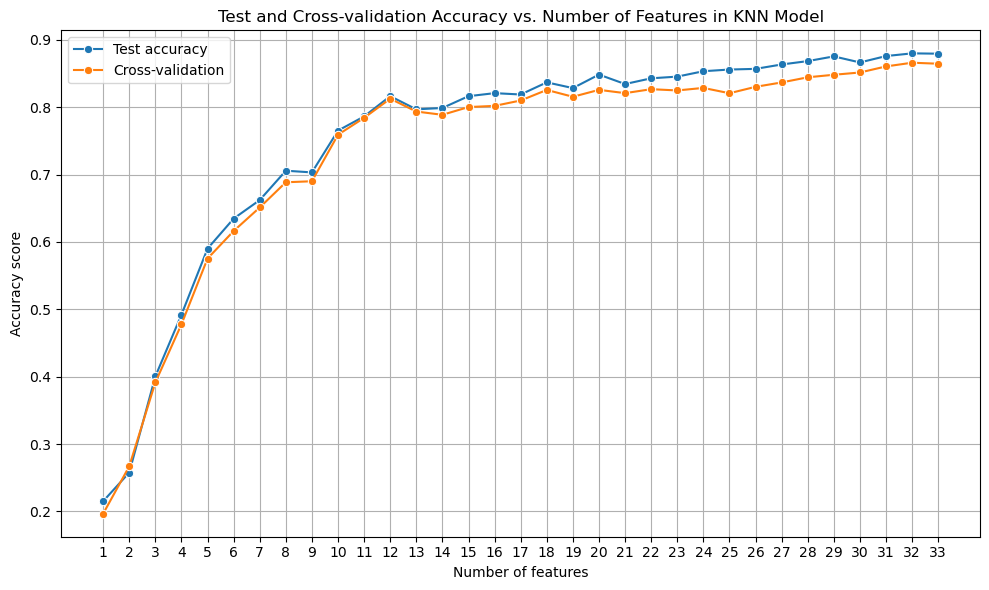

In [134]:
# plot test and cross-validation accuracy scores for different number of features
number_of_features = np.arange(1, X_train_v2.shape[1] + 1)
                               
plt.figure(figsize=(10, 6))
sns.lineplot(x=number_of_features, y=knn_test_accuracies, label='Test accuracy', marker='o')
sns.lineplot(x=number_of_features, y=knn_cv_accuracies, label='Cross-validation', marker='o')
plt.title('Test and Cross-validation Accuracy vs. Number of Features in KNN Model')
plt.xlabel('Number of features')
plt.ylabel('Accuracy score')
plt.xticks(number_of_features)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

In [135]:
# Write-up: dip and rather unstable accuracy growth between 13th and 25th features.  
# Below I repeat the experiment on the set of features excluding the ones between 13 and 25


In [136]:
best_features_knn = all_best_features[:12] + all_best_features[25:]
best_features_knn

['chroma_stft_mean',
 'mfcc4_mean',
 'perceptr_var',
 'rms_var',
 'spectral_bandwidth_mean',
 'mfcc1_var',
 'rolloff_var',
 'mfcc1_mean',
 'chroma_stft_var',
 'perceptr_mean',
 'rms_mean',
 'mfcc9_mean',
 'mfcc17_mean',
 'harmony_var',
 'rolloff_mean',
 'spectral_centroid_mean',
 'mfcc20_mean',
 'mfcc12_mean',
 'zero_crossing_rate_mean',
 'mfcc10_var']

In [137]:
# Explore mean cross-validation accuracies for KNN Classifier trained on
# the features that appear to be increasing the model's accuracy score the most

# Collect accuracy scores for tried number of features
knn_test_accuracies_v2 = []
knn_cv_accuracies_v2 = []

# collect features to be preprocessed by the column transformer
group1 = []
group2 = []
group3 = []

# iterate through all 33 best features
for feature in best_features_knn:
    # construct temporary column transformers that reflect growing number of tested features    
    if feature in scal_pipeline_feats:
        group1.append(feature)
    elif feature in log_scal_pipeline_feats:
        group2.append(feature)
    else:
        group3.append(feature)
    
    # update the column transformer with tested features
    features_test = ColumnTransformer([
    ('scal', scal_pipeline, group1),
    ('log', log_scal_pipeline, group2),
    ('log2', log_scal_pipeline2, group3)
    ], remainder='drop')

    # train a KNN model (with previously found optimal n_neighbors=1) on the growing number of features
    KNN_features_test = make_pipeline(features_test, KNeighborsClassifier(n_neighbors=1, n_jobs
                                                                          =-1)) 
    KNN_features_test.fit(X_train_v2, y_train_v2)

    # make predictions on X_test
    y_pred = KNN_features_test.predict(X_test_v2)

    # get accuracy scores for test set and mean cross-validation 
    y_test_score_KNN_v2 = accuracy_score(y_test_v2, y_pred)
    y_mean_cv_score_KNN_v2= np.mean(cross_val_score(KNN_features_test, X_train_v2, y_train_v2, cv=3))                               

    # collect accuracy scores
    knn_test_accuracies_v2.append(y_test_score_KNN_v2)
    knn_cv_accuracies_v2.append(y_mean_cv_score_KNN_v2)

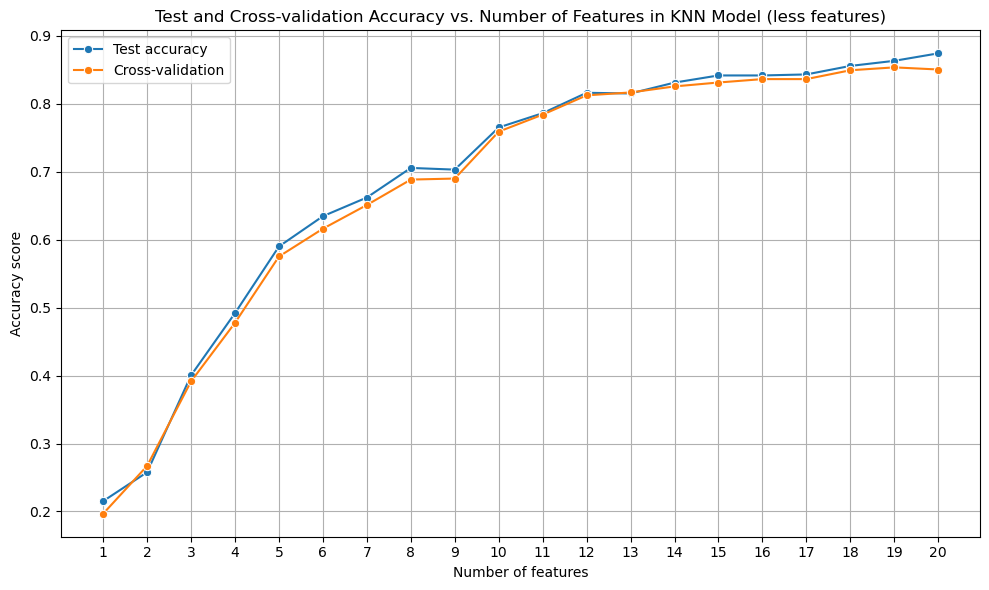

In [138]:
# plot test and cross-validation accuracy scores forthe reduced number of features
number_of_features = np.arange(1, X_train_v2[best_features_knn].shape[1] + 1)
                               
plt.figure(figsize=(10, 6))
sns.lineplot(x=number_of_features, y=knn_test_accuracies_v2, label='Test accuracy', marker='o')
sns.lineplot(x=number_of_features, y=knn_cv_accuracies_v2, label='Cross-validation', marker='o')
plt.title('Test and Cross-validation Accuracy vs. Number of Features in KNN Model (less features)')
plt.xlabel('Number of features')
plt.ylabel('Accuracy score')
plt.xticks(number_of_features)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

In [139]:
knn_cv_accuracies_v2[18]

0.8537287287287287

In [140]:
# write-up: 

In [141]:
# store the final set of features for KNN in a variable
knn_19final_features = best_features_knn[:19]

#### Automated Hyperparameter Tuning

In [142]:
# crate empty lists to store grouped features for the column transformer 
group1 = []
group2 = []
group3 = []

# iterate through the selected 19 features and group them for preprocessing
for feature in knn_19final_features:  
    if feature in scal_pipeline_feats:
        group1.append(feature)
    elif feature in log_scal_pipeline_feats:
        group2.append(feature)
    else:
        group3.append(feature)
    
# construct column transformer for all 19 selected features  
prep_19_best_features_knn = ColumnTransformer([
    ('scal', scal_pipeline, group1),
    ('log', log_scal_pipeline, group2),
    ('log2', log_scal_pipeline2, group3)
], remainder='drop')

# construct final pipeline to combine both the preprocessing steps and the classifier
full_pipeline_knn = Pipeline([
    ('prep_all', prep_19_best_features_knn), # preprocessing pipeline
    ('knn', KNeighborsClassifier())
]) 

# collect distributions of parameters for testing
param_distr = {"knn__n_neighbors" : np.arange(1,13),
               "knn__metric" : ['euclidean', 'manhattan', 'minkowski'],
               "knn__leaf_size" : np.arange(10,60,10),
               "knn__algorithm" : ['kd_tree', 'auto', 'ball_tree', 'brute'],
               "knn__p" : [1, 2, 3], # parameter for the Minkowski metric,
               "knn__weights" : ['uniform', 'distance']
              }

# set-up the RandomisedSearchCV 
rand_search_knn = RandomizedSearchCV(estimator=full_pipeline_knn,
                                        param_distributions=param_distr,
                                        cv=5,
                                        n_iter=50,
                                        scoring='accuracy',
                                        n_jobs=-1,
                                        random_state=seed)

# search for the best parameters
rand_search_knn.fit(X_train_v2, y_train_v2)
rand_search_knn.best_params_

{'knn__weights': 'uniform',
 'knn__p': 3,
 'knn__n_neighbors': 1,
 'knn__metric': 'manhattan',
 'knn__leaf_size': 40,
 'knn__algorithm': 'ball_tree'}

In [143]:
# display scores from the randomised search (best parameters come from the top test)
rand_search_knn_scores = pd.DataFrame(rand_search_knn.cv_results_)
rand_search_knn_scores.sort_values(by="mean_test_score", ascending=False, inplace=True)
rand_search_knn_scores[['rank_test_score', 'mean_test_score', 'std_test_score', 'split0_test_score',
                        'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score']].head(10)

,rank_test_score,mean_test_score,std_test_score,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
10,1,0.883759,0.004649,0.884928,0.880550,0.892365,0.879850,0.881101
42,1,0.883759,0.004649,0.884928,0.880550,0.892365,0.879850,0.881101
8,1,0.883759,0.004649,0.884928,0.880550,0.892365,0.879850,0.881101
38,1,0.883759,0.004649,0.884928,0.880550,0.892365,0.879850,0.881101
23,5,0.883634,0.004741,0.884928,0.879925,0.892365,0.879850,0.881101
5,6,0.877502,0.003869,0.881176,0.874922,0.882979,0.875469,0.872966
4,7,0.873499,0.004721,0.874296,0.867417,0.881727,0.872966,0.871089
29,7,0.873499,0.004721,0.874296,0.867417,0.881727,0.872966,0.871089
36,9,0.868368,0.004965,0.864916,0.876173,0.866708,0.871715,0.862328
43,10,0.868243,0.005013,0.864916,0.876173,0.866083,0.871715,0.862328


In [144]:
# construct a pipeline for the fine-tuned model using the hyperparameters found in the RandomizedSearchCV

knn_tuned_model = make_pipeline(prep_19_best_features_knn,
                                   KNeighborsClassifier(
                                       n_neighbors=1,
                                       metric='manhattan',
                                       leaf_size=40,
                                       weights='uniform',
                                       p=3,
                                       algorithm='ball_tree'
                                       )
                                  ) 

Classification Report:
               precision    recall  f1-score   support

       blues       0.89      0.91      0.90       800
   classical       0.94      0.96      0.95       799
     country       0.80      0.79      0.80       798
       disco       0.88      0.89      0.89       799
      hiphop       0.94      0.91      0.93       798
        jazz       0.86      0.87      0.86       800
       metal       0.95      0.94      0.95       800
         pop       0.94      0.89      0.91       800
      reggae       0.87      0.92      0.89       800
        rock       0.82      0.81      0.81       798

    accuracy                           0.89      7992
   macro avg       0.89      0.89      0.89      7992
weighted avg       0.89      0.89      0.89      7992



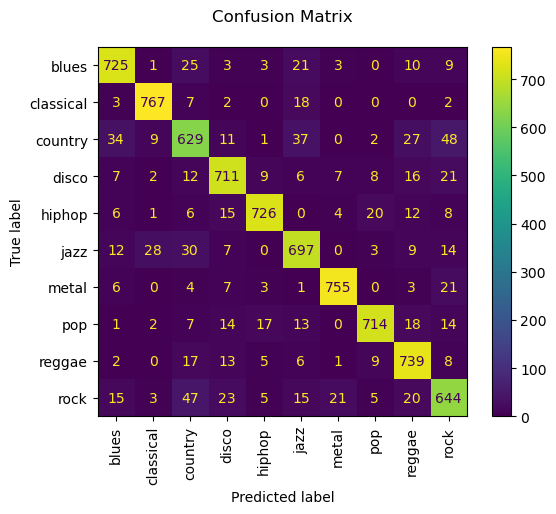

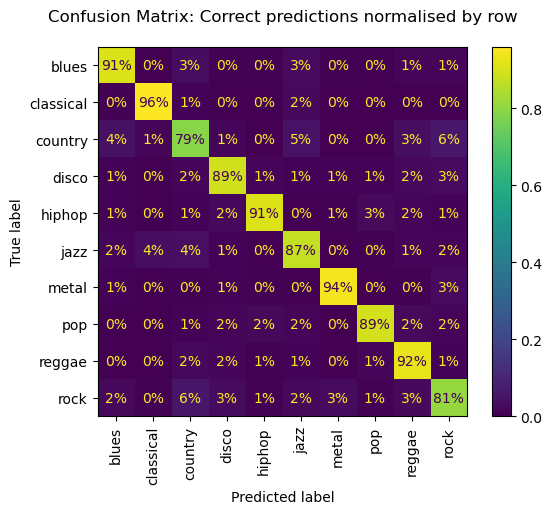

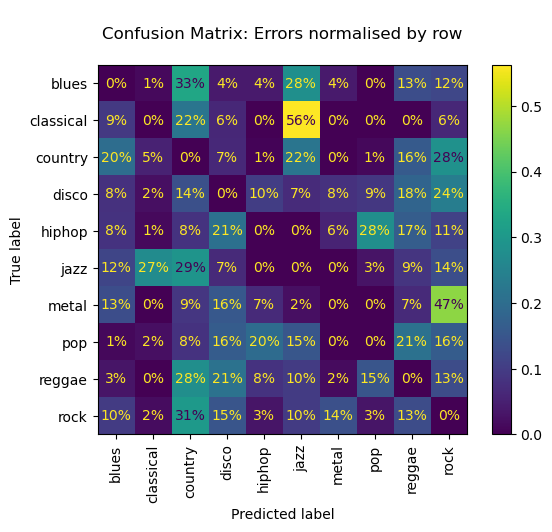

In [145]:
# cross-validate the fine-tuned model and return predictions for X_train over 5 folds
tuned_knn_CV = cross_val_predict(knn_tuned_model, X_train_v2, y_train_v2, cv=10) 

# Evaluate the model's performance
print("Classification Report:\n", classification_report(y_train_v2, tuned_knn_CV))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_train_v2, tuned_knn_CV,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_train_v2, tuned_knn_CV,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (tuned_knn_CV != y_train_v2) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_train_v2, tuned_knn_CV,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

## Final Models Evaluation

In [ ]:
#write-up: Justify the choices of models:

#KNN
#Random Forest

### Random Forest

In [147]:
# train the final model on the train data
forest_tuned_model.fit(X_train_v2, y_train_v2)

# predict classes for the test set
forest_final_pred = forest_tuned_model.predict(X_test_v2)

Classification Report:
               precision    recall  f1-score   support

       blues       0.83      0.85      0.84       200
   classical       0.90      0.95      0.93       199
     country       0.77      0.77      0.77       199
       disco       0.84      0.88      0.86       200
      hiphop       0.94      0.87      0.90       200
        jazz       0.80      0.86      0.83       200
       metal       0.90      0.96      0.93       200
         pop       0.93      0.85      0.89       200
      reggae       0.85      0.89      0.87       200
        rock       0.91      0.76      0.83       200

    accuracy                           0.86      1998
   macro avg       0.87      0.86      0.86      1998
weighted avg       0.87      0.86      0.86      1998



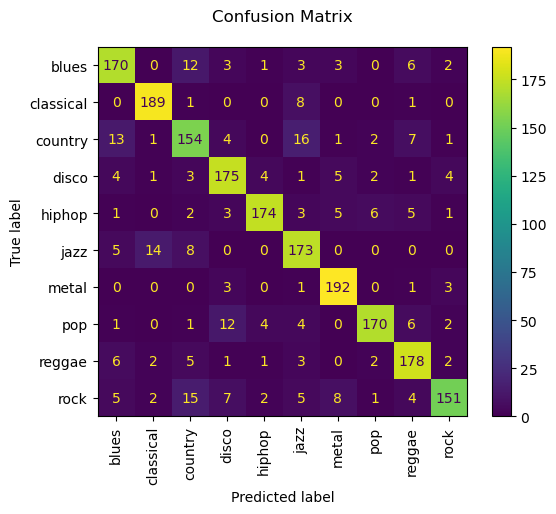

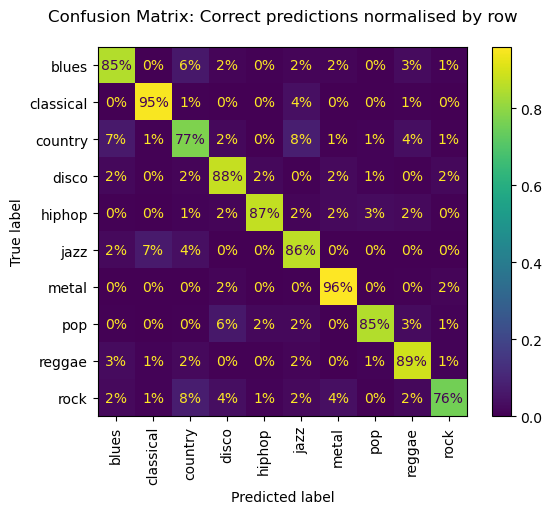

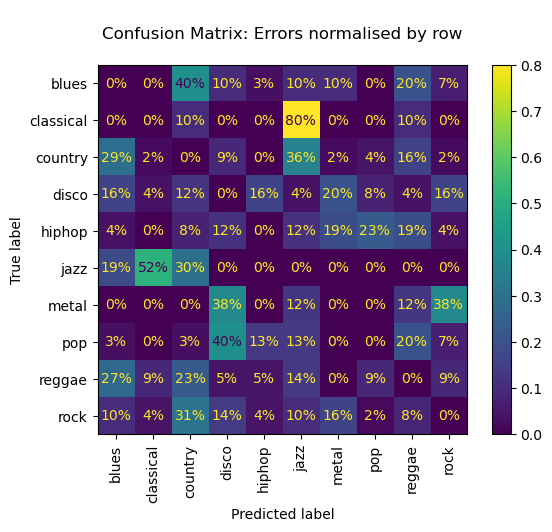

In [151]:
# Evaluate the model's performance on the test data
print("Classification Report:\n", classification_report(y_test_v2, forest_final_pred))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_test_v2, forest_final_pred,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_test_v2, forest_final_pred,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (forest_final_pred != y_test_v2) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_test_v2, forest_final_pred,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

### K-Nearest Neighbours Classifier

In [185]:
# train the final model on the train data
knn_tuned_model.fit(X_train_v2, y_train_v2)

# predict classes for the test set
knn_final_pred = knn_tuned_model.predict(X_test_v2)

Classification Report:
               precision    recall  f1-score   support

       blues       0.85      0.88      0.86       200
   classical       0.91      0.97      0.94       199
     country       0.77      0.75      0.76       199
       disco       0.84      0.89      0.87       200
      hiphop       0.93      0.88      0.90       200
        jazz       0.90      0.89      0.89       200
       metal       0.96      0.96      0.96       200
         pop       0.93      0.88      0.90       200
      reggae       0.87      0.90      0.88       200
        rock       0.84      0.80      0.82       200

    accuracy                           0.88      1998
   macro avg       0.88      0.88      0.88      1998
weighted avg       0.88      0.88      0.88      1998



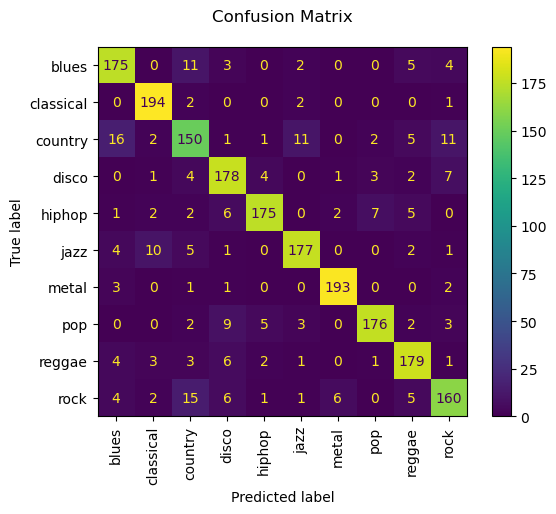

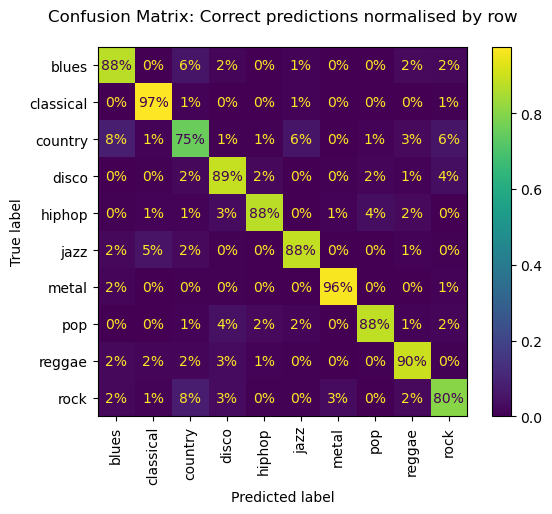

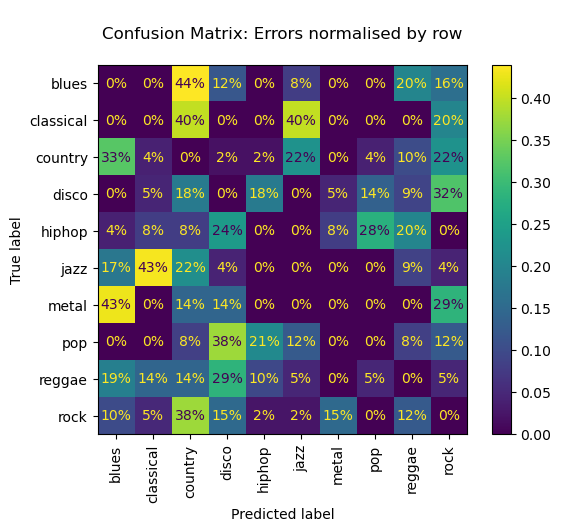

In [150]:
# Evaluate the model's performance on the test data
print("Classification Report:\n", classification_report(y_test_v2, knn_final_pred))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_test_v2, knn_final_pred,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_test_v2, knn_final_pred,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (knn_final_pred != y_test_v2) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_test_v2, knn_final_pred,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

In [ ]:
# write-up:

# Which model has a higher overall accuracy?
# For each class, which model has higher precision, recall, and F1-score?
# Are there any classes where one model performs significantly better than the other?
# How do the models compare on the rarer classes (those with lower support)?

### Statistical comparison of the two models

Demsar (2006) recommends the Wilcoxon signed-ranks test as the most suitable statistical test for comparing the performance of two classifiers trained on two different datasets. The key advantage of the Wilcoxon signed-ranks test is that it can be applied to datasets that do not follow normal distributions, while still giving greater weight to significant differences in the models' performance.

This is a more appropriate statistical test in this case, as the datasets for the Random Forest and KNN classifiers differ in one feature. The Wilcoxon signed-ranks test can account for this difference and provide a robust comparison of the models' performance without making assumptions about the underlying data distributions. 

To determine if there is a statistically significant difference in performance of the two classifiers I use F1 metric as it is a more nuanced metric that takes into account both precision and recall scores.

In [170]:
# outputclassification reports for both models
forest_report = classification_report(y_test_v2, forest_final_pred, output_dict=True)
knn_report = classification_report(y_test_v2, knn_final_pred, output_dict=True)

# # extract the F1-scores for each class
forest_f1_scores = [forest_report[c]['f1-score'] for c in forest_report if c not in [ 'accuracy', 'macro avg', 'weighted avg']]
knn_f1_scores = [knn_report[c]['f1-score'] for c in knn_report if c not in [ 'accuracy', 'macro avg', 'weighted avg']]

# perform the Wilcoxon signed-ranks test
stat, p_value = stats.wilcoxon(forest_f1_scores, knn_f1_scores)

print(f"Wilcoxon signed-ranks test statistic: {round(stat,4)}")
print(f"p-value: {round(p_value, 4)}")

if p_value < 0.05:
    print("\nThe difference is statistically significant")
else:
    print("\nThe difference is not statistically significant")

Wilcoxon signed-ranks test statistic: 6.0
p-value: 0.0273

The difference is statistically significant


In [ ]:
# write_up: there is a statistically significant difference in performance of two models. 

### Novelty: Experiment with 30s data

Can my best KNN model trained on 3s music dataset predict correct classes for 30s dataset? 

In [180]:
data_30s.shape

(1000, 60)

In [186]:
# split the 30s dataset into train and test sets in the same way as previously done with the 3s data
X_train_30s, X_test_30s, y_train_30s, y_test_30s = train_test_split(
    data_30s[knn_19final_features], 
    data_30s['label'], 
    test_size=0.2, 
    random_state=seed, 
    stratify=data_30s['label']
)

# use the best KNN model already trained on 3s samples to predict classes on 30s test data
knn_3s_on_30s_test_pred = knn_tuned_model.predict(X_test_30s)

Classification Report:
               precision    recall  f1-score   support

       blues       0.87      1.00      0.93        20
   classical       1.00      0.95      0.97        20
     country       0.94      0.80      0.86        20
       disco       1.00      0.95      0.97        20
      hiphop       1.00      1.00      1.00        20
        jazz       0.95      0.95      0.95        20
       metal       1.00      1.00      1.00        20
         pop       1.00      1.00      1.00        20
      reggae       0.91      1.00      0.95        20
        rock       1.00      1.00      1.00        20

    accuracy                           0.96       200
   macro avg       0.97      0.97      0.96       200
weighted avg       0.97      0.96      0.96       200



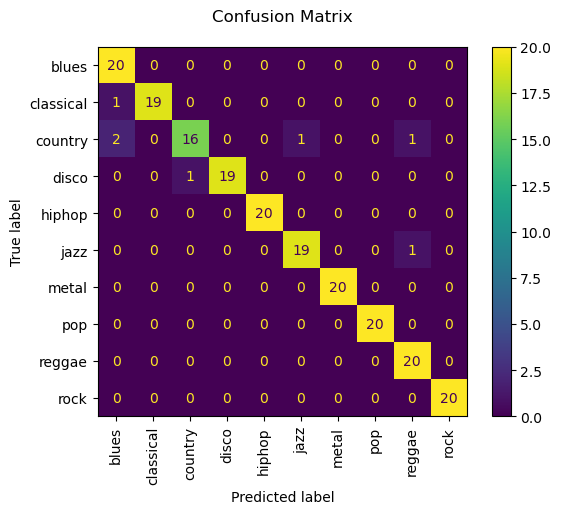

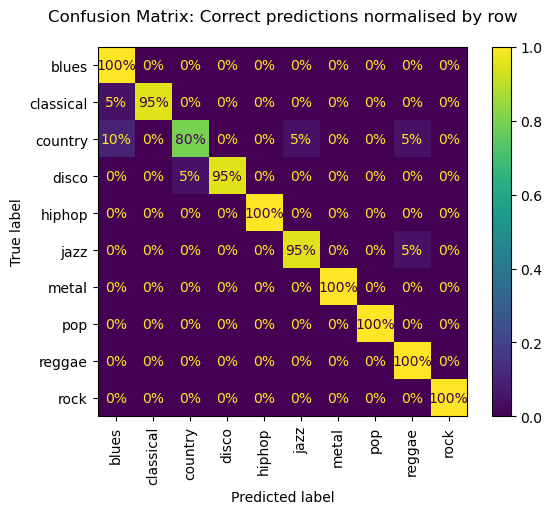

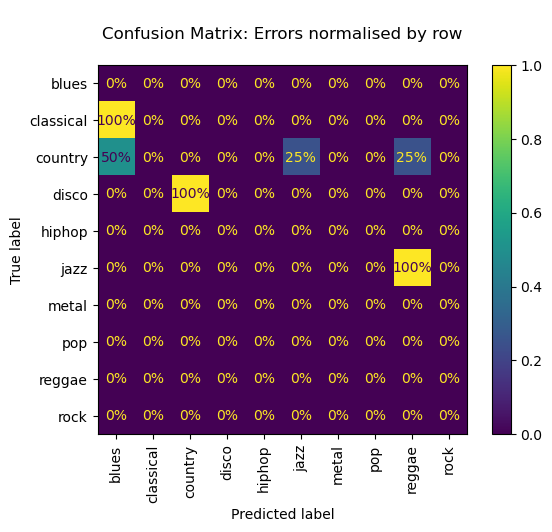

In [187]:
# print evaluetion metrics for the experiment
print("Classification Report:\n", classification_report(y_test_30s, knn_3s_on_30s_test_pred))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_test_30s, knn_3s_on_30s_test_pred,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_test_30s, knn_3s_on_30s_test_pred,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (knn_3s_on_30s_test_pred != y_test_30s) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_test_30s, knn_3s_on_30s_test_pred,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

In [ ]:
## The model trained on 3s data is performing surprisingly well on 30s test data; however, 
# I have to consider a relatively small sample of instances to predict in the test dataset.


In [189]:
# For comparison, I predic classes on the 30s test dataset but, this time, using a model trained on 30s data
# with the same hyperparameters as before and employing the same data preprocessing steps

knn_tuned_model_2 = make_pipeline(prep_19_best_features_knn,
                                   KNeighborsClassifier(
                                       n_neighbors=1,
                                       metric='manhattan',
                                       leaf_size=40,
                                       weights='uniform',
                                       p=3,
                                       algorithm='ball_tree'
                                       )
                                  ) 
# train the knn model on 30s samples and predict classes on the 30s test set 
knn_tuned_model_2.fit(X_train_30s, y_train_30s)
knn_30s_on_30s_test_pred = knn_tuned_model_2.predict(X_test_30s)

Classification Report:
               precision    recall  f1-score   support

       blues       0.61      0.70      0.65        20
   classical       0.82      0.90      0.86        20
     country       0.44      0.60      0.51        20
       disco       0.50      0.50      0.50        20
      hiphop       0.59      0.50      0.54        20
        jazz       0.64      0.70      0.67        20
       metal       0.82      0.70      0.76        20
         pop       0.74      0.70      0.72        20
      reggae       0.61      0.55      0.58        20
        rock       0.67      0.50      0.57        20

    accuracy                           0.64       200
   macro avg       0.64      0.64      0.64       200
weighted avg       0.64      0.64      0.64       200



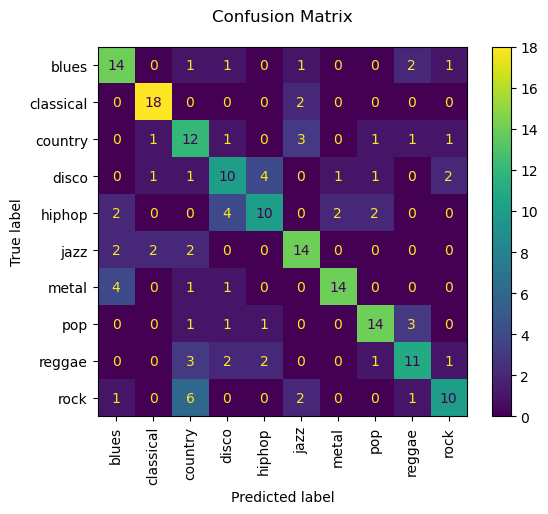

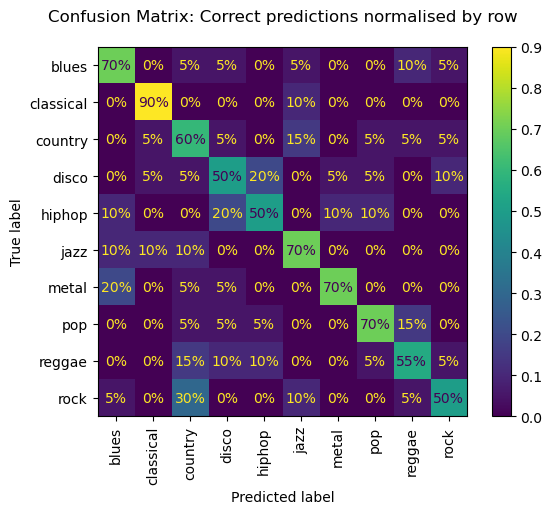

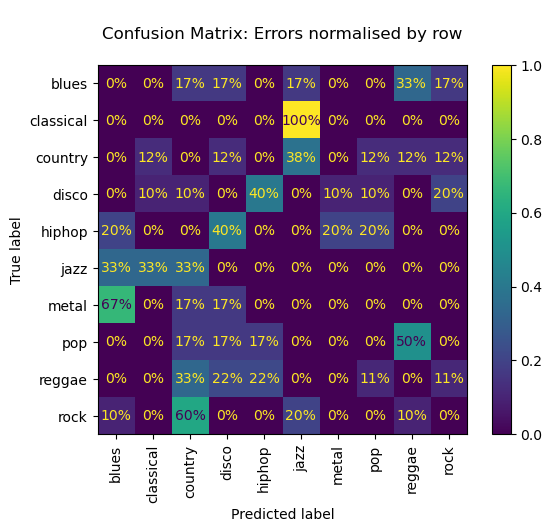

In [190]:
# print evaluetion metrics for the experiment
print("Classification Report:\n", classification_report(y_test_30s, knn_30s_on_30s_test_pred))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_test_30s, knn_30s_on_30s_test_pred,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_test_30s, knn_30s_on_30s_test_pred,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (knn_30s_on_30s_test_pred != y_test_30s) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_test_30s, knn_30s_on_30s_test_pred,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

In [ ]:
# write-up: performance is significantly worse than of the model trained on 3s samples but making predictins on 30s test data.

Classification Report:
               precision    recall  f1-score   support

       blues       0.71      0.69      0.70        80
   classical       0.89      0.89      0.89        80
     country       0.45      0.61      0.52        80
       disco       0.51      0.53      0.52        80
      hiphop       0.62      0.50      0.56        80
        jazz       0.73      0.69      0.71        80
       metal       0.77      0.72      0.75        80
         pop       0.75      0.70      0.72        80
      reggae       0.53      0.51      0.52        80
        rock       0.37      0.39      0.38        80

    accuracy                           0.62       800
   macro avg       0.63      0.62      0.63       800
weighted avg       0.63      0.62      0.63       800



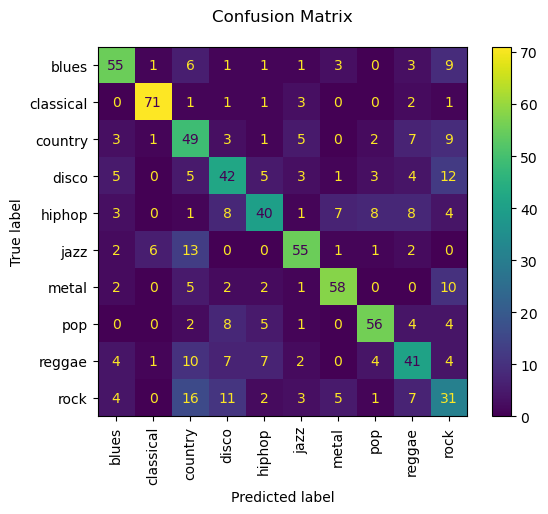

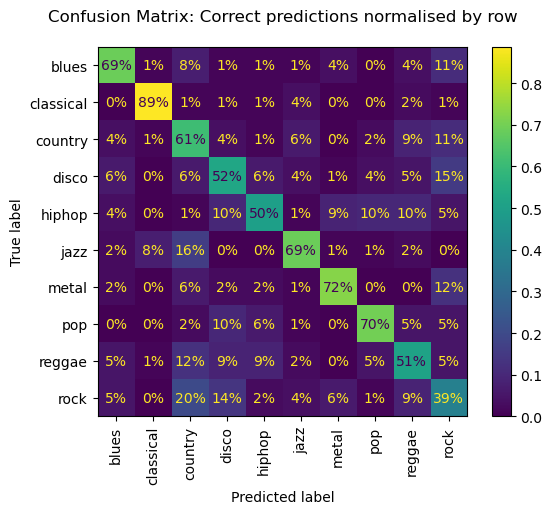

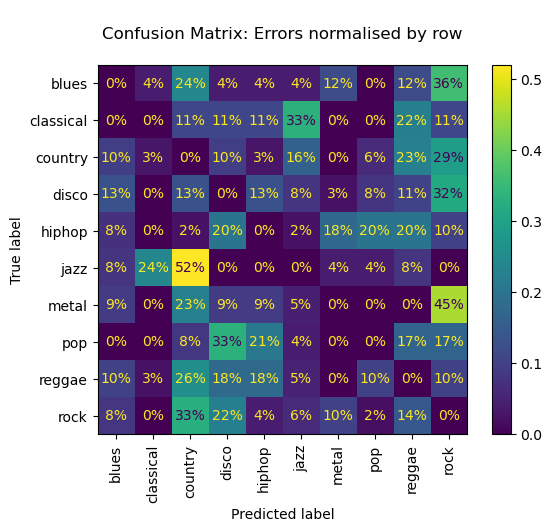

In [193]:
# I also generate cross-validated predictions for the same knn model on 30s training data

knn_train_pred_30s_CV = cross_val_predict(knn_tuned_model_2, X_train_30s, y_train_30s, cv=10, n_jobs=-1)

# print evaluetion metrics for the experiment
print("Classification Report:\n", classification_report(y_train_30s, knn_train_pred_30s_CV))

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_train_30s, knn_train_pred_30s_CV,
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix\n")
plt.show()

# Confusion Matrix with percentages of images classified correctly
ConfusionMatrixDisplay.from_predictions(y_train_30s, knn_train_pred_30s_CV,
                                       normalize="true",values_format=".0%",
                                       xticks_rotation='vertical')
plt.title("Confusion Matrix: Correct predictions normalised by row\n")
plt.show()

# Confusion Matrix with percentages of images classified incorrectly
sample_weight = (knn_train_pred_30s_CV != y_train_30s) # put zero weight on correct predictions
ConfusionMatrixDisplay.from_predictions(y_train_30s, knn_train_pred_30s_CV,
                                        sample_weight=sample_weight,
                                        normalize="true",values_format=".0%",
                                        xticks_rotation='vertical')
plt.title("\nConfusion Matrix: Errors normalised by row\n")
plt.show()

write-up: The cross-validated predictions on the 30s dataset suggest there may be a significant positive difference in  performance of 3s knn model over 30s model; however, small test sample that was used the experiment justifies causion in drawing final conclusions. These interesting findings need to be re-evaluated with more "unseen" 30s data.


## Summary

## Reflections

### Ethics

### Learning Journey

## References

Demsar, J. (2006) Statistical Comparisons of Classifiers Over Multiple Data Sets. *Journal of Machine Learning Research* [online]. 7, p. 8. [Accessed 07 December 2024].